# Build and train MB-SupCon

In [1]:
import matplotlib.pyplot as plt
import os
import math
import numpy as np
import pandas as pd
import re
import sys

from scipy.stats import spearmanr
#import skimage

import time
import torch
import torch.hub
import torch.nn

import random

# import self-defined MB-SupCon module
from mbsupcon import MbSupConModel

In [2]:
print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.device(0))
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
0
4
Tesla V100-SXM2-32GB


In [3]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

## 1 Load data

In [4]:
gut_16s_df = pd.read_table("./data/gut_16s_abundance.txt", index_col=0)
metabolome_df = pd.read_table("./data/metabolome_abundance.txt", index_col=0)
metabolome_df = metabolome_df.drop(columns=['SubjectID', 'CollectionDate', 'CL1', 'CL2', 'CL3', 'CL4'])

In [5]:
subjects = pd.read_csv("./data/subjects.csv", na_values="NA")
copy_gut_16s_df = gut_16s_df.copy()
copy_gut_16s_df['SubjectID'] = [copy_gut_16s_df.index[i][0:7] for i in range(len(copy_gut_16s_df.index))]
gut_16s_df_subj = pd.merge(left=copy_gut_16s_df, right=subjects, how='left', on='SubjectID')
gut_16s_df_subj.index = copy_gut_16s_df.index

In [6]:
# Get indexes for shared patient ids
indexes = list(set(gut_16s_df.index.values) & set(metabolome_df.index.values))
indexes.sort()
print("# of samples: {}".format(len(indexes)))

# of samples: 720


## 2 Train MB-SupCon with different categorical covariates and store embeddings

In [7]:
DEVICE = "cuda:0"
N_EPOCH = 1000

random_seed_list = range(1,13)
SAVE_FOLDER = './'
covariate_list = ['IR_IS_classification', 'Sex', 'Race']

## From 1b-v - save and visualize the tuning results_random seeds_1-12
max_idx = dict(list(zip(covariate_list, [(2, 5, 1), (1, 4, 0), (0, 2, 0)])))


IR_IS_classification
n train: 382
n val: 81
n test: 84


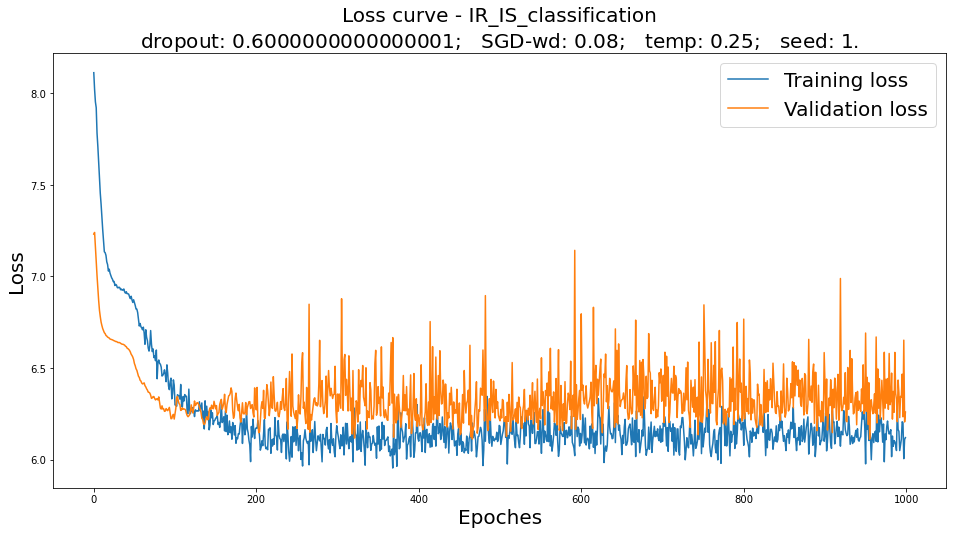

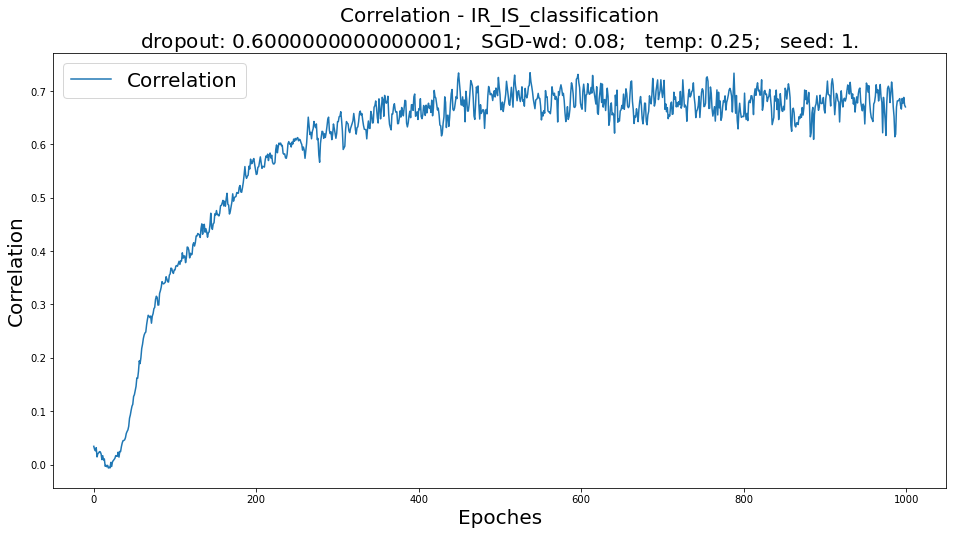

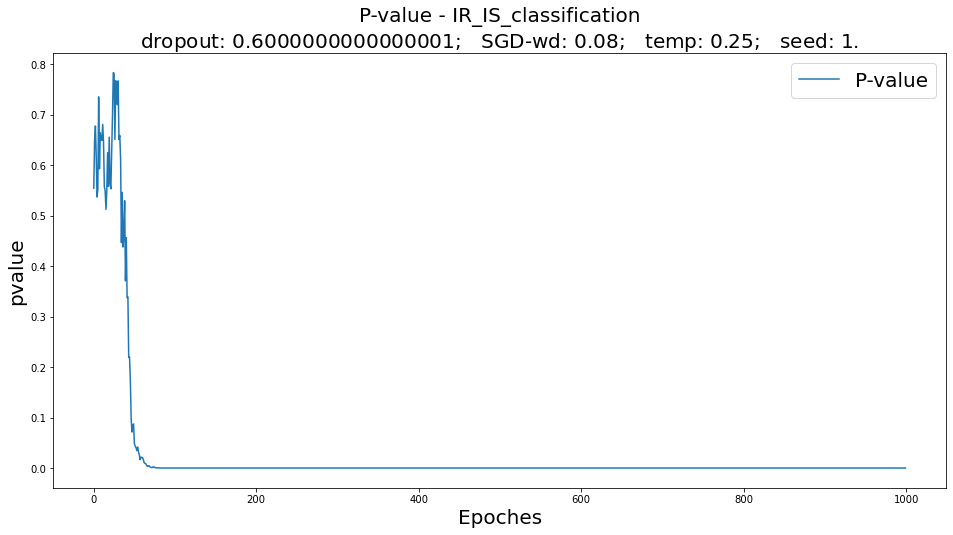

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,80.25%,85.71%
svm,79.01%,85.71%
rf,82.72%,84.52%


Prediction based on original microbiome data:


,Validation,Testing
logistic,79.01%,78.57%
svm,74.07%,75.00%
rf,77.78%,84.52%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,96.30%,95.24%
svm,96.30%,95.24%
rf,95.06%,95.24%


Prediction based on original metabolome data:


,Validation,Testing
logistic,93.83%,95.24%
svm,92.59%,84.52%
rf,96.30%,95.24%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


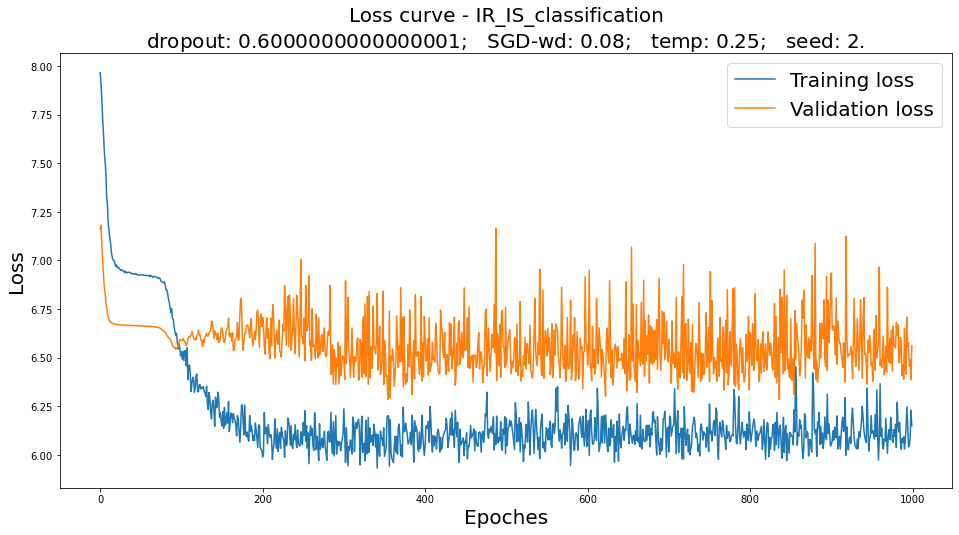

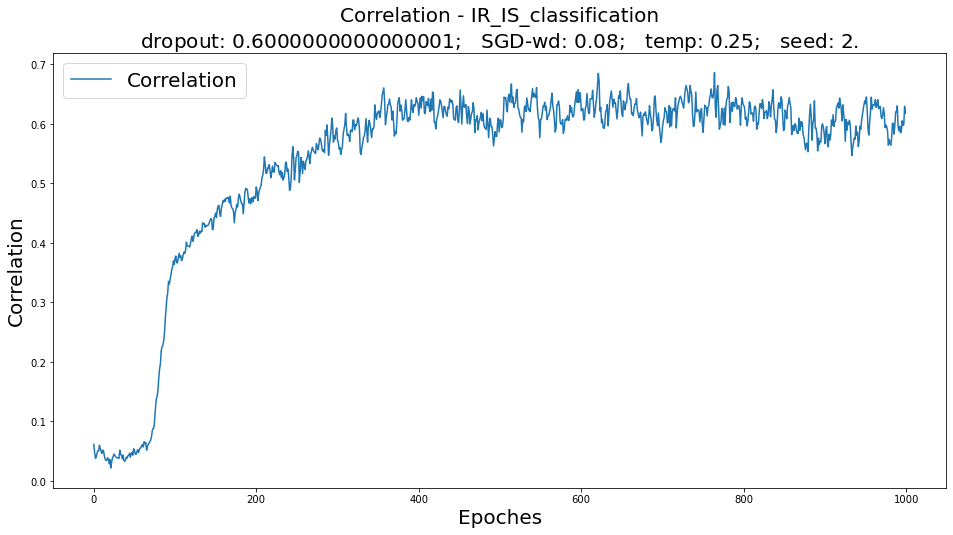

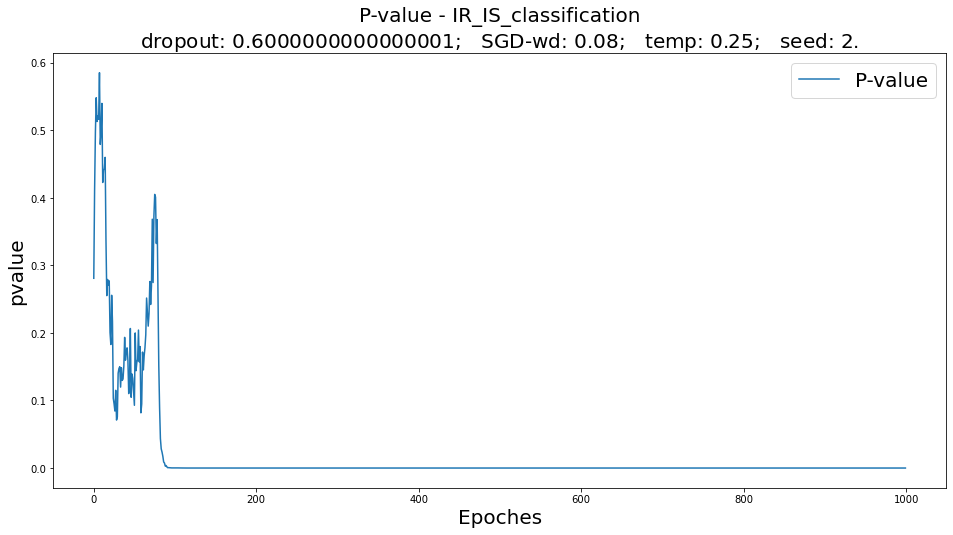

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,77.78%,85.71%
svm,80.25%,85.71%
rf,82.72%,86.90%


Prediction based on original microbiome data:


,Validation,Testing
logistic,71.60%,77.38%
svm,74.07%,77.38%
rf,82.72%,88.10%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,96.30%,90.48%
svm,97.53%,90.48%
rf,97.53%,90.48%


Prediction based on original metabolome data:


,Validation,Testing
logistic,96.30%,90.48%
svm,92.59%,92.86%
rf,95.06%,94.05%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


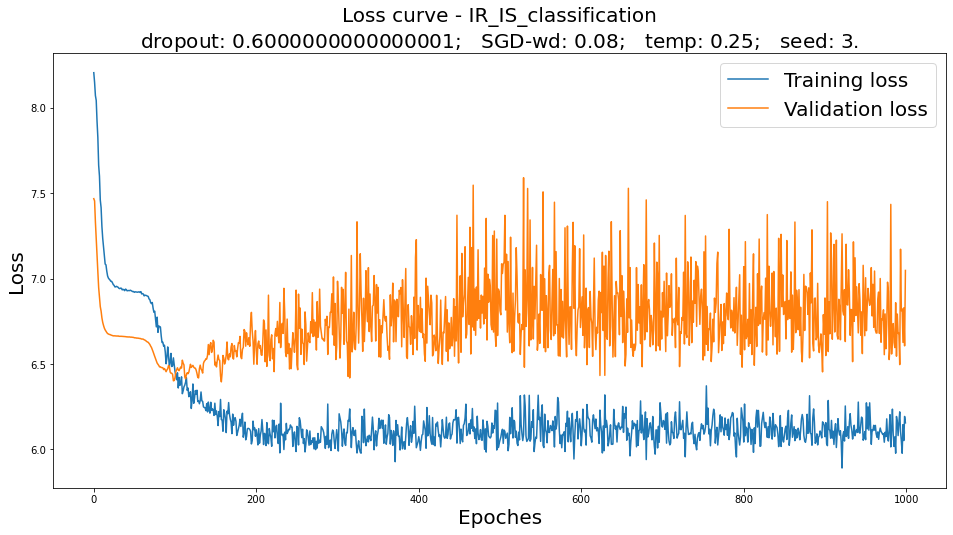

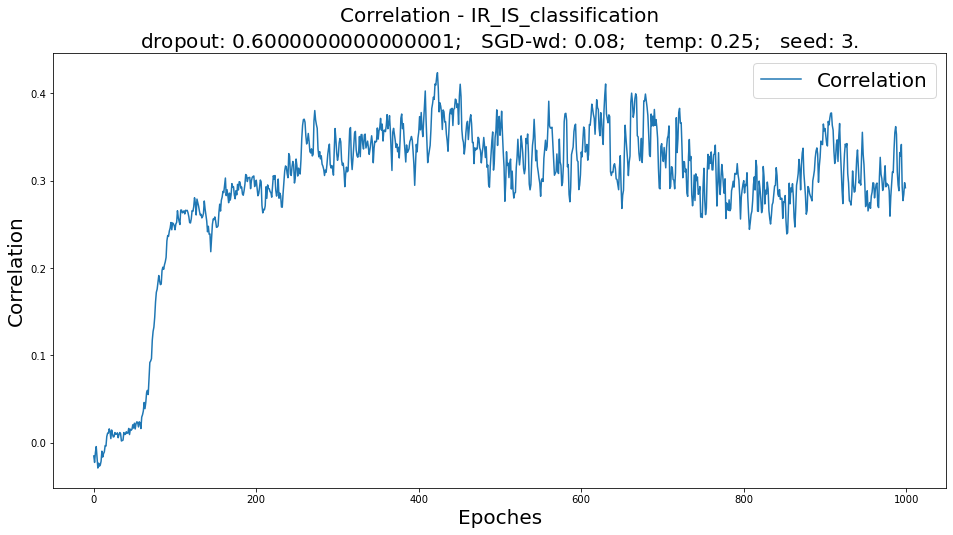

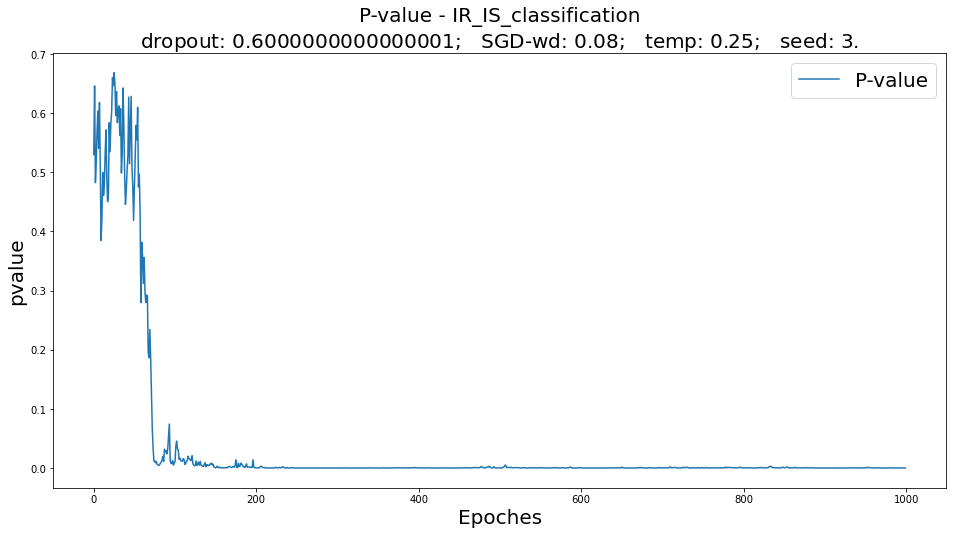

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,75.31%,89.29%
svm,75.31%,89.29%
rf,77.78%,91.67%


Prediction based on original microbiome data:


,Validation,Testing
logistic,69.14%,76.19%
svm,74.07%,82.14%
rf,82.72%,85.71%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,95.06%,100.00%
svm,95.06%,100.00%
rf,95.06%,100.00%


Prediction based on original metabolome data:


,Validation,Testing
logistic,92.59%,97.62%
svm,91.36%,92.86%
rf,87.65%,95.24%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


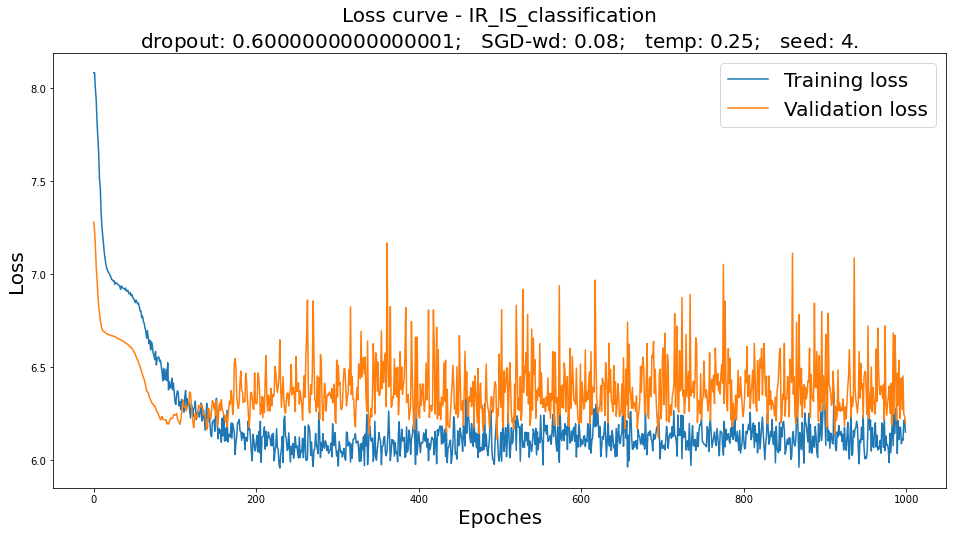

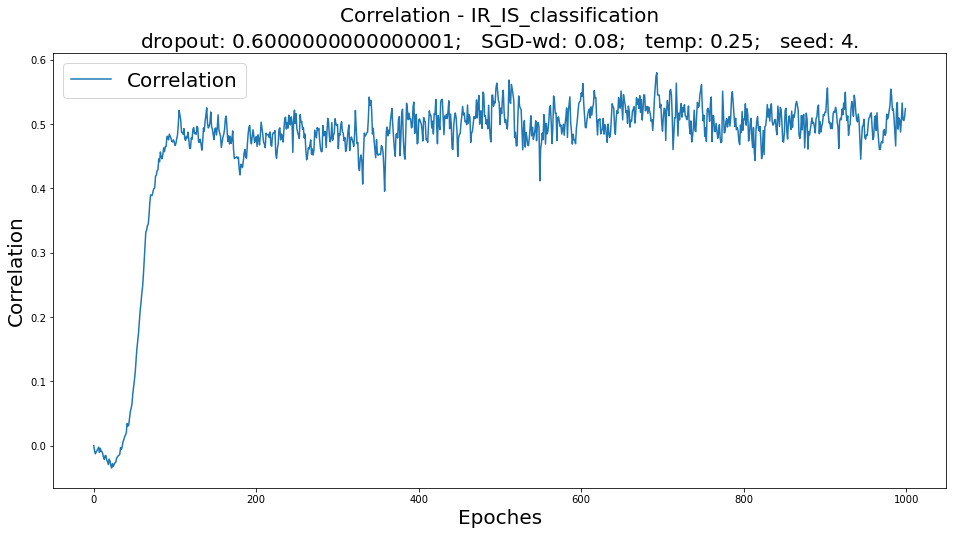

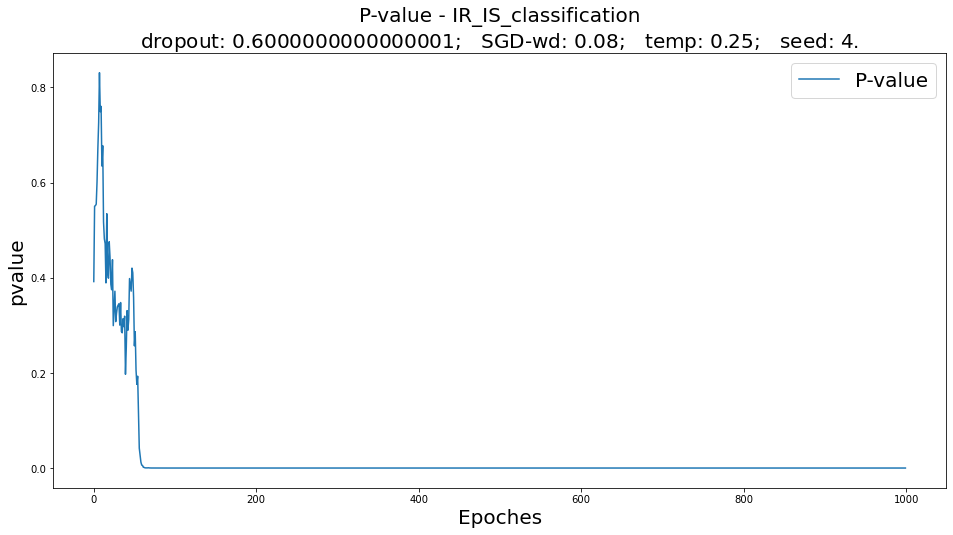

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,85.19%,80.95%
svm,83.95%,79.76%
rf,86.42%,80.95%


Prediction based on original microbiome data:


,Validation,Testing
logistic,81.48%,75.00%
svm,81.48%,75.00%
rf,81.48%,82.14%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,97.53%,97.62%
svm,97.53%,97.62%
rf,97.53%,97.62%


Prediction based on original metabolome data:


,Validation,Testing
logistic,95.06%,97.62%
svm,96.30%,91.67%
rf,91.36%,91.67%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


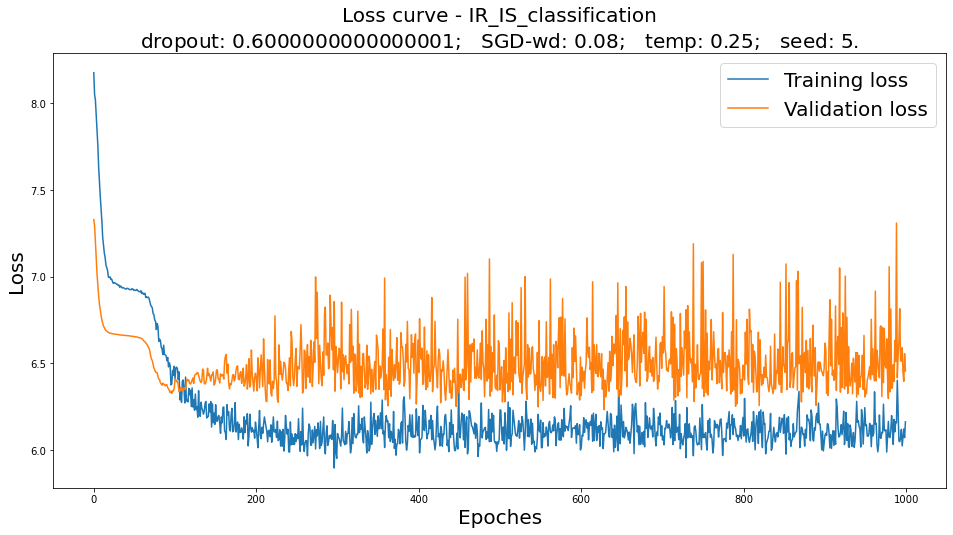

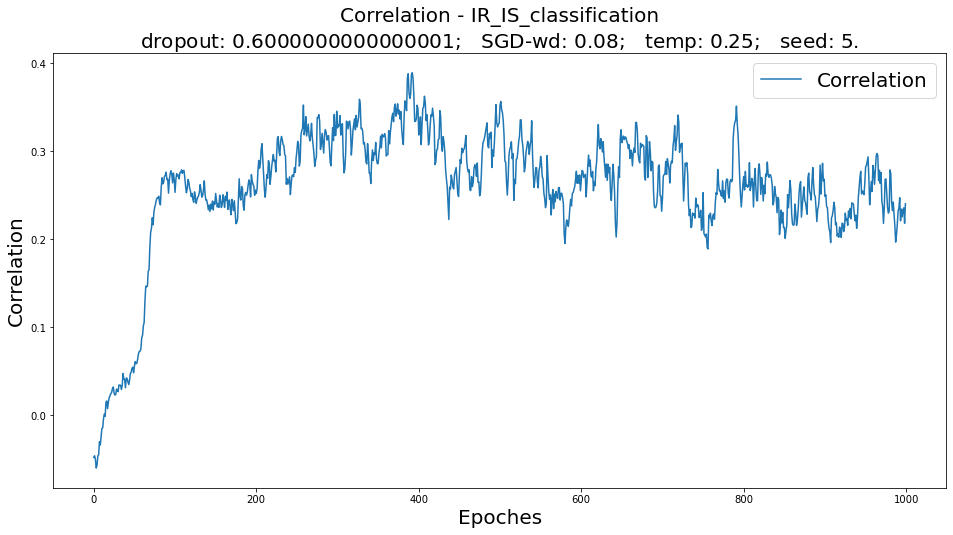

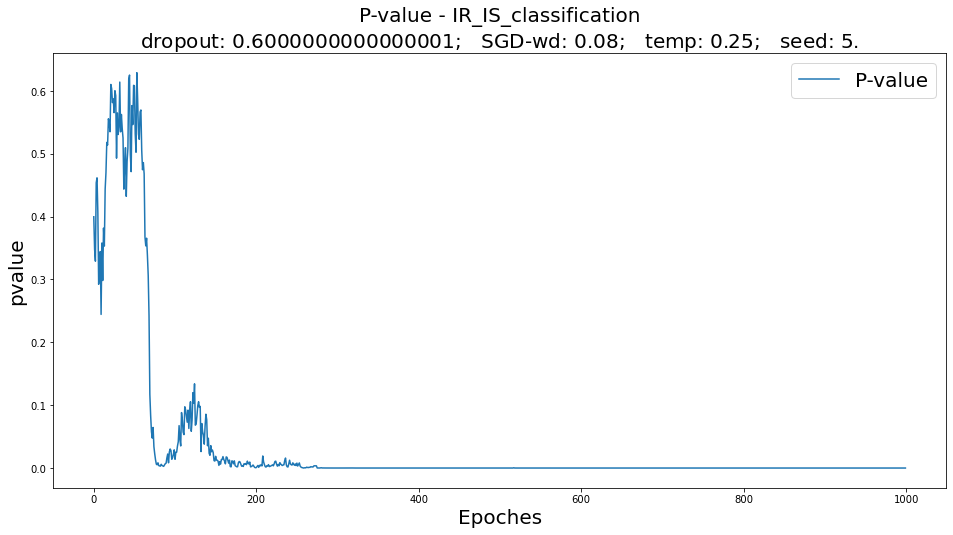

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.48%,80.95%
svm,80.25%,82.14%
rf,77.78%,80.95%


Prediction based on original microbiome data:


,Validation,Testing
logistic,74.07%,72.62%
svm,81.48%,76.19%
rf,83.95%,79.76%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,95.06%,96.43%
svm,95.06%,96.43%
rf,95.06%,96.43%


Prediction based on original metabolome data:


,Validation,Testing
logistic,93.83%,95.24%
svm,91.36%,97.62%
rf,96.30%,97.62%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


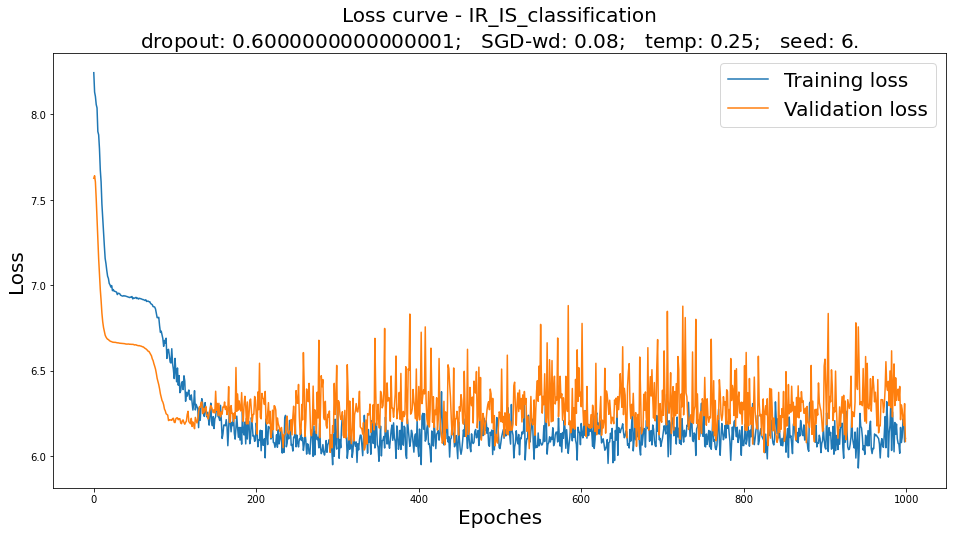

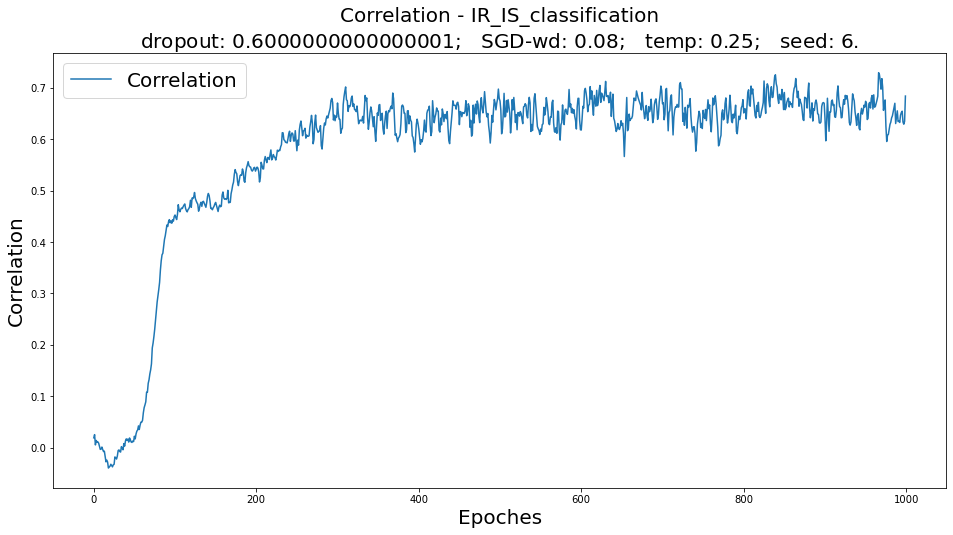

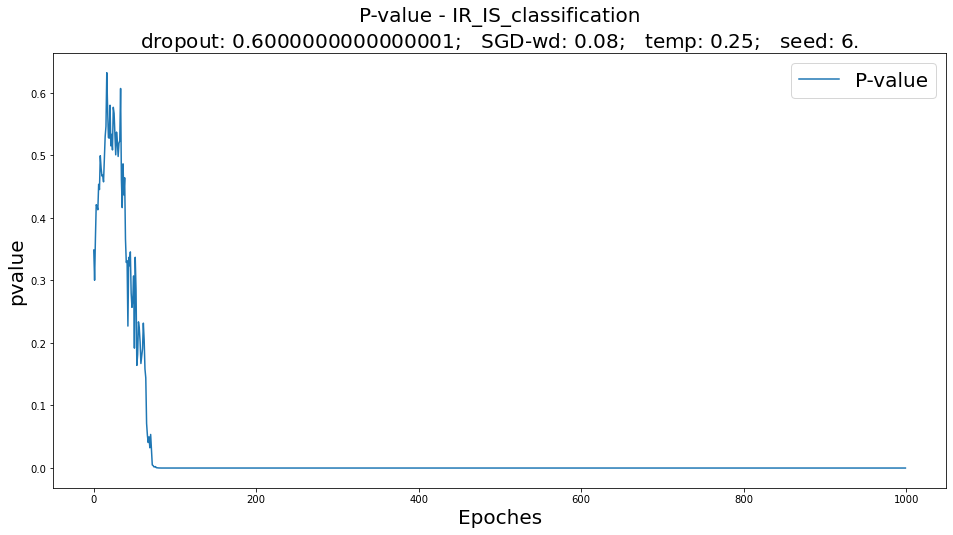

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,86.42%,82.14%
svm,86.42%,82.14%
rf,86.42%,80.95%


Prediction based on original microbiome data:


,Validation,Testing
logistic,79.01%,79.76%
svm,83.95%,77.38%
rf,83.95%,85.71%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.77%,97.62%
svm,98.77%,97.62%
rf,98.77%,97.62%


Prediction based on original metabolome data:


,Validation,Testing
logistic,97.53%,97.62%
svm,92.59%,100.00%
rf,96.30%,97.62%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


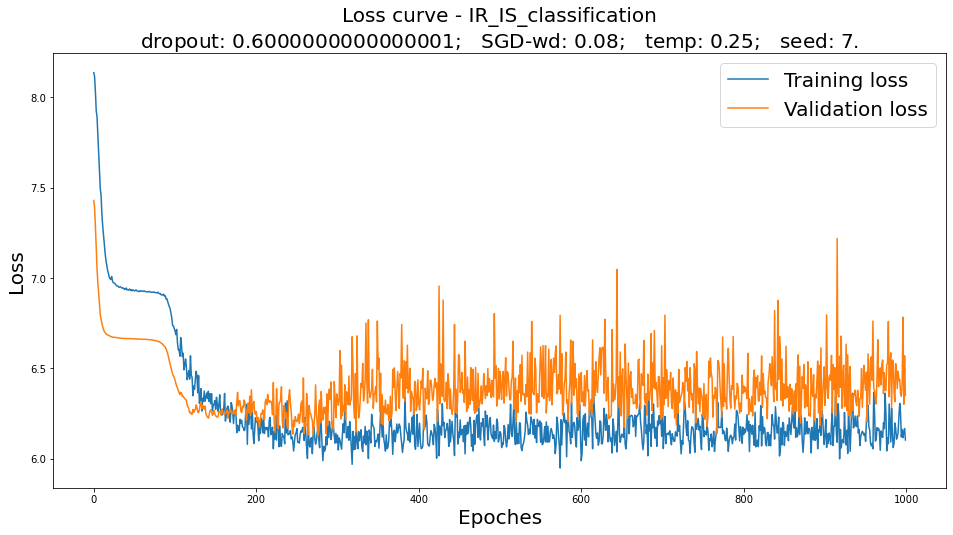

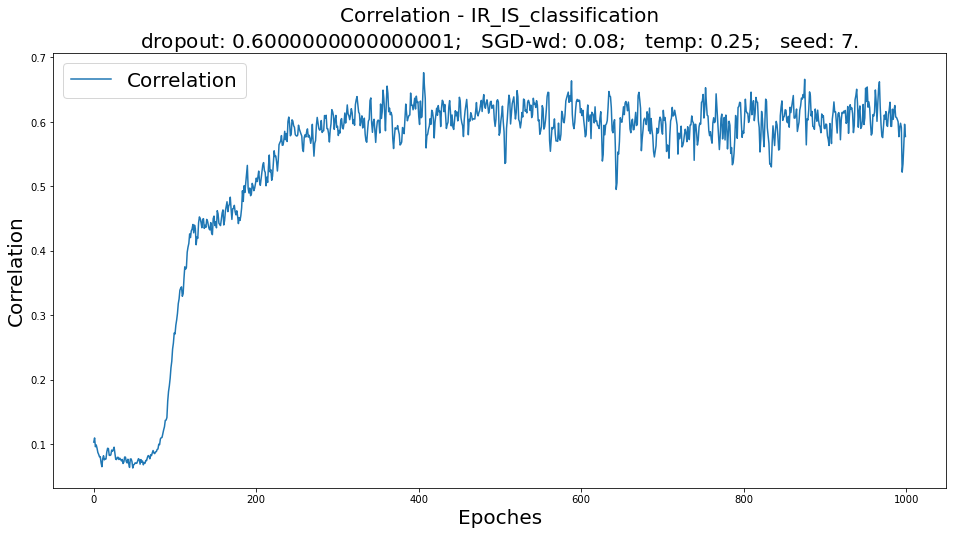

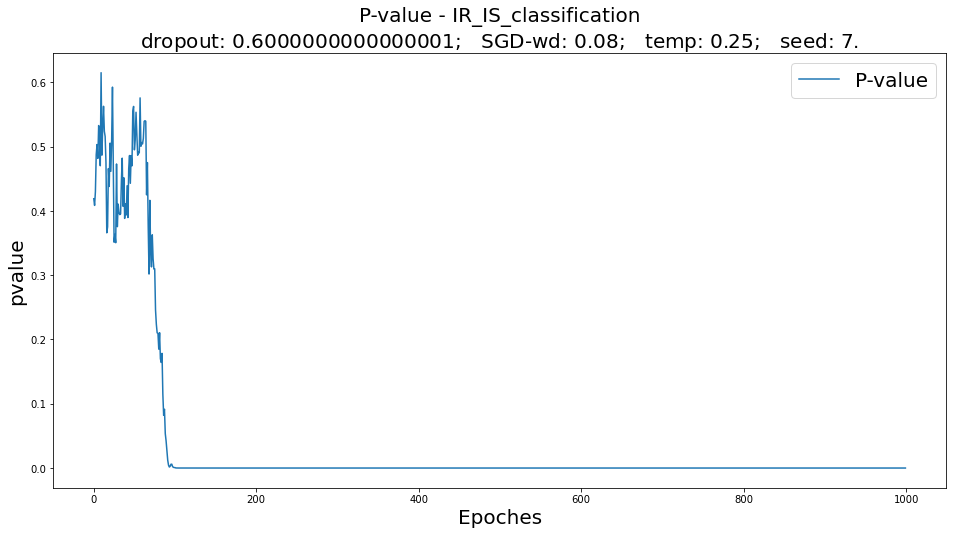

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.72%,85.71%
svm,82.72%,88.10%
rf,82.72%,86.90%


Prediction based on original microbiome data:


,Validation,Testing
logistic,76.54%,83.33%
svm,79.01%,84.52%
rf,87.65%,85.71%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,92.59%,96.43%
svm,93.83%,96.43%
rf,93.83%,96.43%


Prediction based on original metabolome data:


,Validation,Testing
logistic,95.06%,96.43%
svm,88.89%,92.86%
rf,92.59%,90.48%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


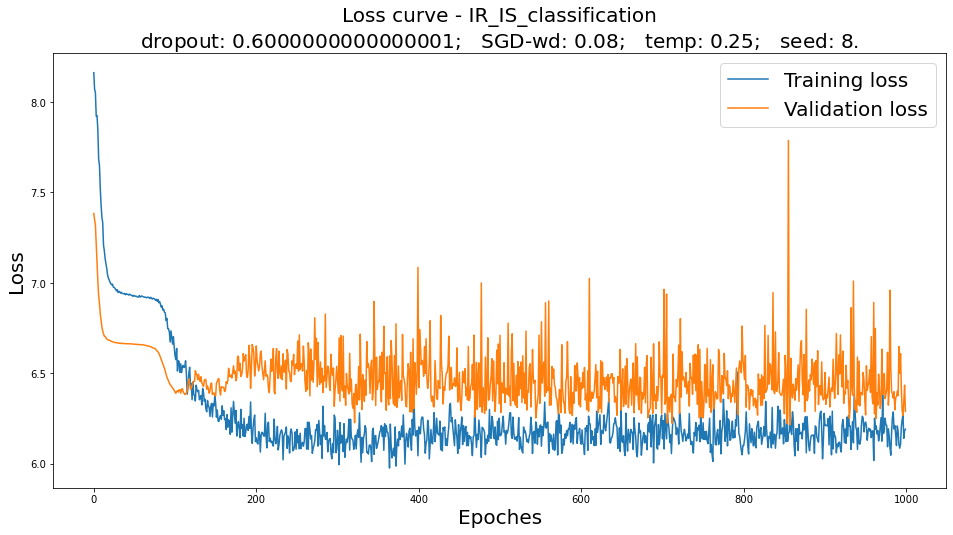

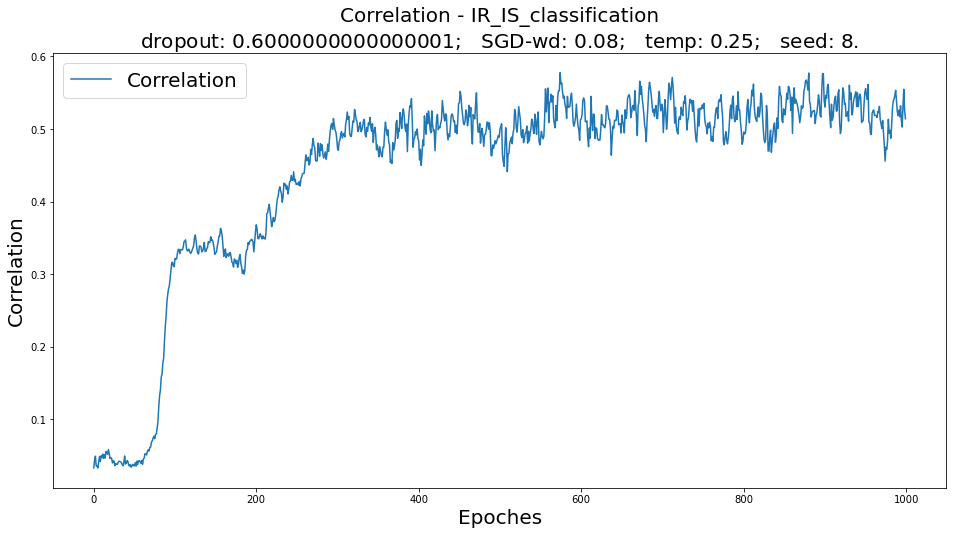

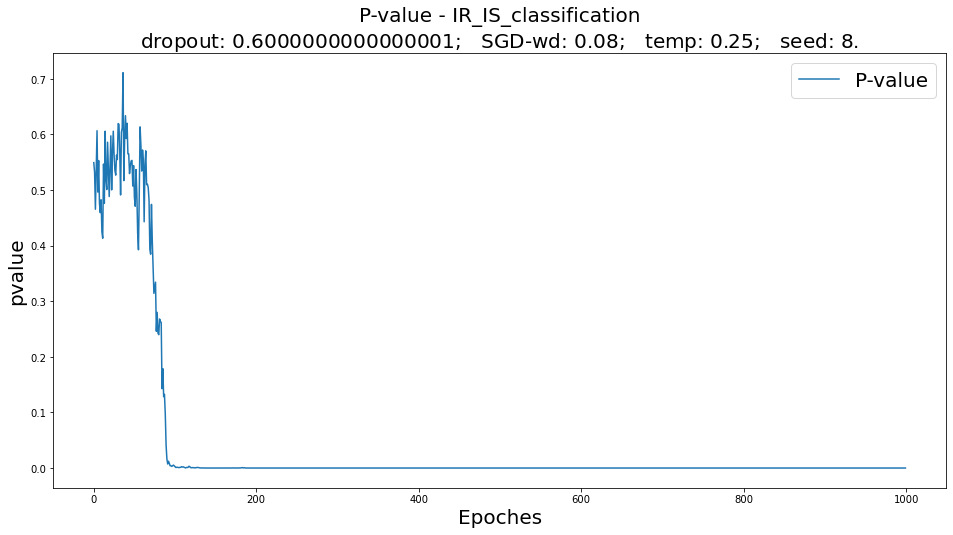

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,85.19%,91.67%
svm,85.19%,91.67%
rf,83.95%,90.48%


Prediction based on original microbiome data:


,Validation,Testing
logistic,77.78%,83.33%
svm,80.25%,86.90%
rf,87.65%,85.71%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,96.30%,96.43%
svm,96.30%,96.43%
rf,96.30%,96.43%


Prediction based on original metabolome data:


,Validation,Testing
logistic,95.06%,96.43%
svm,90.12%,95.24%
rf,95.06%,95.24%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


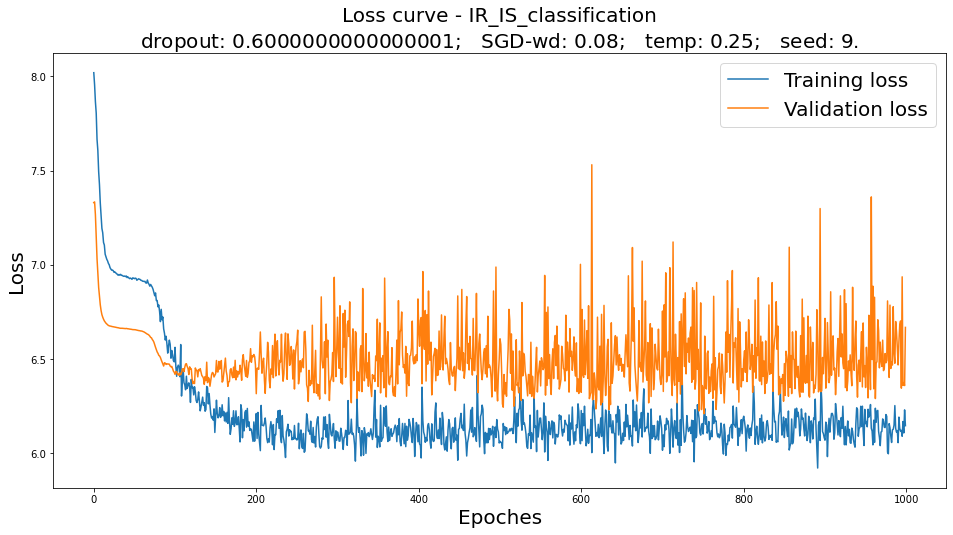

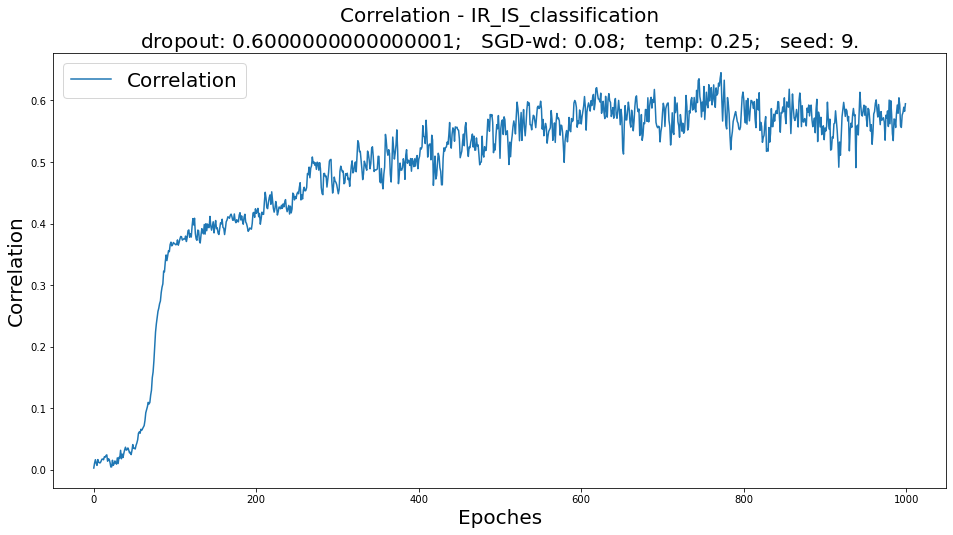

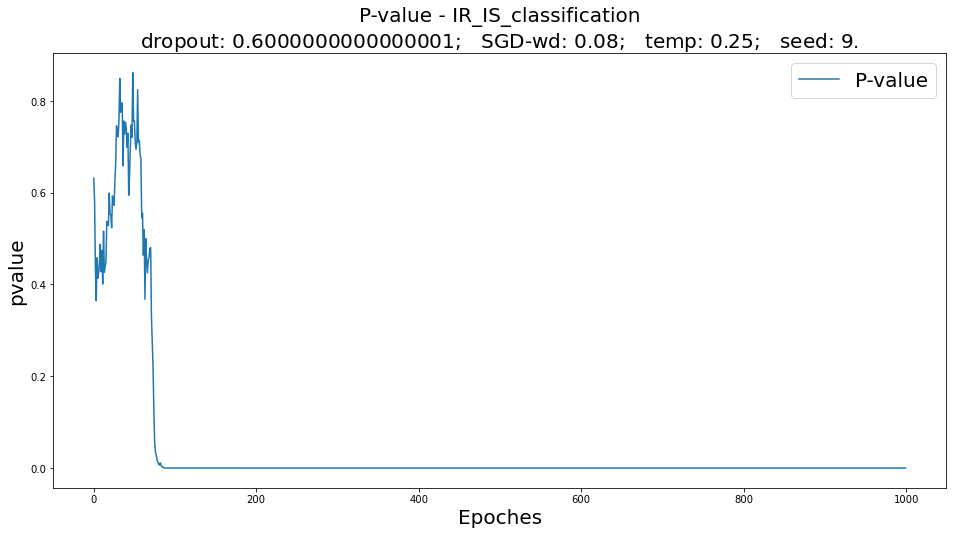

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,80.25%,82.14%
svm,81.48%,82.14%
rf,80.25%,80.95%


Prediction based on original microbiome data:


,Validation,Testing
logistic,72.84%,72.62%
svm,82.72%,75.00%
rf,82.72%,79.76%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.77%,98.81%
svm,98.77%,98.81%
rf,98.77%,98.81%


Prediction based on original metabolome data:


,Validation,Testing
logistic,98.77%,94.05%
svm,90.12%,92.86%
rf,92.59%,91.67%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


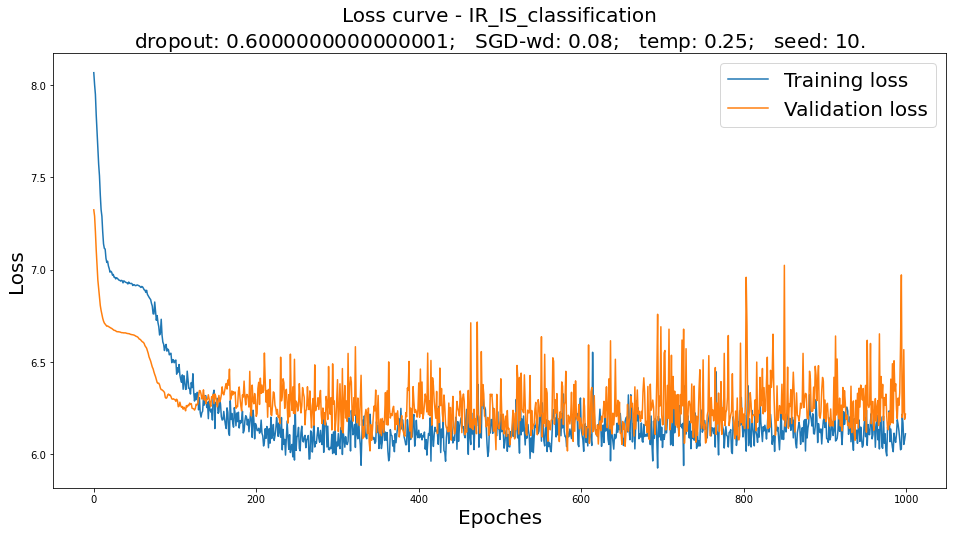

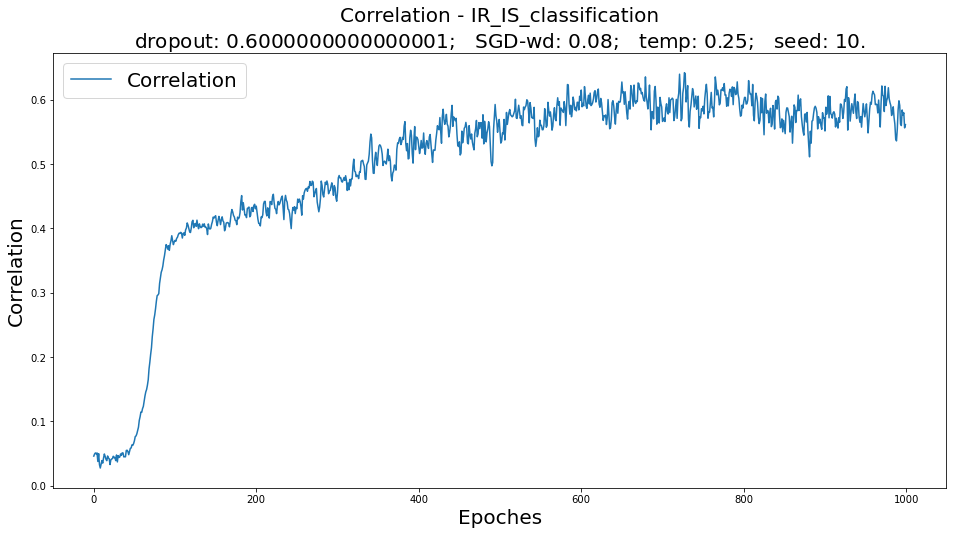

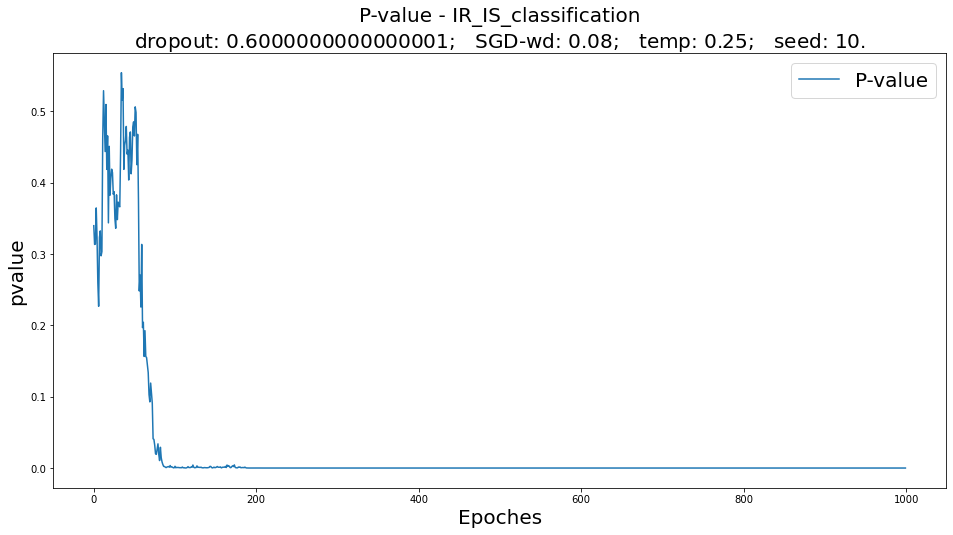

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.72%,84.52%
svm,82.72%,86.90%
rf,82.72%,86.90%


Prediction based on original microbiome data:


,Validation,Testing
logistic,80.25%,71.43%
svm,80.25%,79.76%
rf,87.65%,83.33%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.77%,97.62%
svm,97.53%,97.62%
rf,98.77%,97.62%


Prediction based on original metabolome data:


,Validation,Testing
logistic,96.30%,97.62%
svm,87.65%,86.90%
rf,92.59%,94.05%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


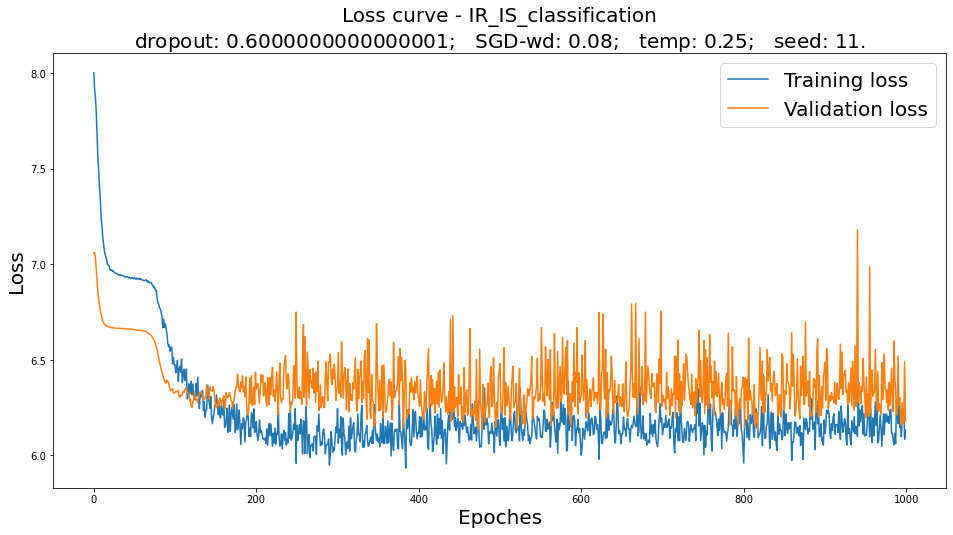

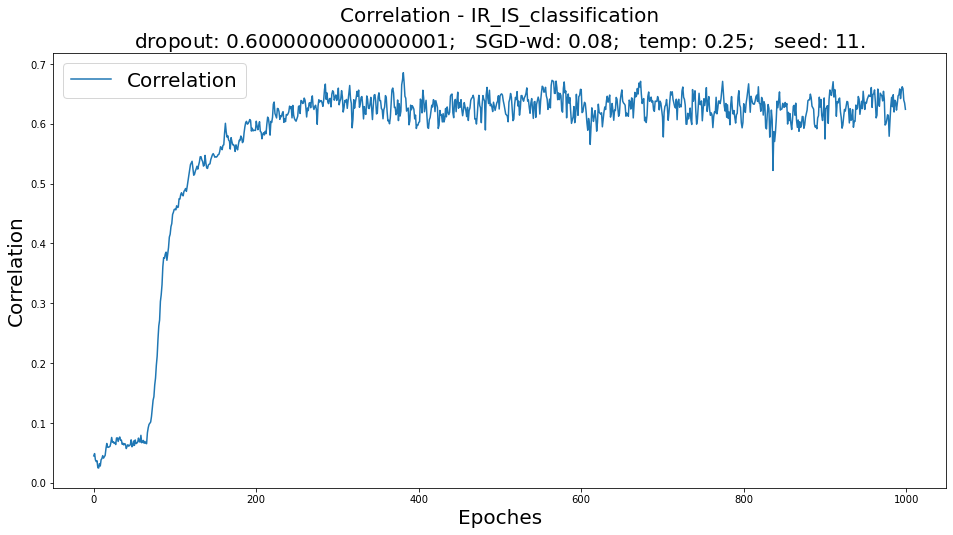

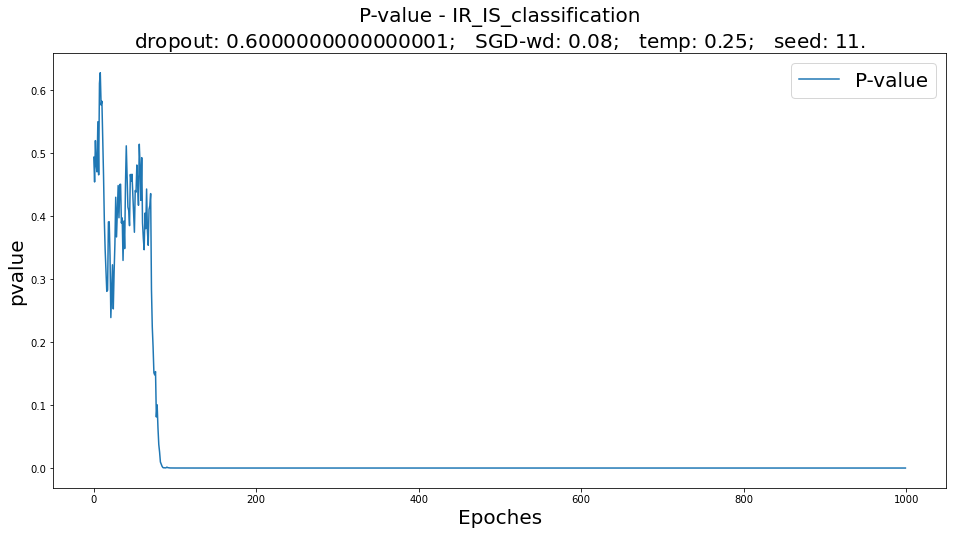

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,90.12%,82.14%
svm,90.12%,80.95%
rf,88.89%,79.76%


Prediction based on original microbiome data:


,Validation,Testing
logistic,74.07%,71.43%
svm,82.72%,78.57%
rf,87.65%,88.10%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,97.53%,94.05%
svm,97.53%,96.43%
rf,96.30%,96.43%


Prediction based on original metabolome data:


,Validation,Testing
logistic,98.77%,97.62%
svm,93.83%,90.48%
rf,95.06%,96.43%


------------------------------------------------------------------

IR_IS_classification
n train: 382
n val: 81
n test: 84


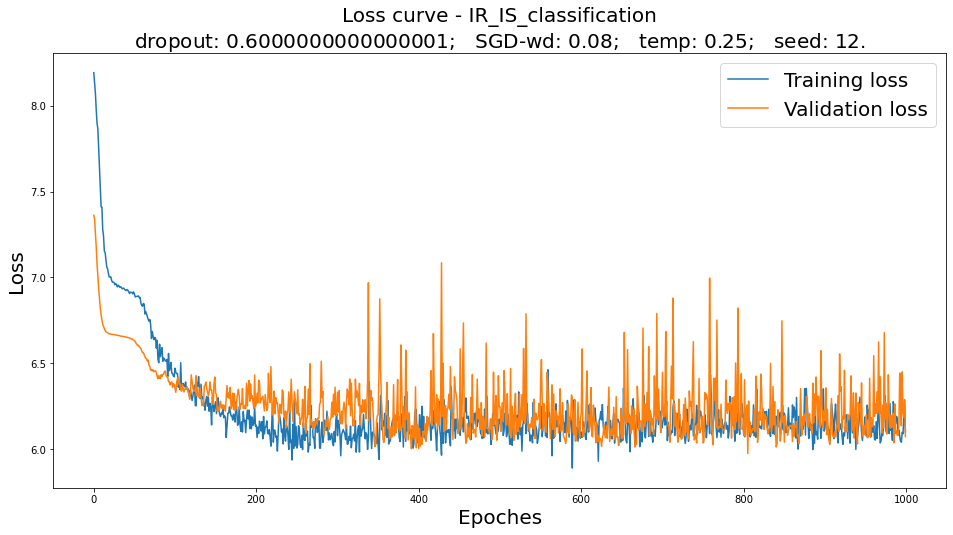

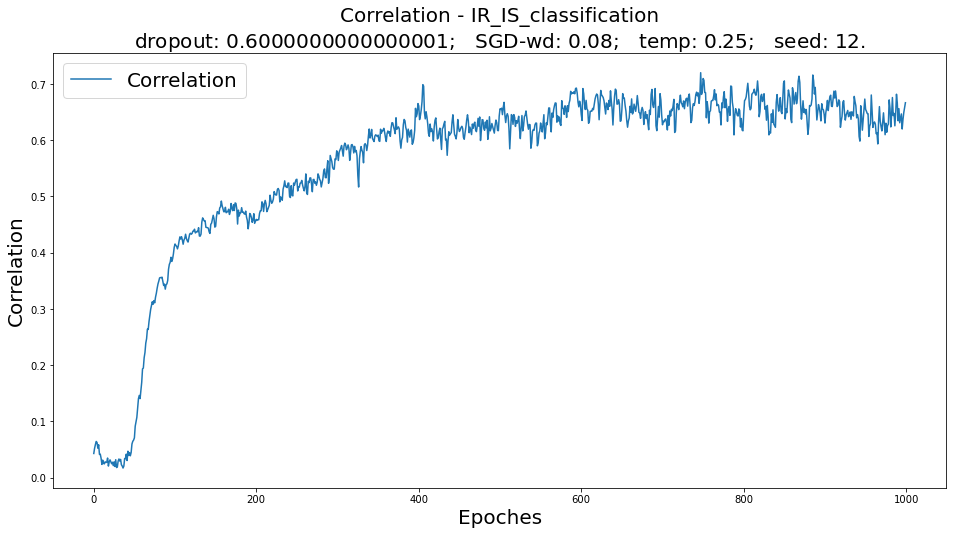

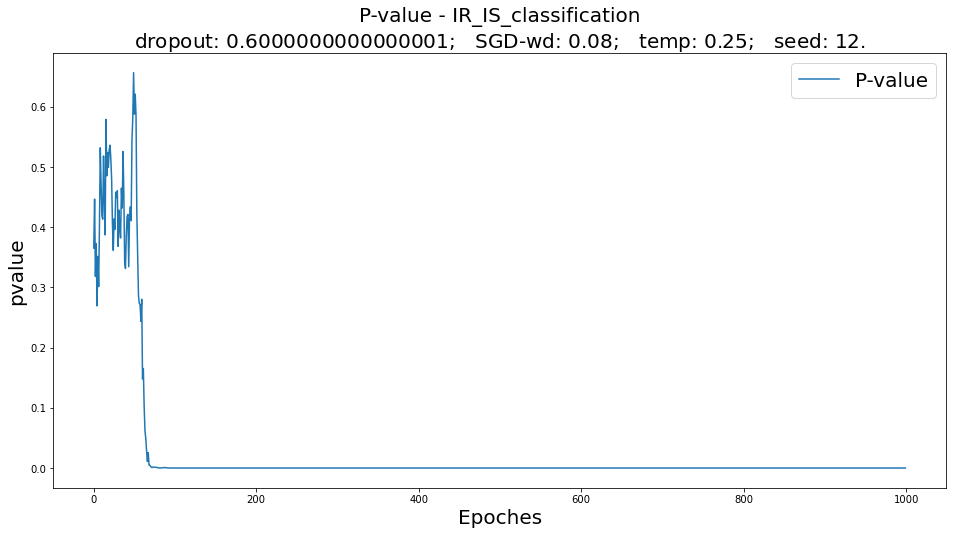

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,91.36%,82.14%
svm,91.36%,86.90%
rf,90.12%,84.52%


Prediction based on original microbiome data:


,Validation,Testing
logistic,79.01%,78.57%
svm,81.48%,85.71%
rf,88.89%,78.57%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,95.06%,95.24%
svm,95.06%,95.24%
rf,95.06%,95.24%


Prediction based on original metabolome data:


,Validation,Testing
logistic,93.83%,94.05%
svm,92.59%,95.24%
rf,95.06%,96.43%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


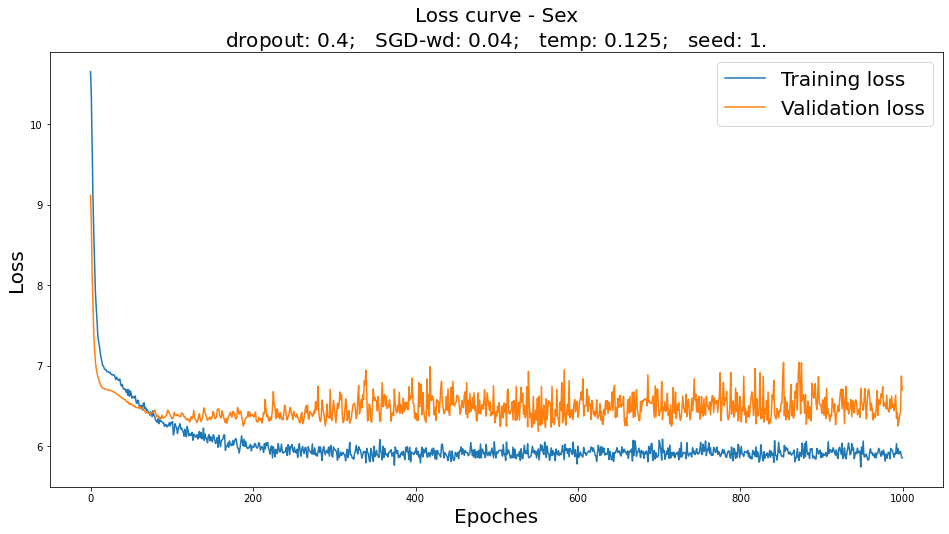

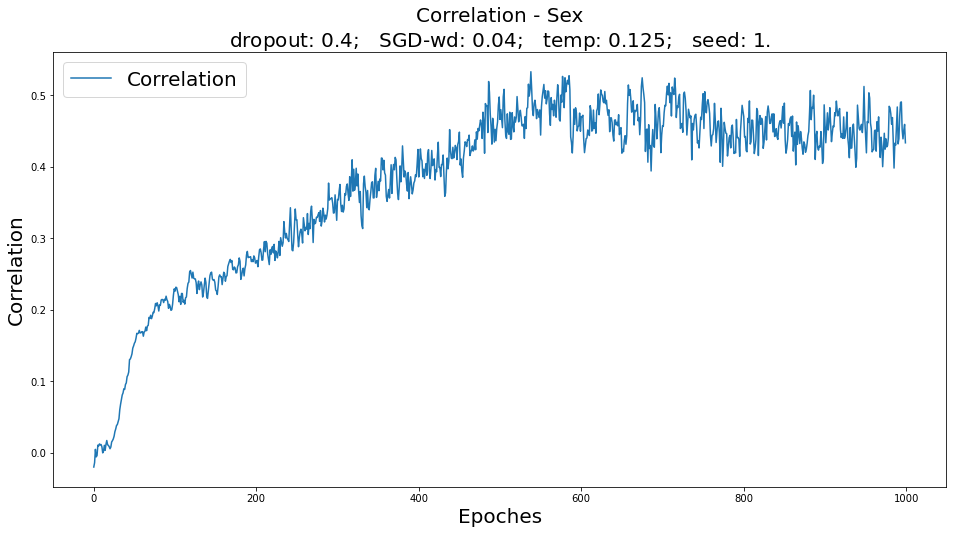

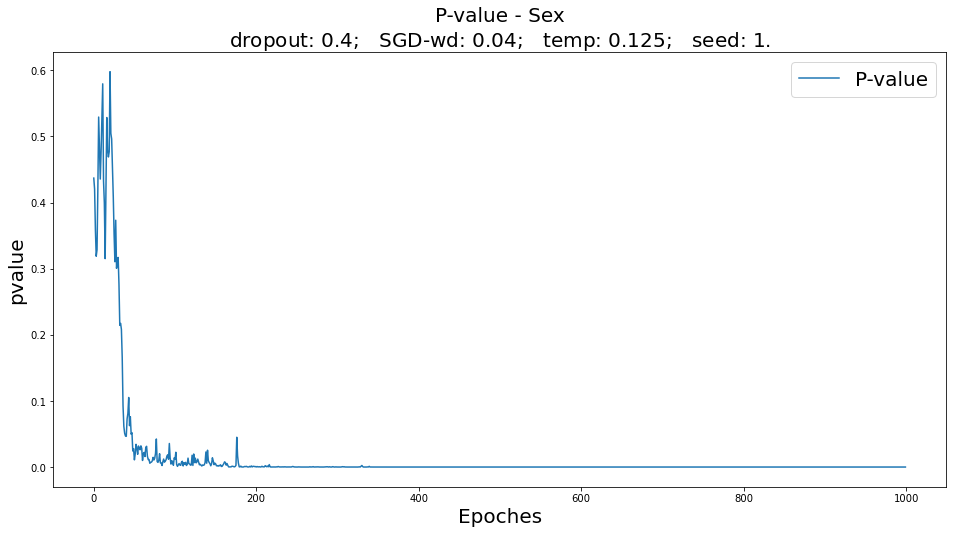

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.31%,78.18%
svm,81.31%,77.27%
rf,81.31%,78.18%


Prediction based on original microbiome data:


,Validation,Testing
logistic,67.29%,65.45%
svm,71.96%,70.00%
rf,81.31%,82.73%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.13%,99.09%
svm,97.20%,99.09%
rf,97.20%,99.09%


Prediction based on original metabolome data:


,Validation,Testing
logistic,99.07%,100.00%
svm,96.26%,99.09%
rf,97.20%,100.00%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


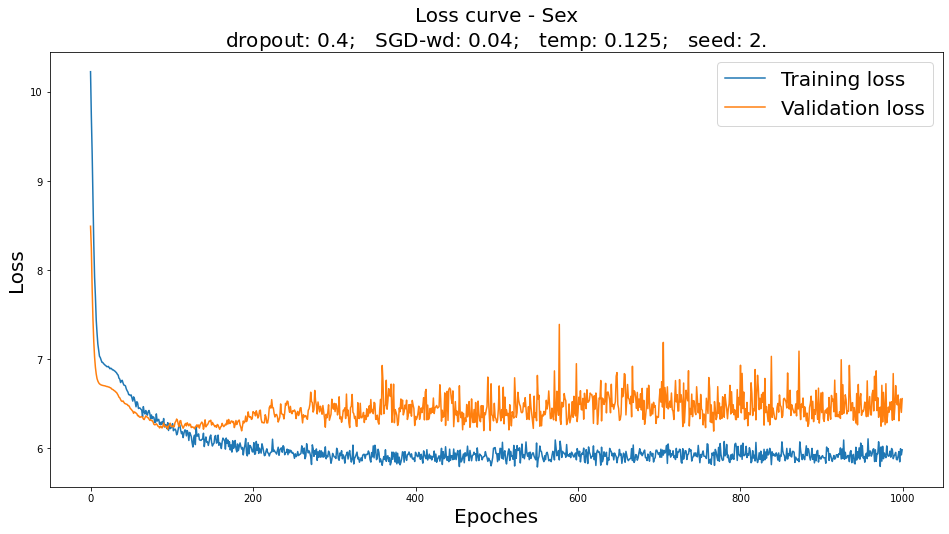

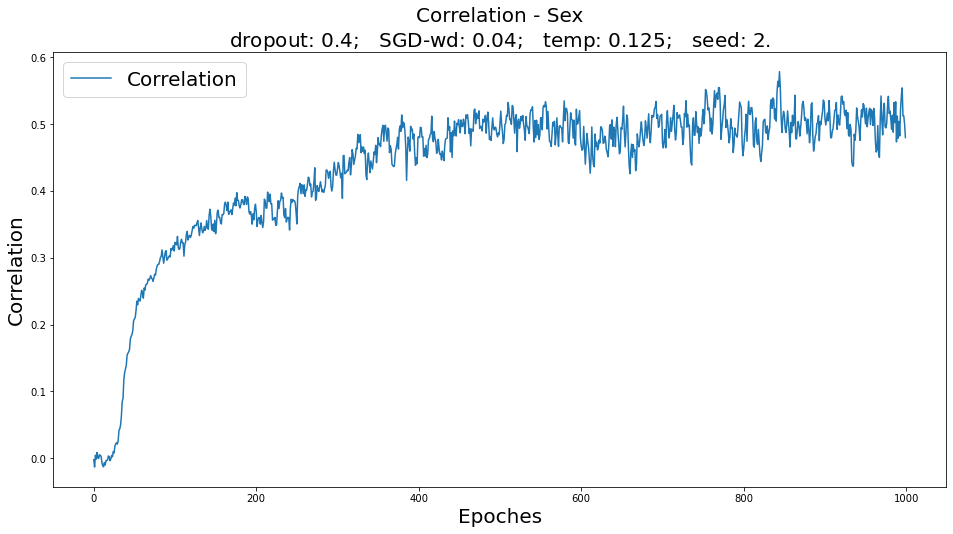

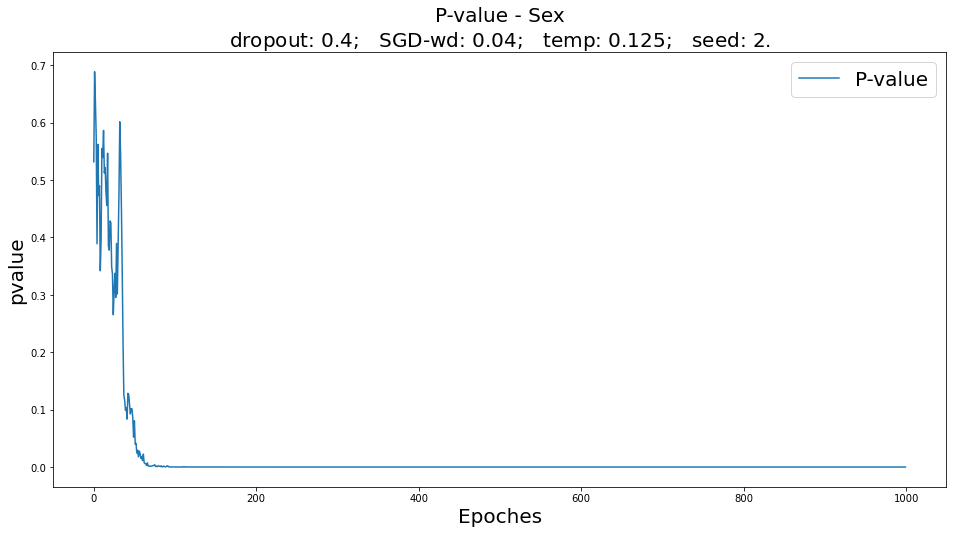

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.31%,80.00%
svm,80.37%,77.27%
rf,80.37%,78.18%


Prediction based on original microbiome data:


,Validation,Testing
logistic,69.16%,63.64%
svm,73.83%,63.64%
rf,78.50%,77.27%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,97.20%,98.18%
svm,97.20%,97.27%
rf,97.20%,97.27%


Prediction based on original metabolome data:


,Validation,Testing
logistic,97.20%,99.09%
svm,96.26%,99.09%
rf,98.13%,96.36%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


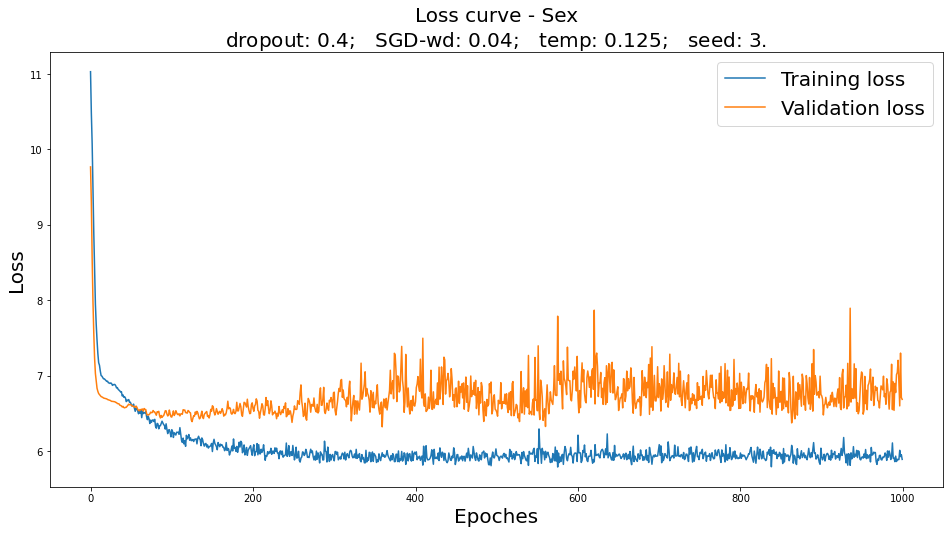

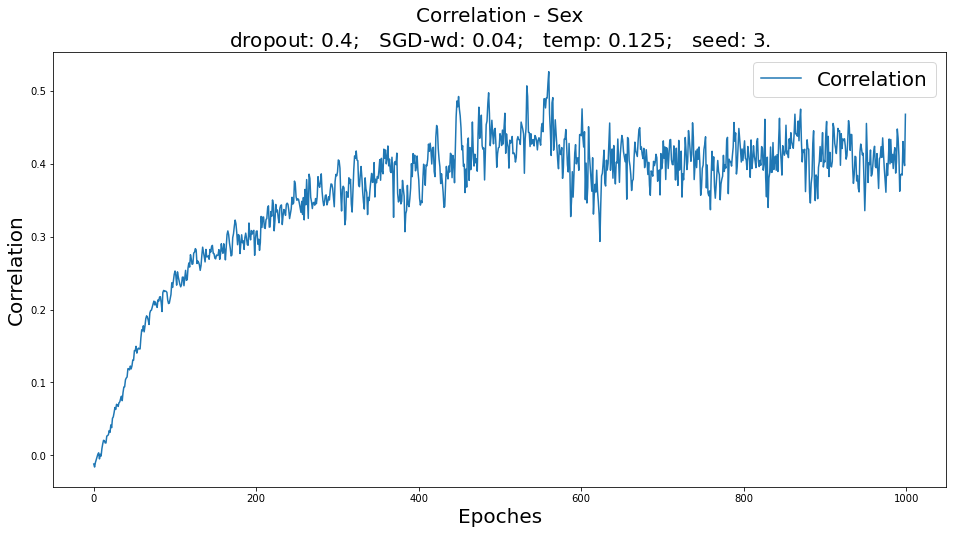

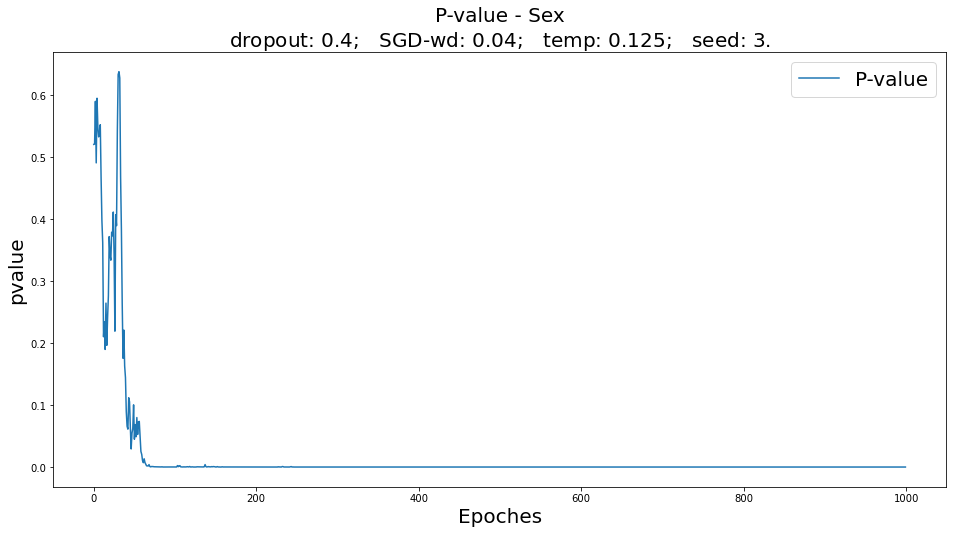

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.31%,76.36%
svm,81.31%,76.36%
rf,81.31%,76.36%


Prediction based on original microbiome data:


,Validation,Testing
logistic,71.03%,68.18%
svm,64.49%,67.27%
rf,78.50%,78.18%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.13%,96.36%
svm,98.13%,96.36%
rf,98.13%,96.36%


Prediction based on original metabolome data:


,Validation,Testing
logistic,98.13%,98.18%
svm,95.33%,95.45%
rf,98.13%,97.27%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


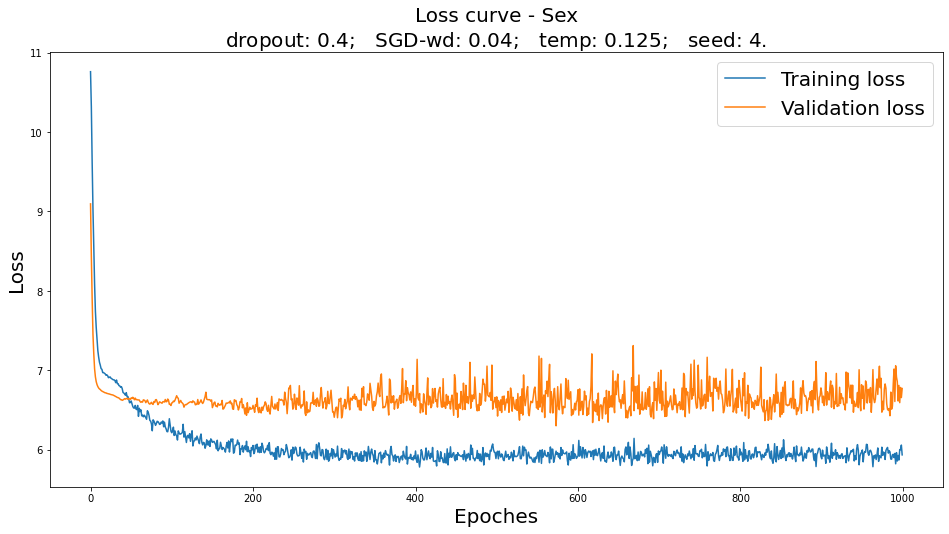

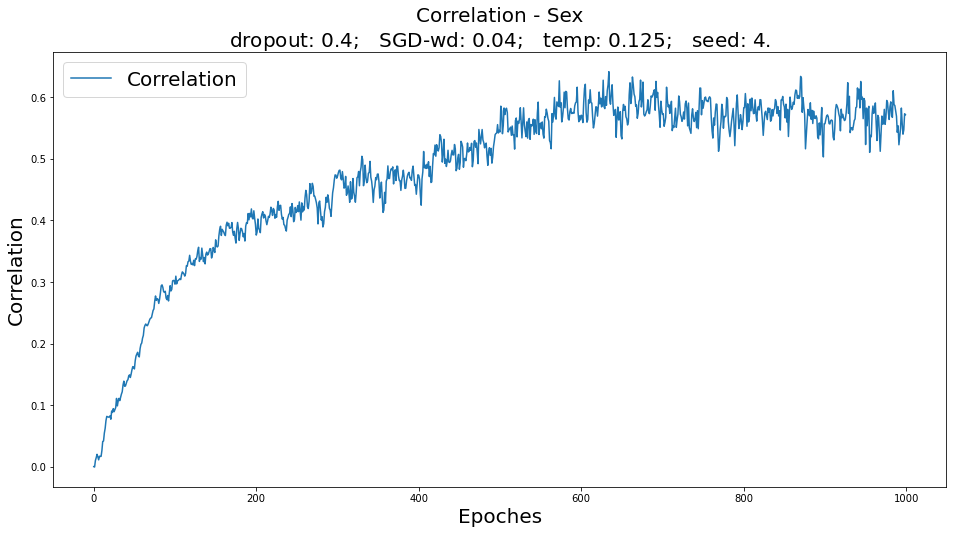

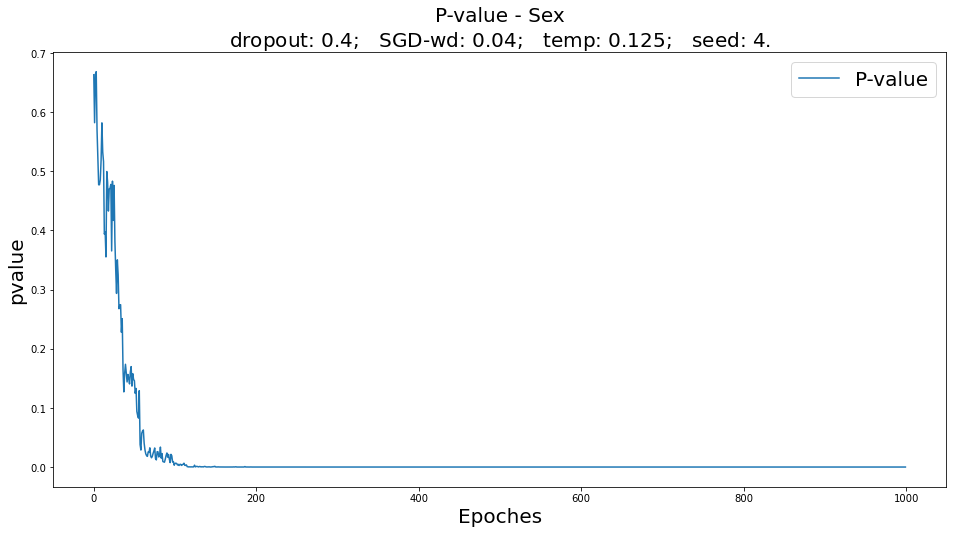

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.24%,80.00%
svm,82.24%,79.09%
rf,82.24%,79.09%


Prediction based on original microbiome data:


,Validation,Testing
logistic,63.55%,64.55%
svm,66.36%,70.00%
rf,80.37%,83.64%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.13%,99.09%
svm,98.13%,99.09%
rf,98.13%,99.09%


Prediction based on original metabolome data:


,Validation,Testing
logistic,99.07%,99.09%
svm,97.20%,93.64%
rf,98.13%,96.36%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


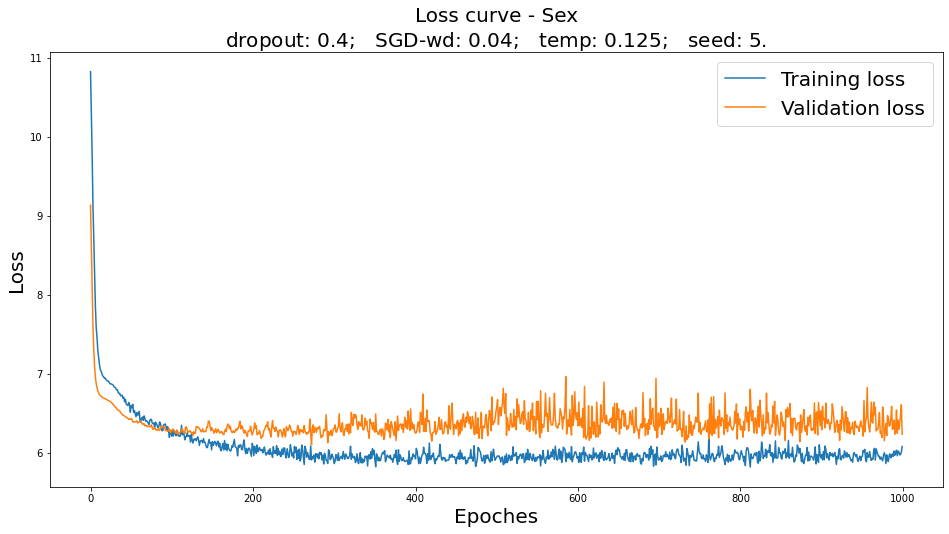

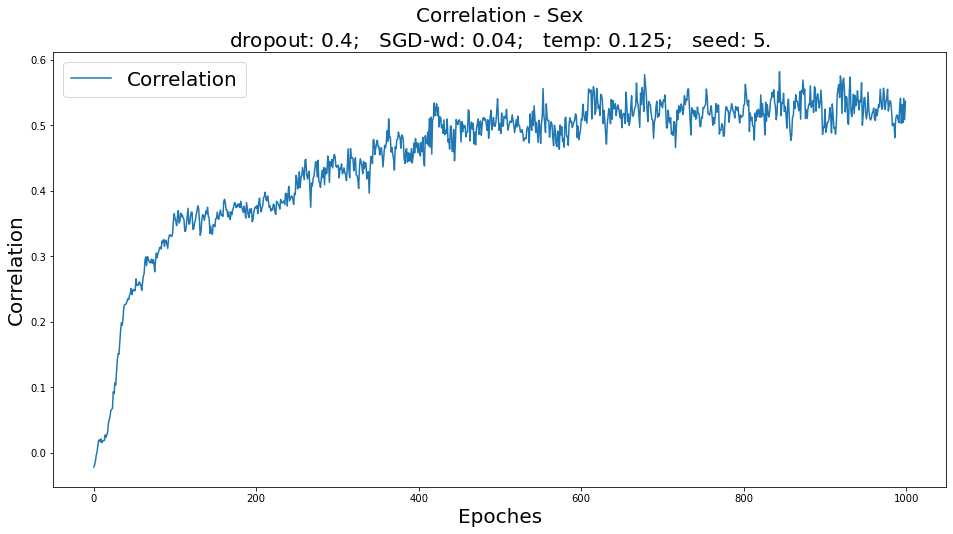

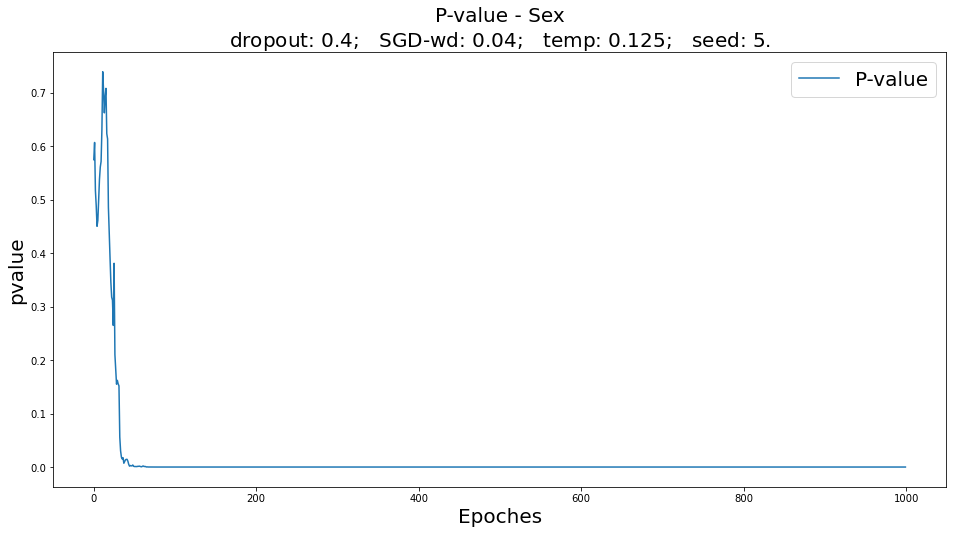

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,84.11%,80.91%
svm,85.05%,80.91%
rf,84.11%,80.91%


Prediction based on original microbiome data:


,Validation,Testing
logistic,67.29%,69.09%
svm,72.90%,75.45%
rf,84.11%,83.64%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.13%,98.18%
svm,98.13%,98.18%
rf,98.13%,98.18%


Prediction based on original metabolome data:


,Validation,Testing
logistic,97.20%,97.27%
svm,98.13%,92.73%
rf,99.07%,94.55%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


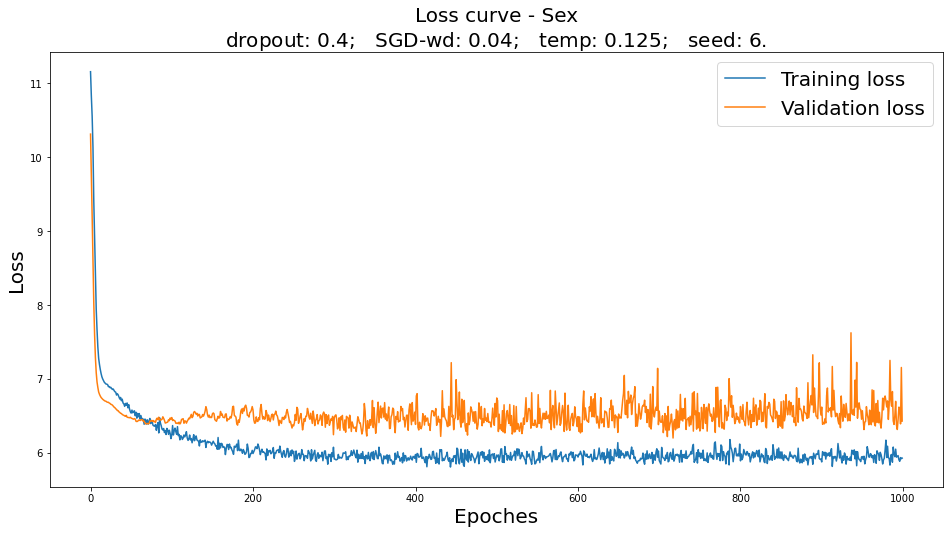

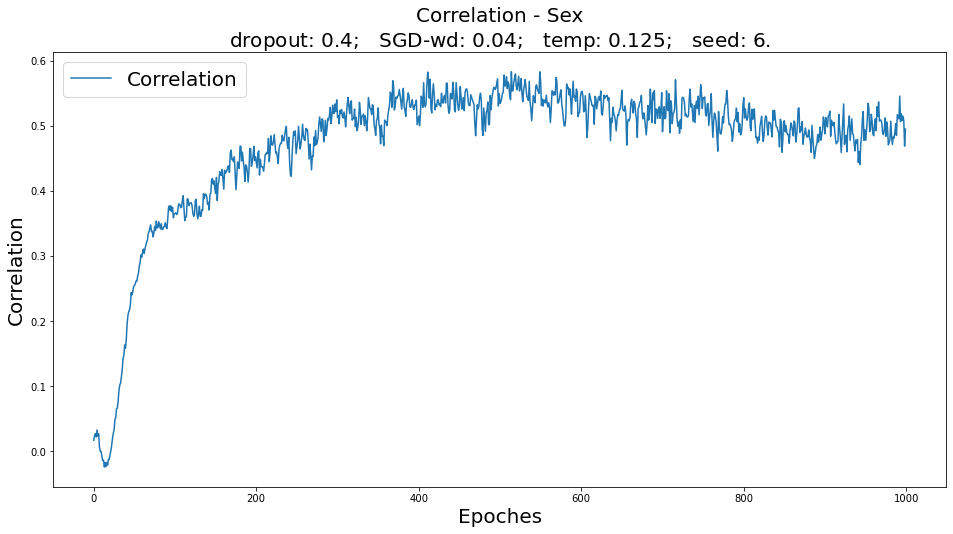

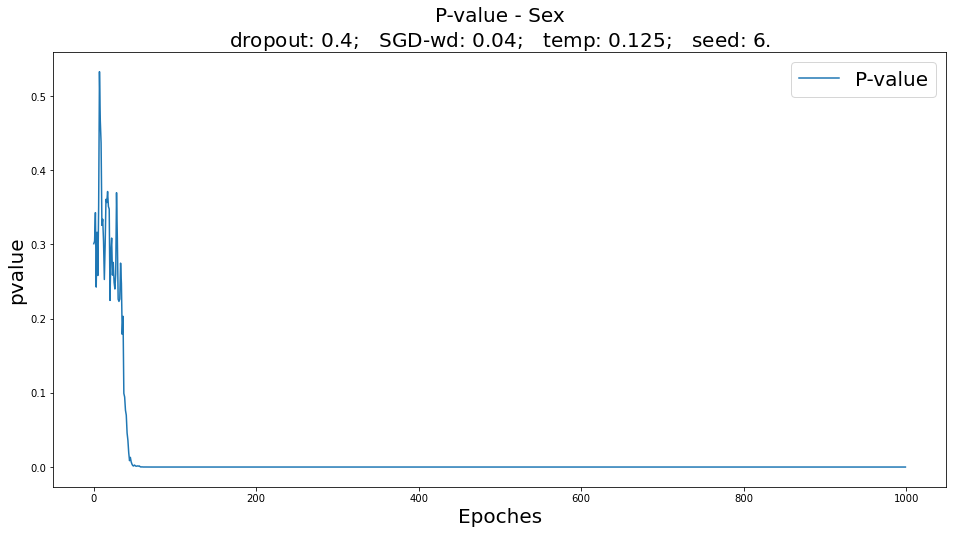

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.31%,77.27%
svm,80.37%,79.09%
rf,79.44%,80.91%


Prediction based on original microbiome data:


,Validation,Testing
logistic,69.16%,64.55%
svm,74.77%,63.64%
rf,84.11%,82.73%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.13%,96.36%
svm,98.13%,96.36%
rf,99.07%,96.36%


Prediction based on original metabolome data:


,Validation,Testing
logistic,99.07%,97.27%
svm,98.13%,94.55%
rf,99.07%,97.27%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


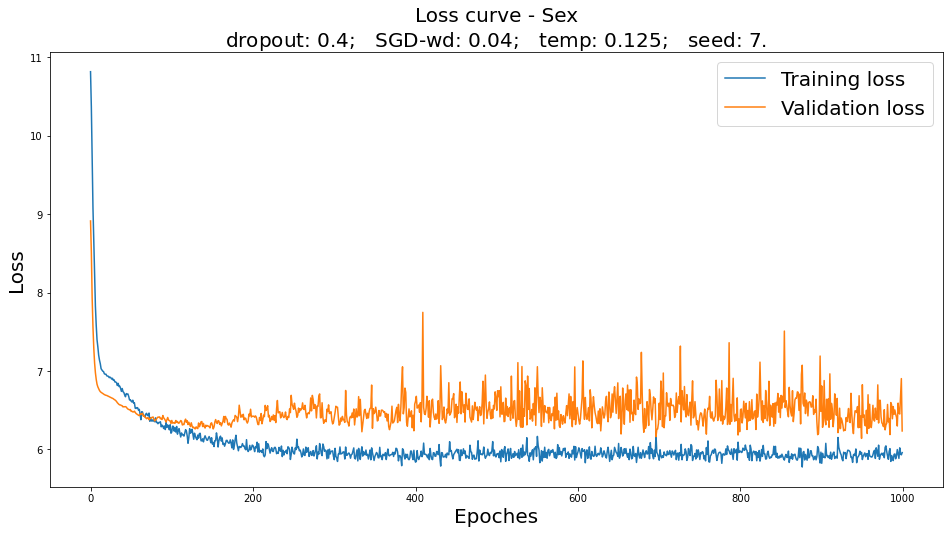

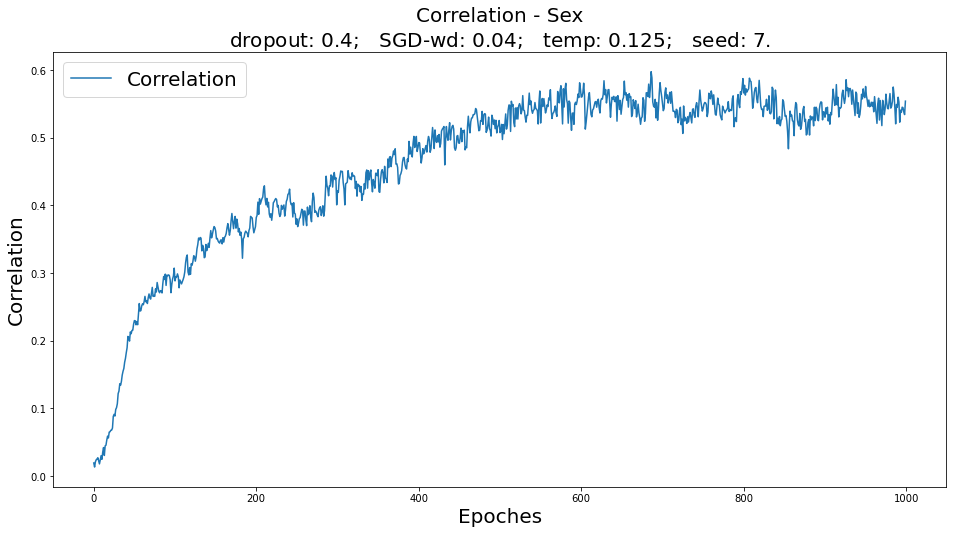

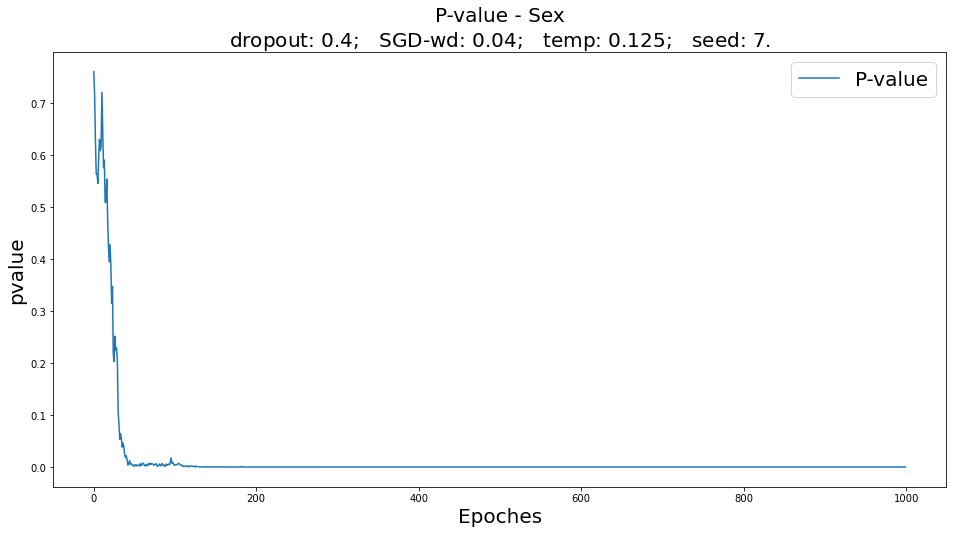

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.24%,79.09%
svm,82.24%,80.00%
rf,81.31%,80.00%


Prediction based on original microbiome data:


,Validation,Testing
logistic,71.03%,62.73%
svm,72.90%,72.73%
rf,79.44%,74.55%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,100.00%,99.09%
svm,100.00%,97.27%
rf,100.00%,99.09%


Prediction based on original metabolome data:


,Validation,Testing
logistic,98.13%,98.18%
svm,95.33%,91.82%
rf,97.20%,97.27%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


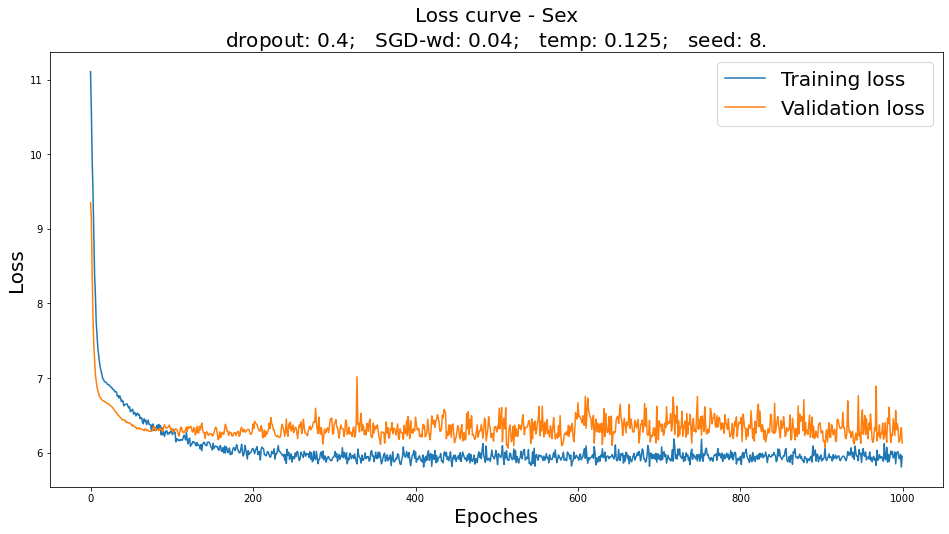

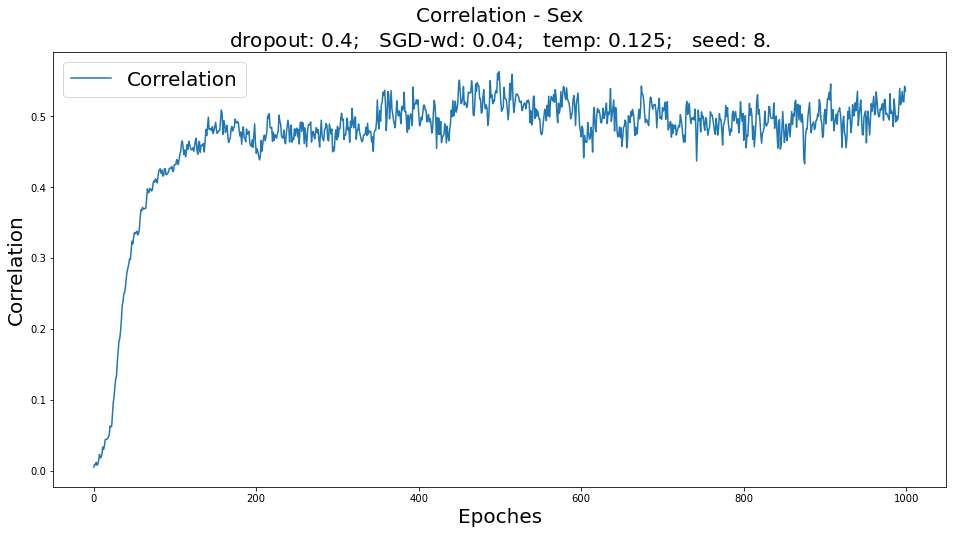

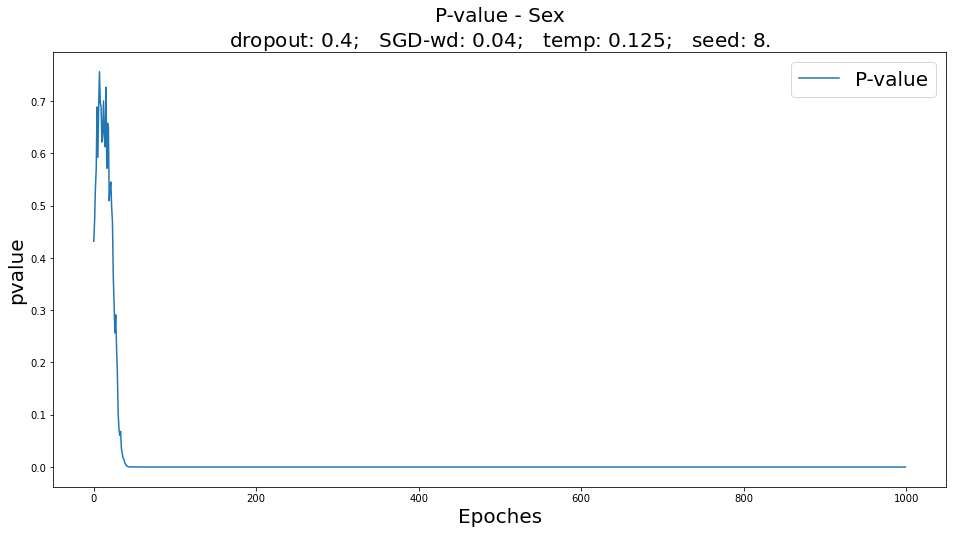

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,88.79%,78.18%
svm,88.79%,80.00%
rf,88.79%,78.18%


Prediction based on original microbiome data:


,Validation,Testing
logistic,73.83%,63.64%
svm,71.96%,63.64%
rf,83.18%,76.36%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,99.07%,97.27%
svm,99.07%,97.27%
rf,99.07%,97.27%


Prediction based on original metabolome data:


,Validation,Testing
logistic,100.00%,98.18%
svm,97.20%,91.82%
rf,99.07%,99.09%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


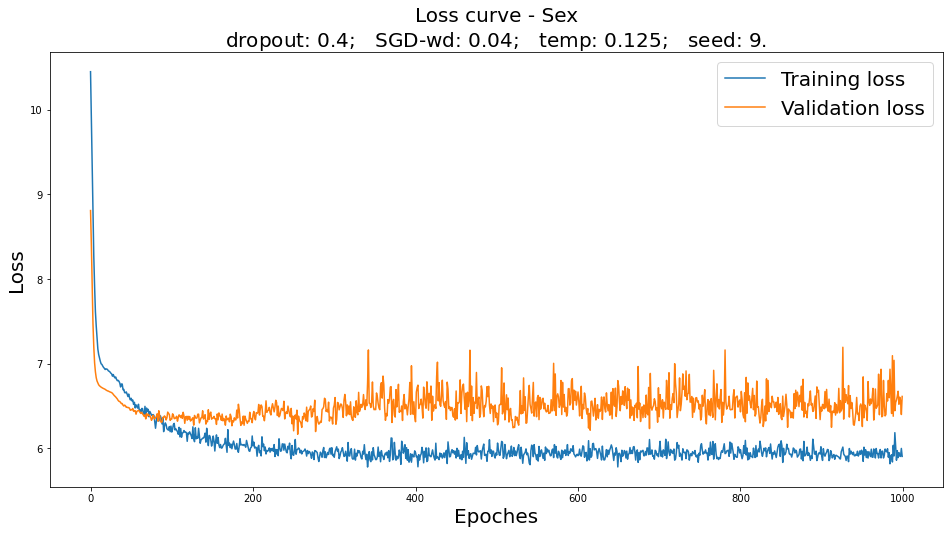

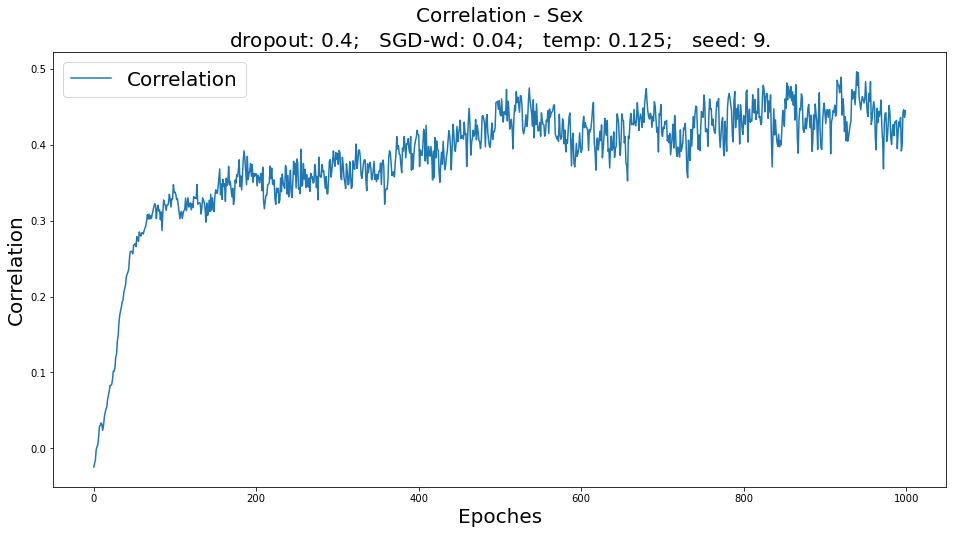

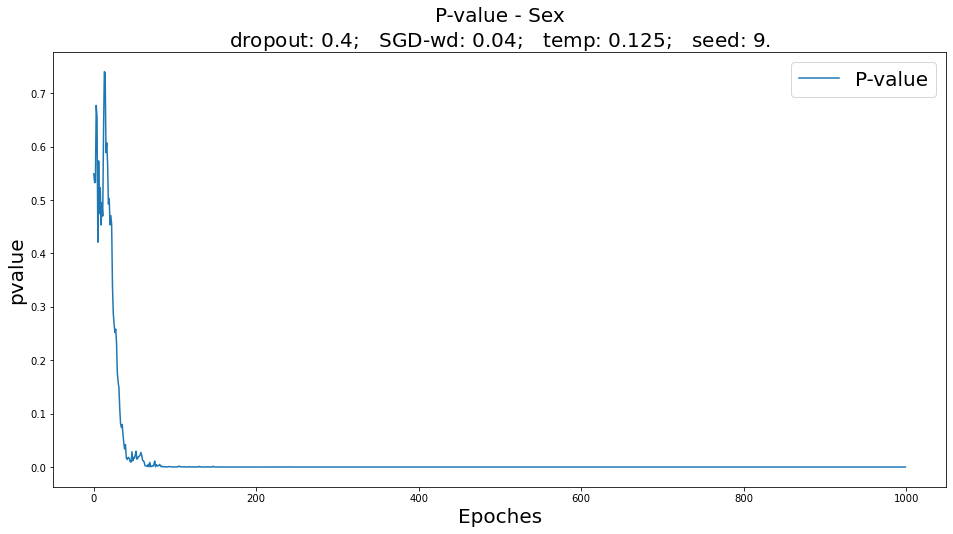

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,85.05%,74.55%
svm,85.05%,74.55%
rf,85.05%,76.36%


Prediction based on original microbiome data:


,Validation,Testing
logistic,65.42%,70.91%
svm,71.03%,69.09%
rf,83.18%,83.64%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,99.07%,100.00%
svm,99.07%,100.00%
rf,99.07%,100.00%


Prediction based on original metabolome data:


,Validation,Testing
logistic,98.13%,99.09%
svm,93.46%,93.64%
rf,99.07%,98.18%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


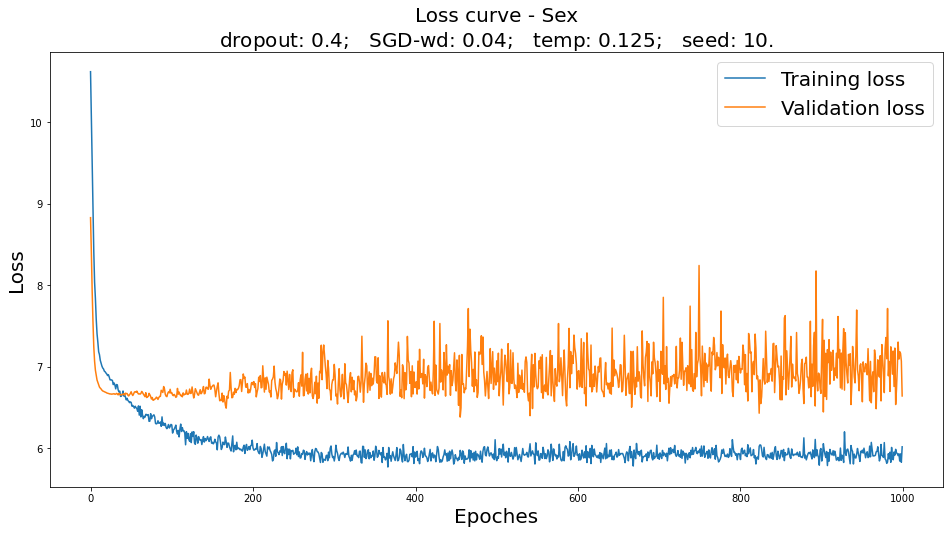

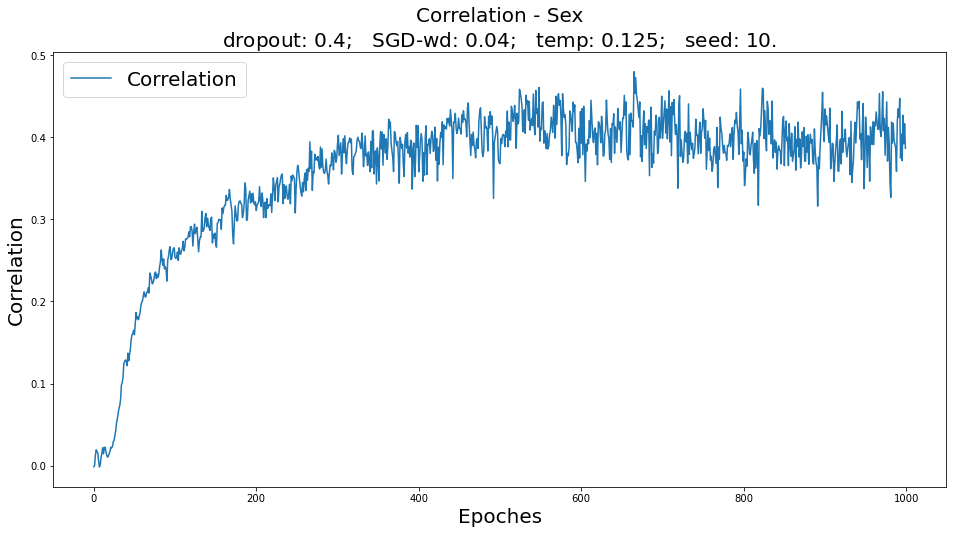

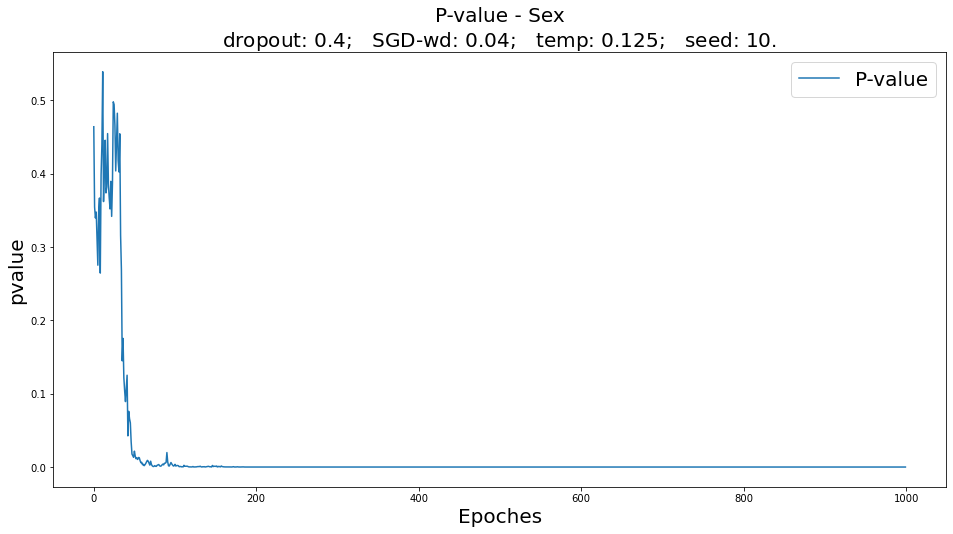

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,73.83%,81.82%
svm,75.70%,80.91%
rf,74.77%,81.82%


Prediction based on original microbiome data:


,Validation,Testing
logistic,65.42%,67.27%
svm,62.62%,73.64%
rf,80.37%,84.55%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,100.00%,97.27%
svm,99.07%,97.27%
rf,99.07%,97.27%


Prediction based on original metabolome data:


,Validation,Testing
logistic,99.07%,98.18%
svm,97.20%,98.18%
rf,97.20%,97.27%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


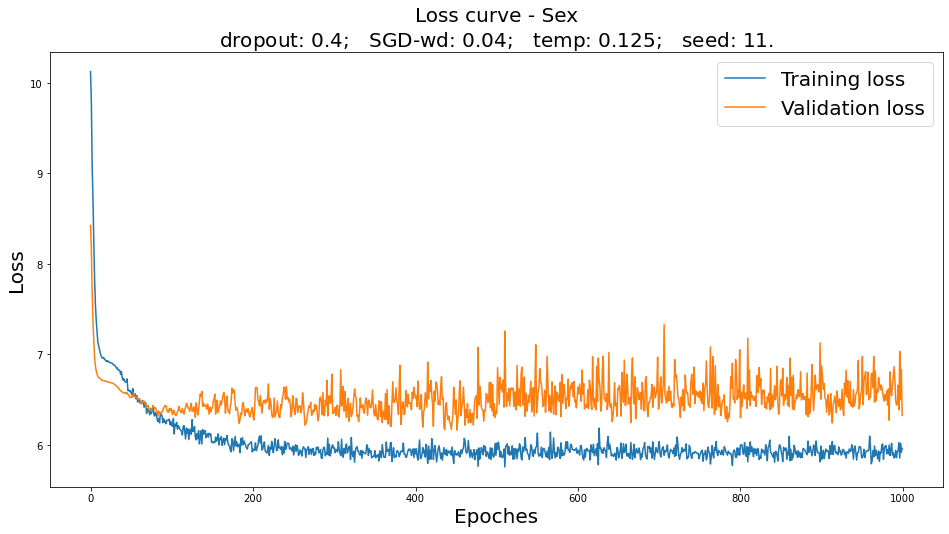

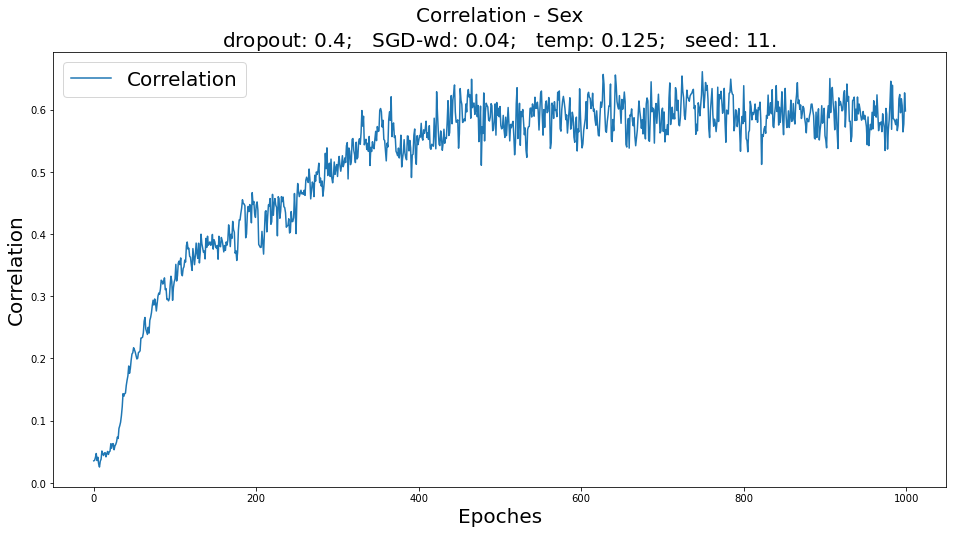

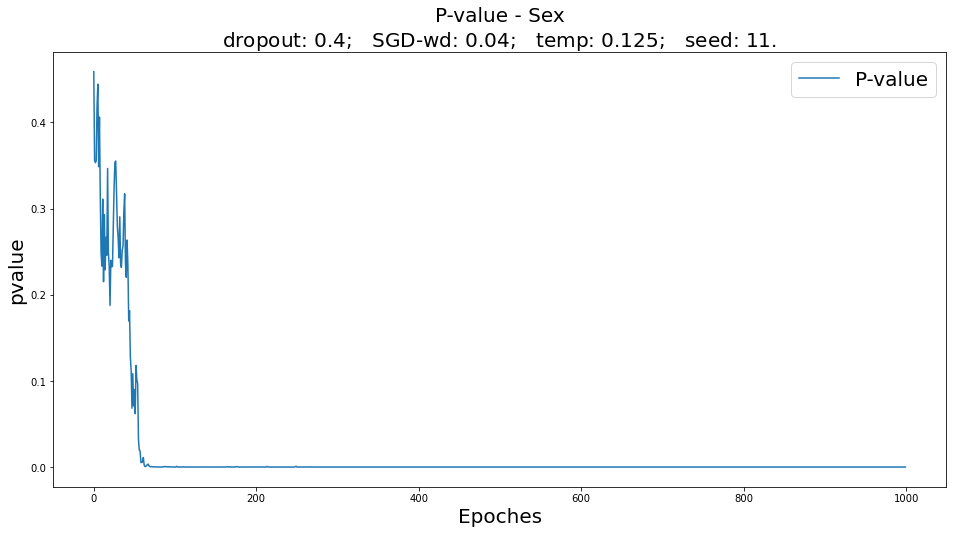

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.31%,79.09%
svm,81.31%,79.09%
rf,78.50%,76.36%


Prediction based on original microbiome data:


,Validation,Testing
logistic,65.42%,56.36%
svm,70.09%,63.64%
rf,79.44%,76.36%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,100.00%,97.27%
svm,100.00%,97.27%
rf,100.00%,97.27%


Prediction based on original metabolome data:


,Validation,Testing
logistic,99.07%,96.36%
svm,98.13%,94.55%
rf,98.13%,94.55%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


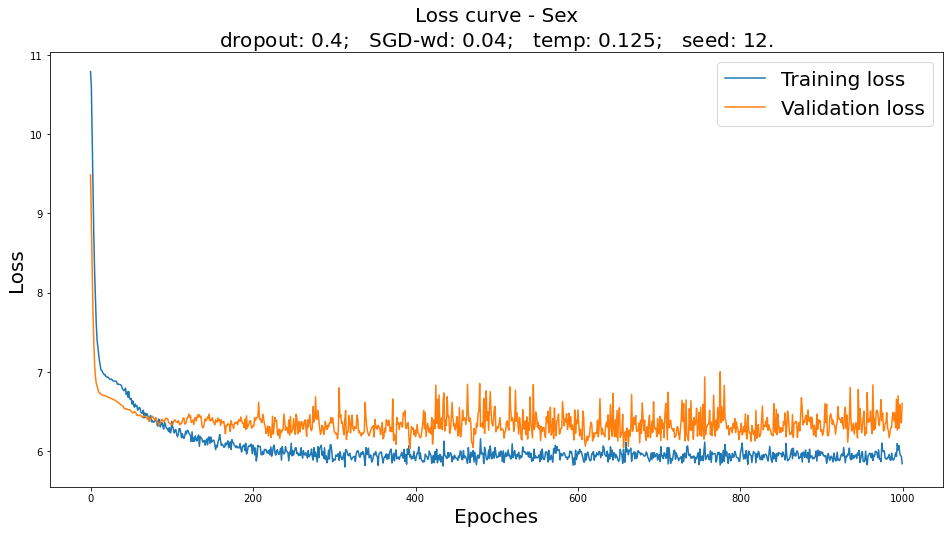

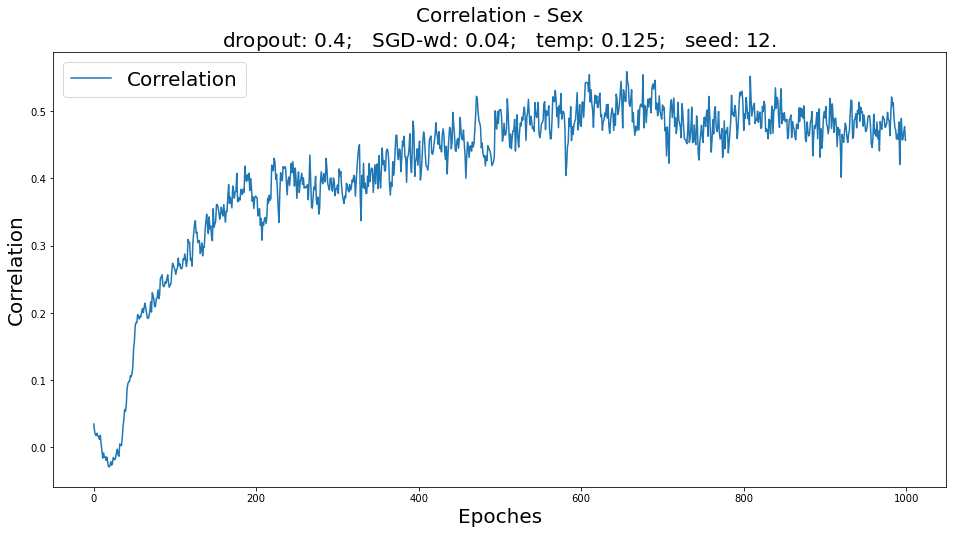

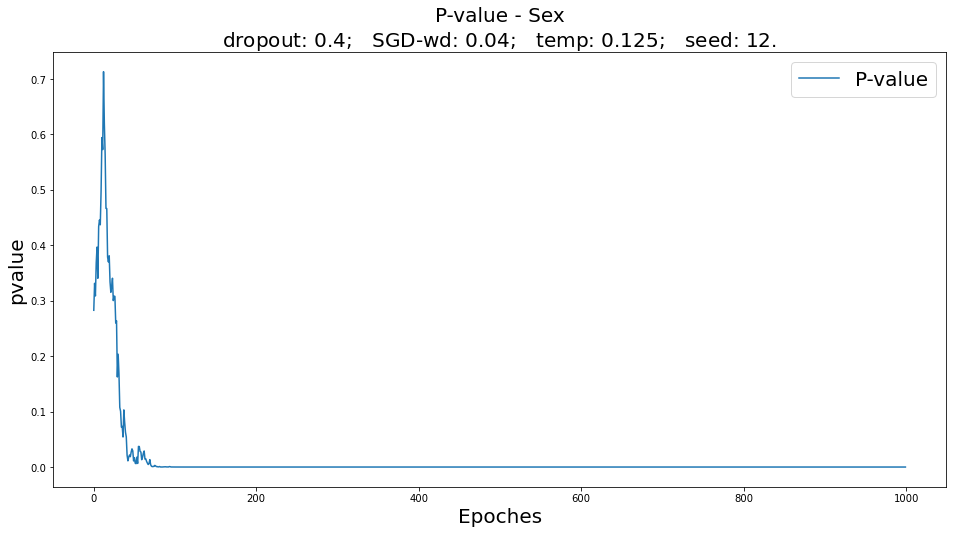

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.31%,81.82%
svm,82.24%,83.64%
rf,81.31%,84.55%


Prediction based on original microbiome data:


,Validation,Testing
logistic,66.36%,70.91%
svm,66.36%,75.45%
rf,77.57%,80.91%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.13%,99.09%
svm,98.13%,99.09%
rf,98.13%,99.09%


Prediction based on original metabolome data:


,Validation,Testing
logistic,96.26%,100.00%
svm,95.33%,98.18%
rf,96.26%,100.00%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


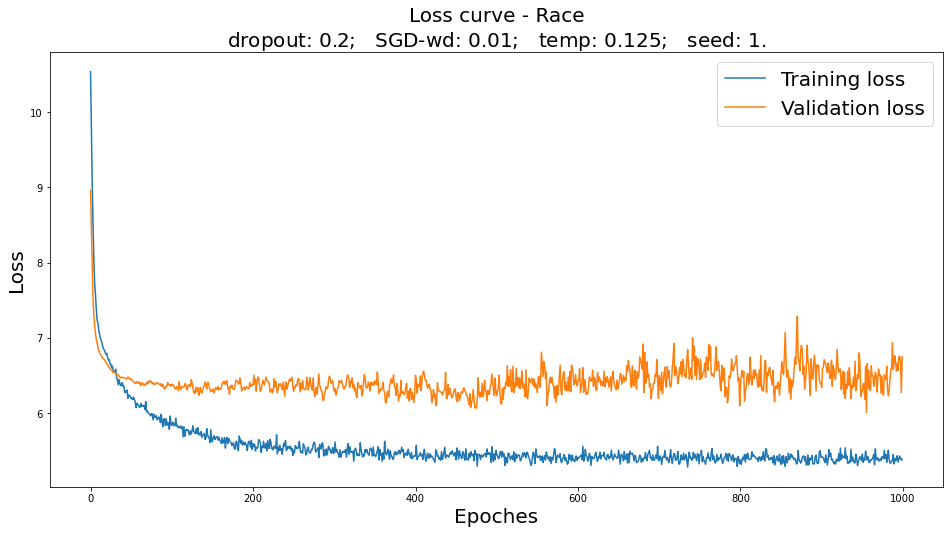

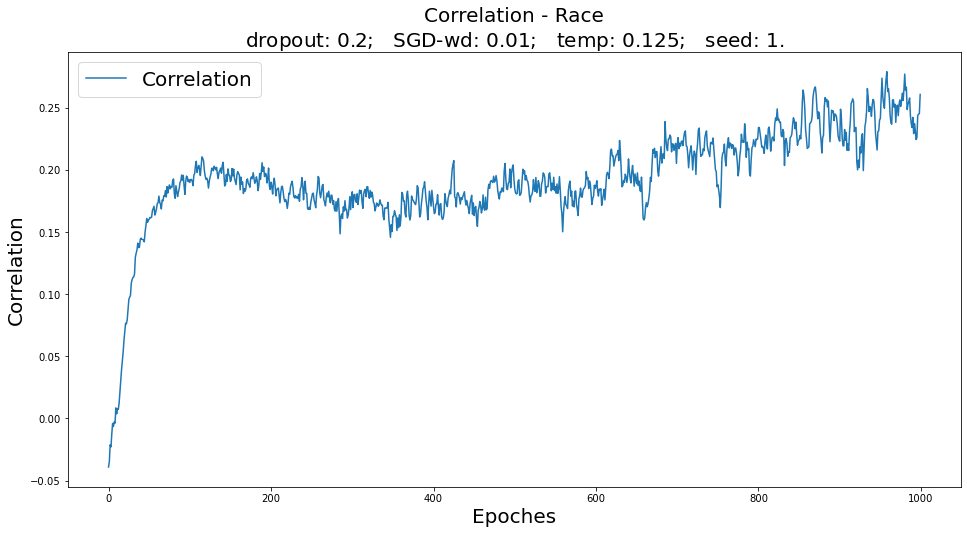

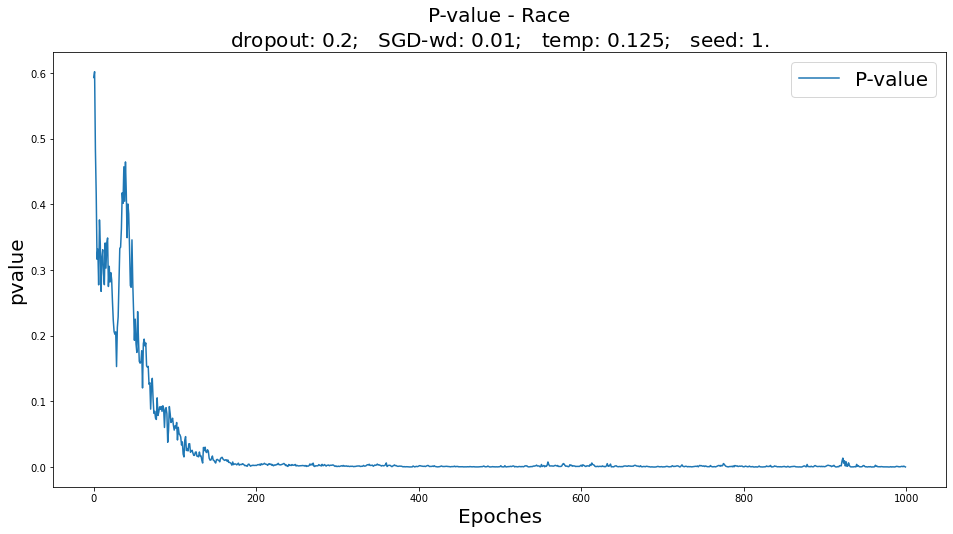

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.86%,76.79%
svm,80.00%,76.79%
rf,78.10%,77.68%


Prediction based on original microbiome data:


,Validation,Testing
logistic,67.62%,75.89%
svm,72.38%,72.32%
rf,78.10%,79.46%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,100.00%,97.32%
svm,100.00%,100.00%
rf,88.57%,90.18%


Prediction based on original metabolome data:


,Validation,Testing
logistic,98.10%,94.64%
svm,95.24%,91.96%
rf,88.57%,84.82%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


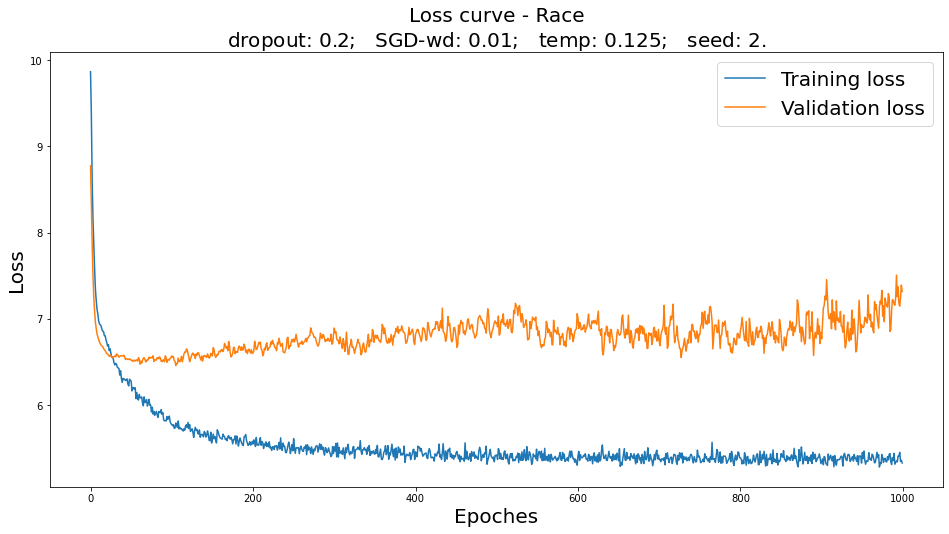

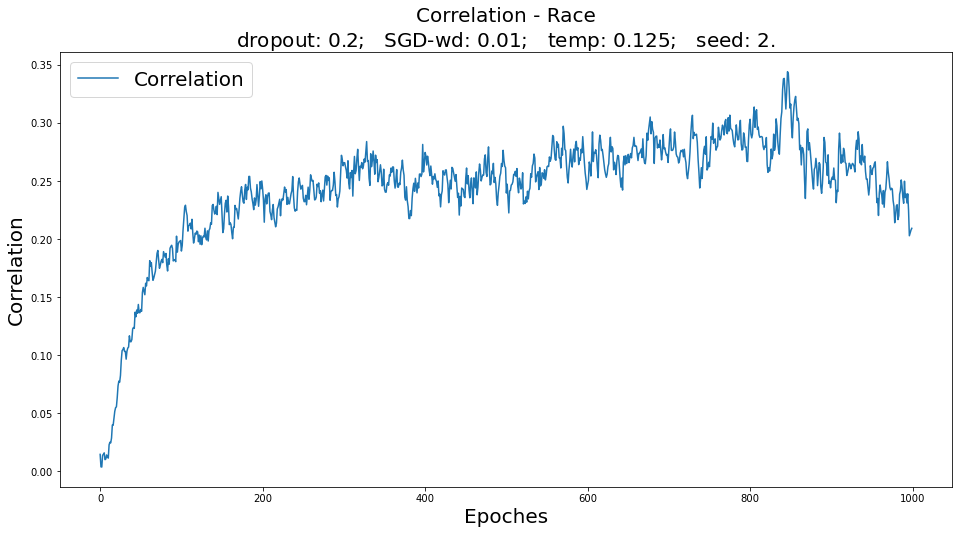

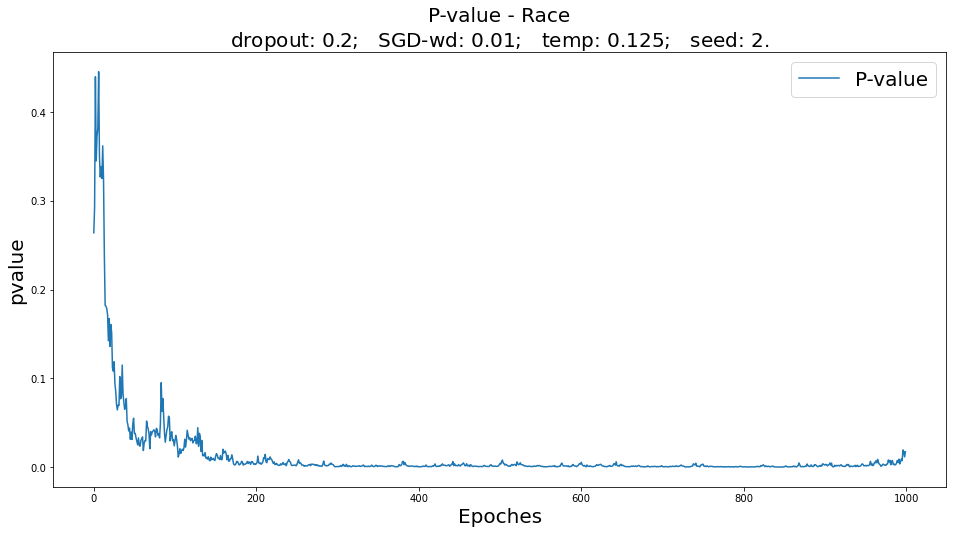

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,76.19%,75.00%
svm,76.19%,72.32%
rf,73.33%,75.89%


Prediction based on original microbiome data:


,Validation,Testing
logistic,75.24%,74.11%
svm,71.43%,71.43%
rf,79.05%,80.36%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,97.14%,97.32%
svm,96.19%,97.32%
rf,91.43%,89.29%


Prediction based on original metabolome data:


,Validation,Testing
logistic,97.14%,91.07%
svm,93.33%,88.39%
rf,85.71%,83.93%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


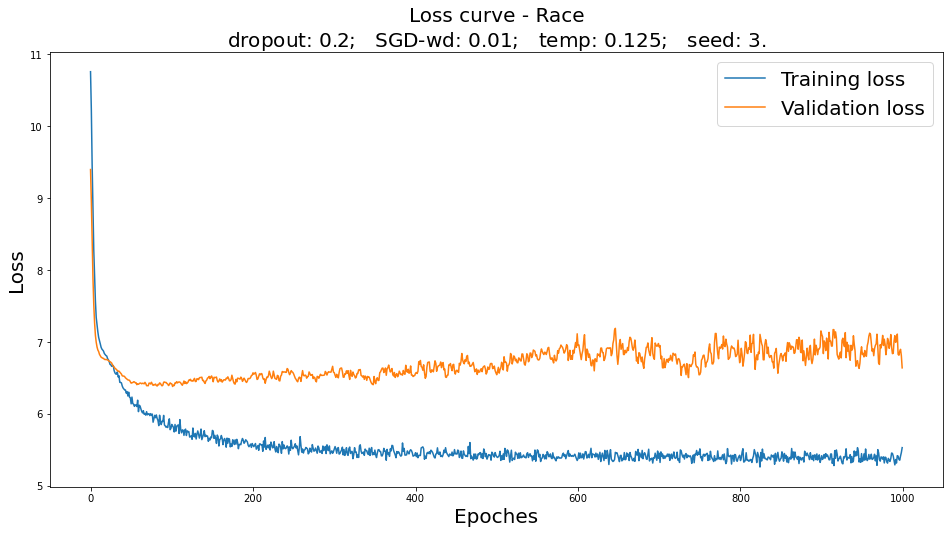

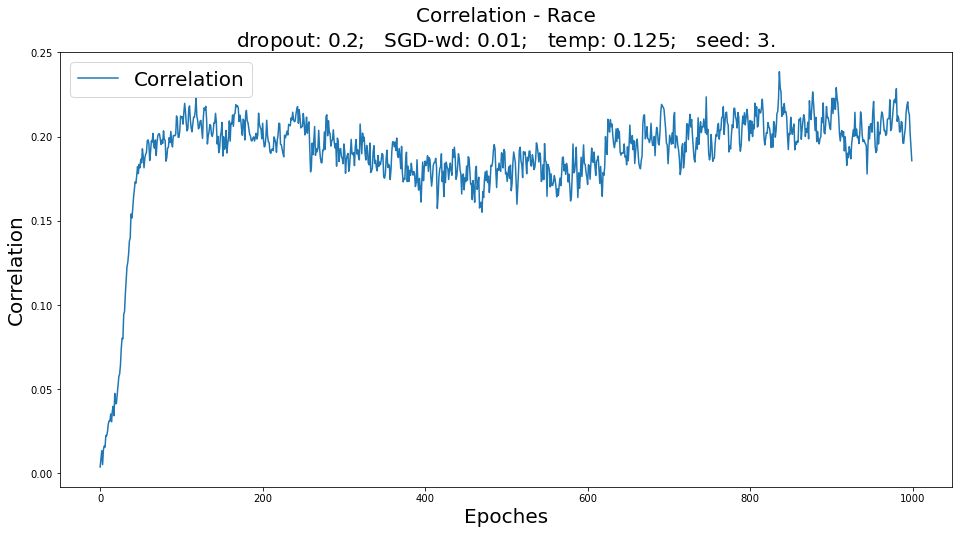

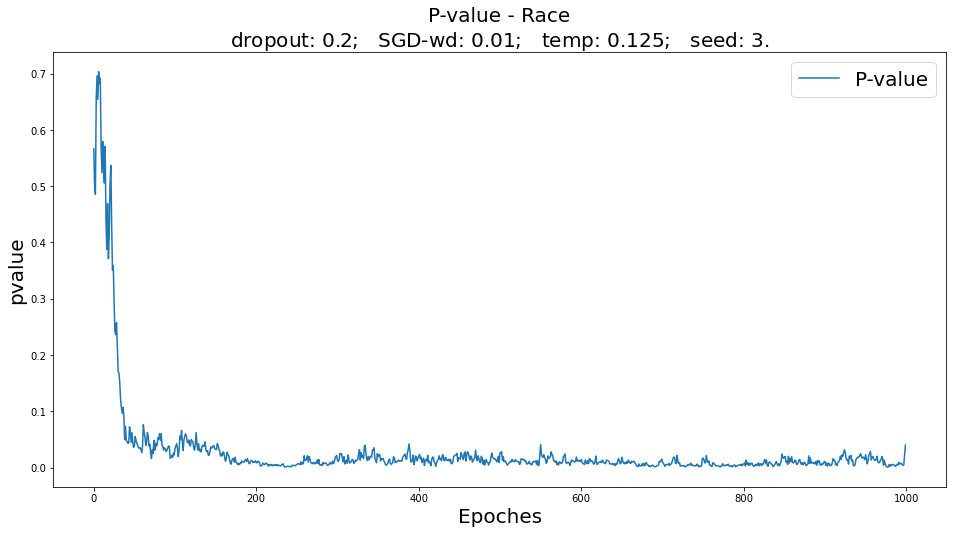

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,83.81%,77.68%
svm,84.76%,75.89%
rf,81.90%,77.68%


Prediction based on original microbiome data:


,Validation,Testing
logistic,69.52%,71.43%
svm,75.24%,71.43%
rf,83.81%,78.57%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,98.10%,93.75%
svm,97.14%,94.64%
rf,94.29%,87.50%


Prediction based on original metabolome data:


,Validation,Testing
logistic,96.19%,94.64%
svm,93.33%,87.50%
rf,90.48%,83.93%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


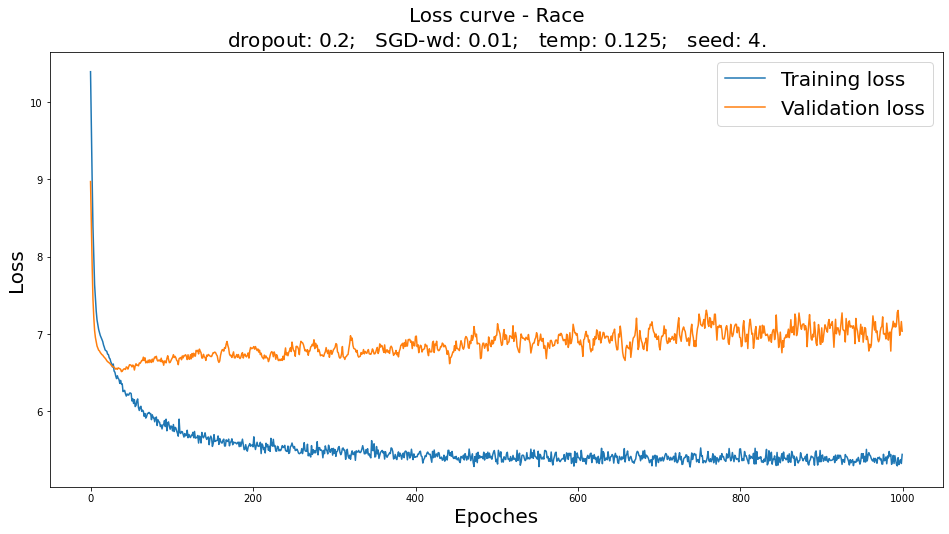

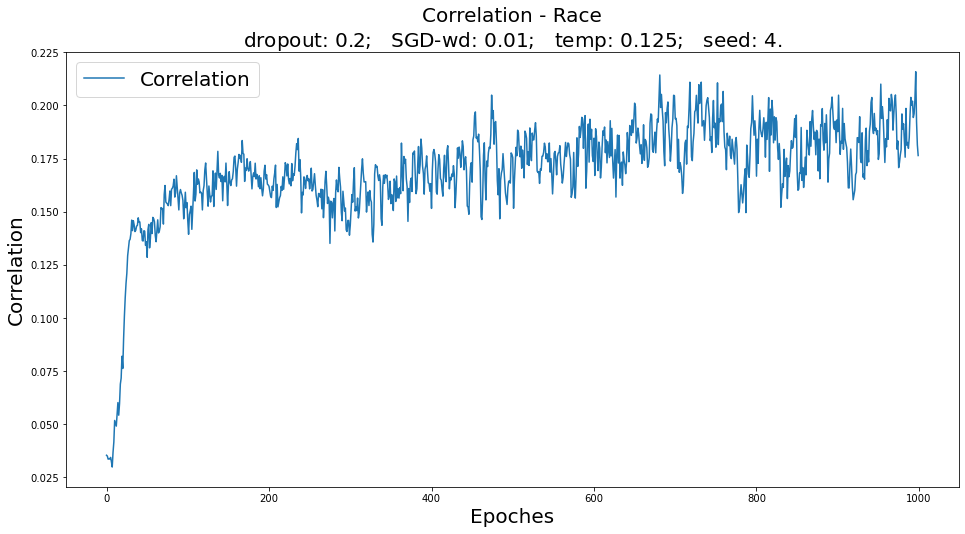

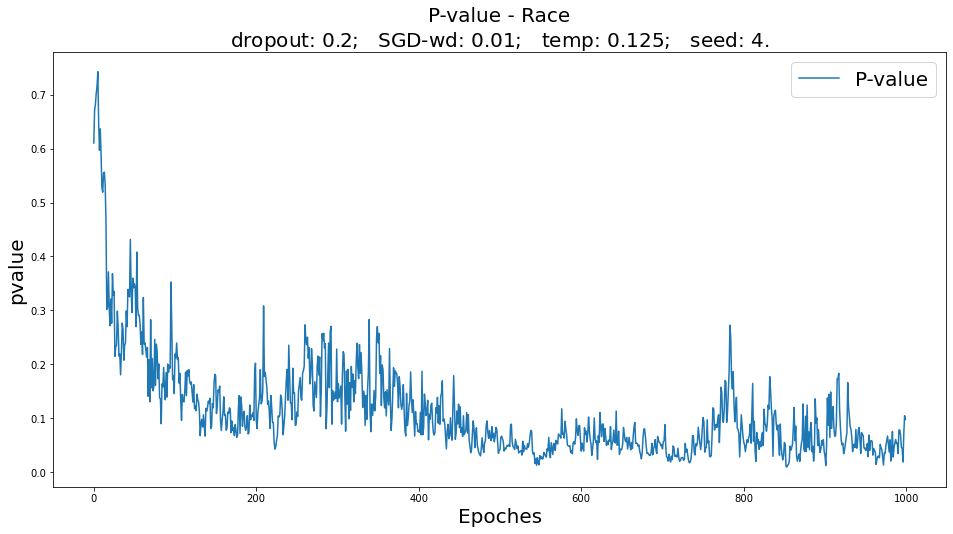

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,81.90%,79.46%
svm,81.90%,82.14%
rf,80.95%,79.46%


Prediction based on original microbiome data:


,Validation,Testing
logistic,72.38%,68.75%
svm,72.38%,73.21%
rf,80.00%,77.68%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,97.14%,93.75%
svm,97.14%,95.54%
rf,89.52%,86.61%


Prediction based on original metabolome data:


,Validation,Testing
logistic,94.29%,92.86%
svm,92.38%,88.39%
rf,85.71%,83.04%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


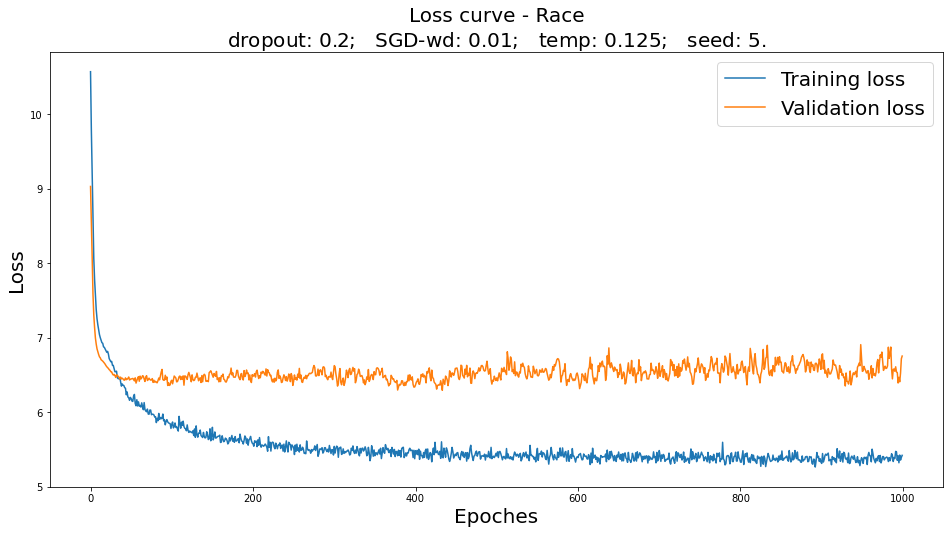

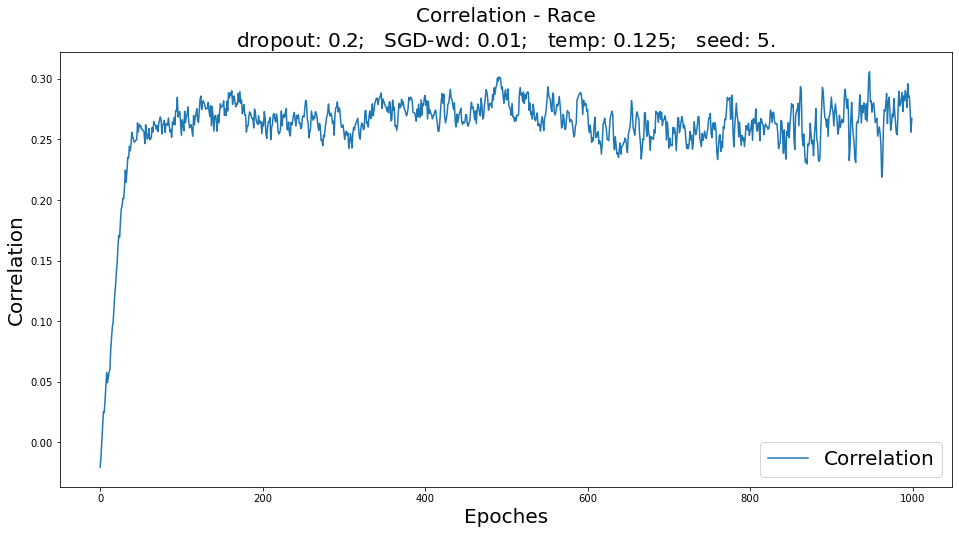

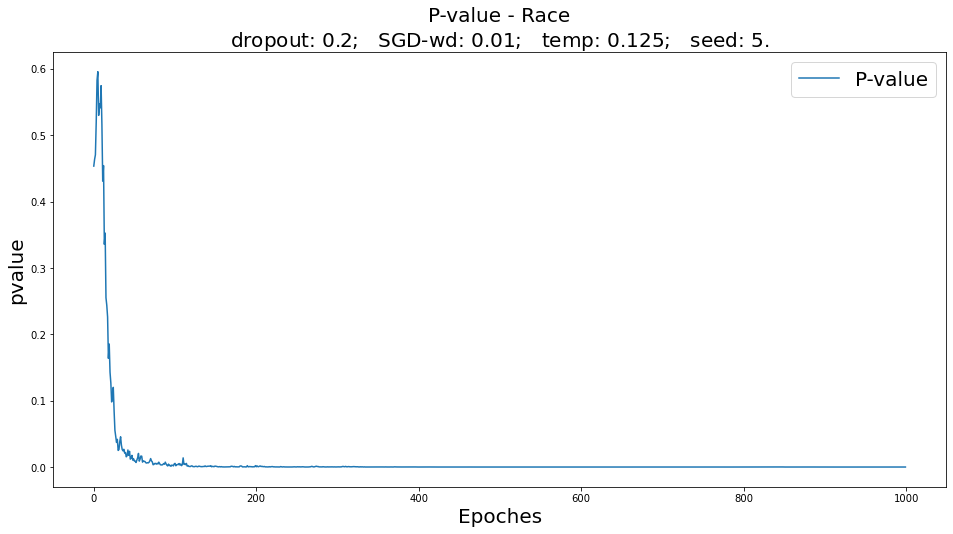

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.86%,77.68%
svm,83.81%,79.46%
rf,82.86%,75.89%


Prediction based on original microbiome data:


,Validation,Testing
logistic,78.10%,60.71%
svm,80.00%,68.75%
rf,85.71%,74.11%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,99.05%,92.86%
svm,100.00%,93.75%
rf,92.38%,88.39%


Prediction based on original metabolome data:


,Validation,Testing
logistic,99.05%,94.64%
svm,91.43%,87.50%
rf,84.76%,83.04%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


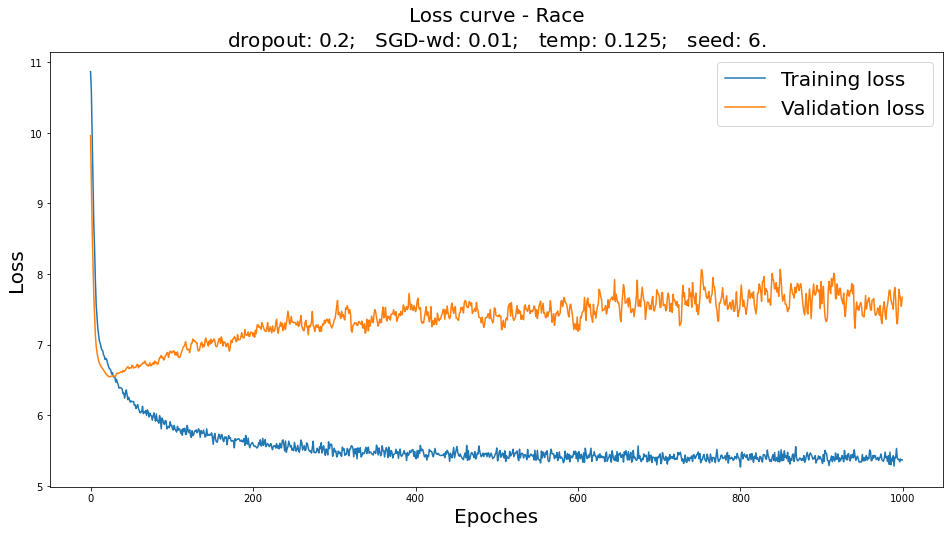

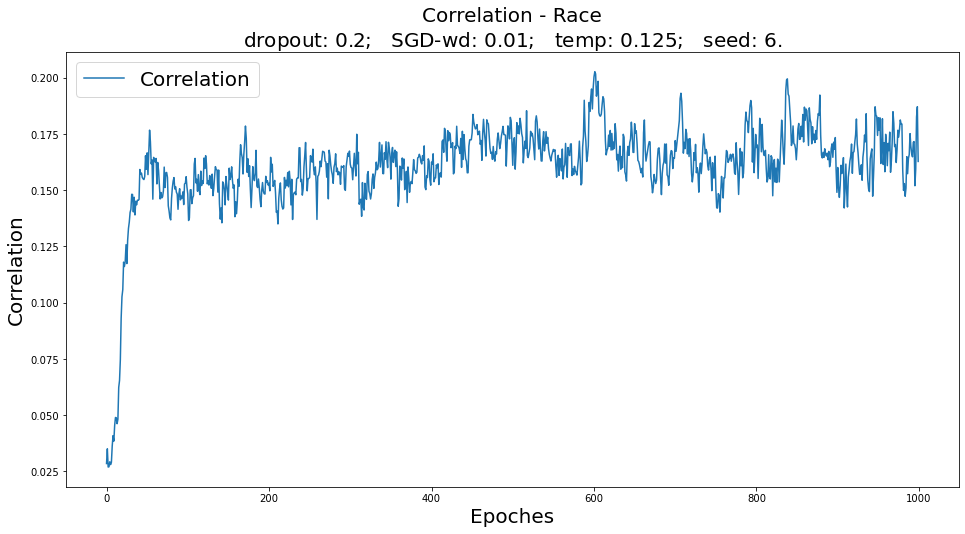

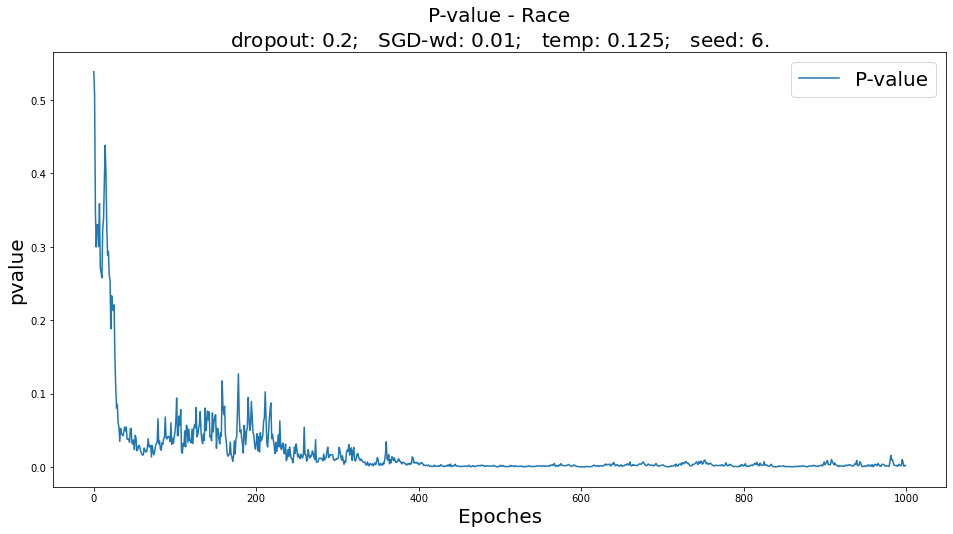

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,73.33%,79.46%
svm,76.19%,81.25%
rf,75.24%,76.79%


Prediction based on original microbiome data:


,Validation,Testing
logistic,70.48%,77.68%
svm,70.48%,73.21%
rf,80.00%,78.57%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,99.05%,100.00%
svm,99.05%,99.11%
rf,96.19%,94.64%


Prediction based on original metabolome data:


,Validation,Testing
logistic,95.24%,95.54%
svm,89.52%,89.29%
rf,86.67%,83.93%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


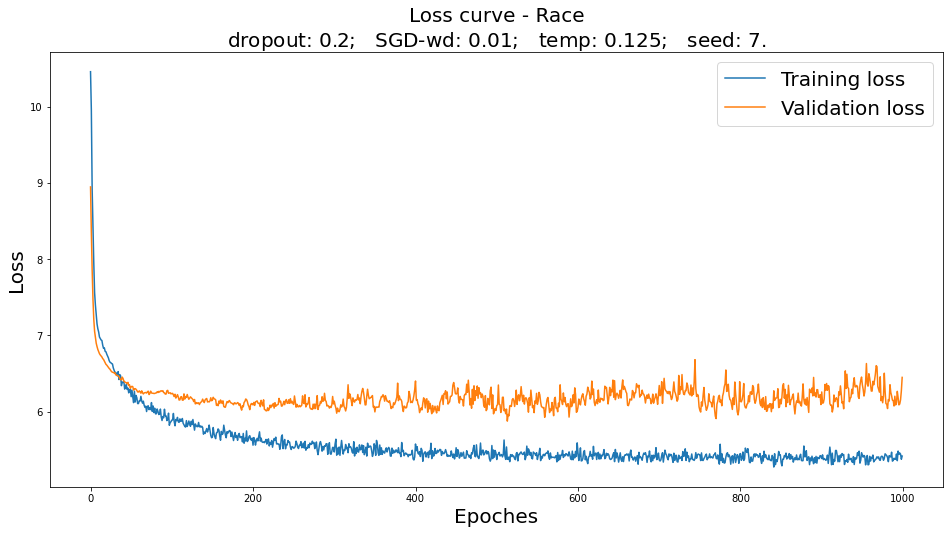

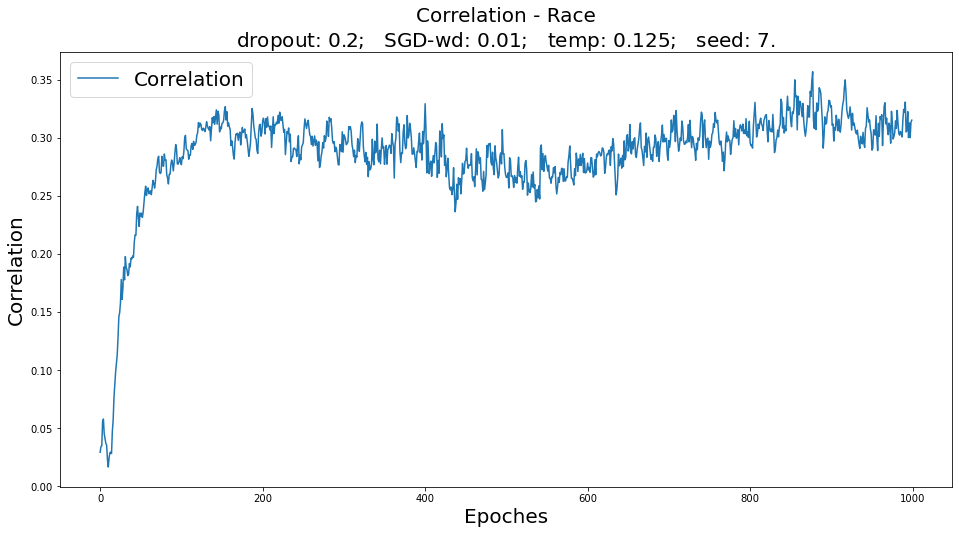

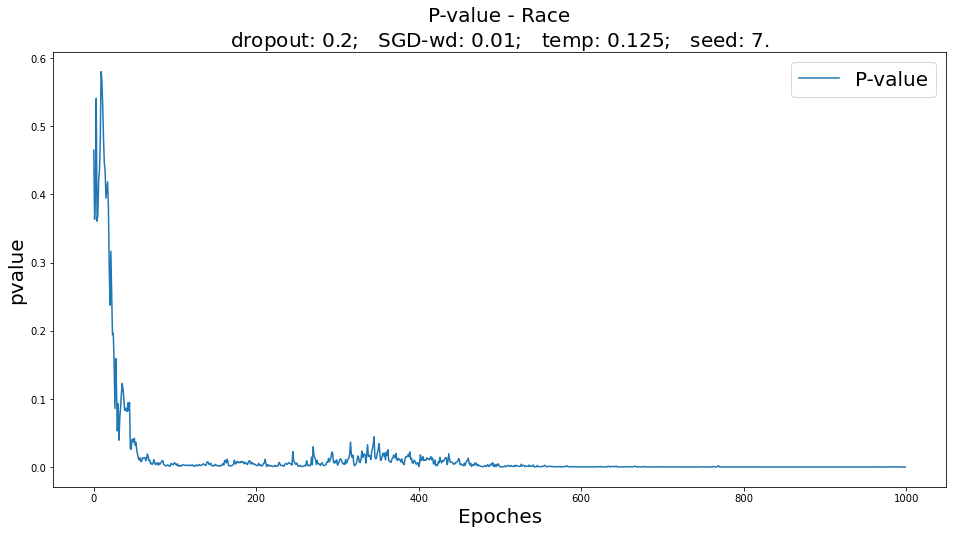

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,83.81%,83.04%
svm,84.76%,82.14%
rf,83.81%,82.14%


Prediction based on original microbiome data:


,Validation,Testing
logistic,73.33%,71.43%
svm,73.33%,73.21%
rf,82.86%,75.00%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,99.05%,94.64%
svm,99.05%,93.75%
rf,97.14%,90.18%


Prediction based on original metabolome data:


,Validation,Testing
logistic,96.19%,89.29%
svm,90.48%,90.18%
rf,86.67%,87.50%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


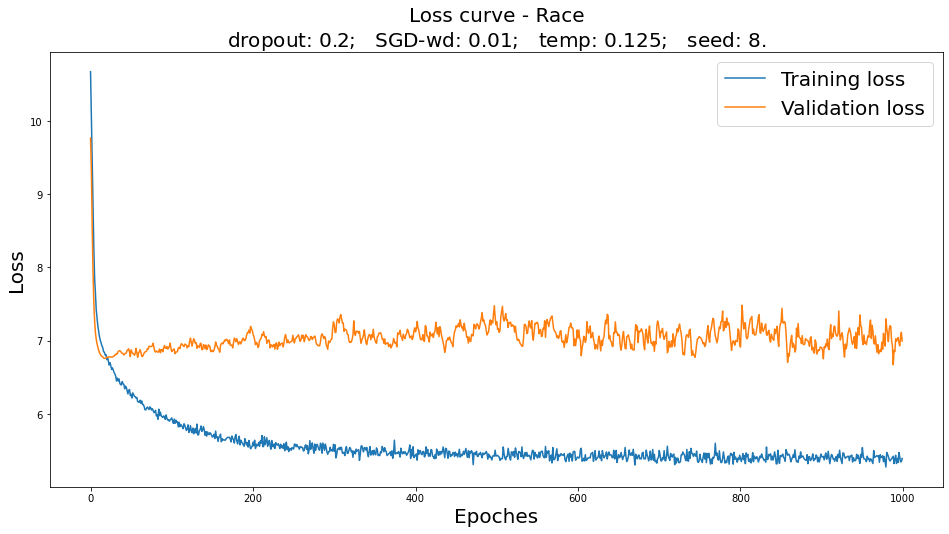

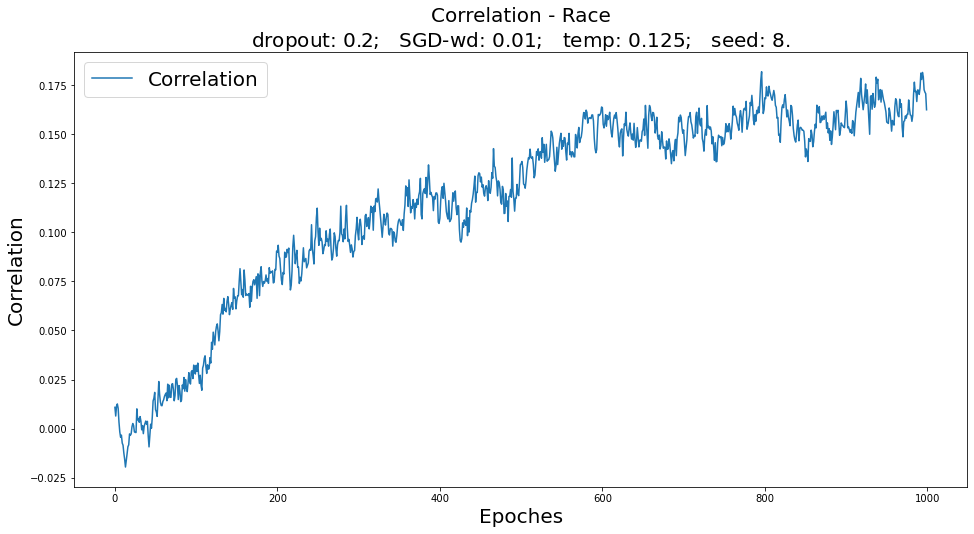

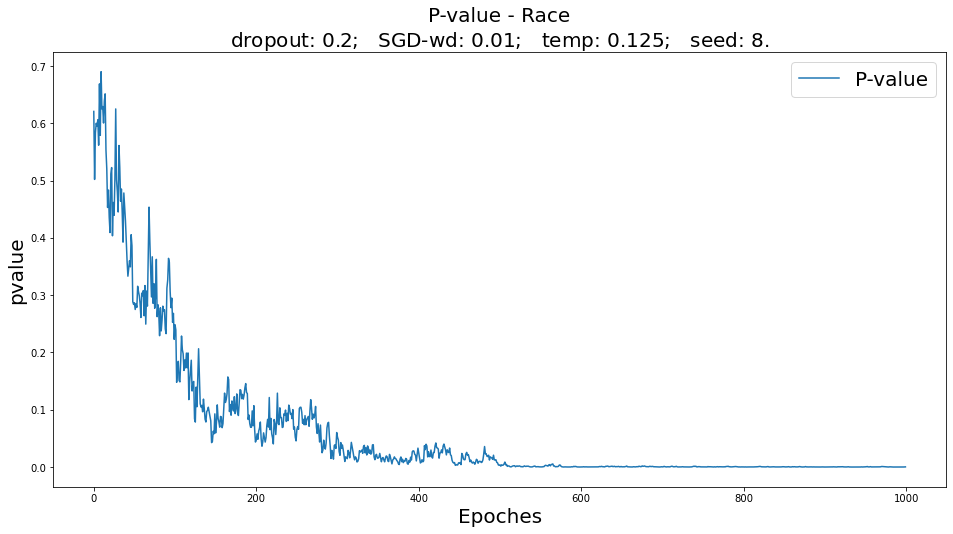

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,78.10%,85.71%
svm,79.05%,83.93%
rf,76.19%,83.04%


Prediction based on original microbiome data:


,Validation,Testing
logistic,71.43%,75.89%
svm,70.48%,73.21%
rf,74.29%,81.25%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,96.19%,96.43%
svm,97.14%,95.54%
rf,88.57%,94.64%


Prediction based on original metabolome data:


,Validation,Testing
logistic,94.29%,91.96%
svm,88.57%,88.39%
rf,85.71%,81.25%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


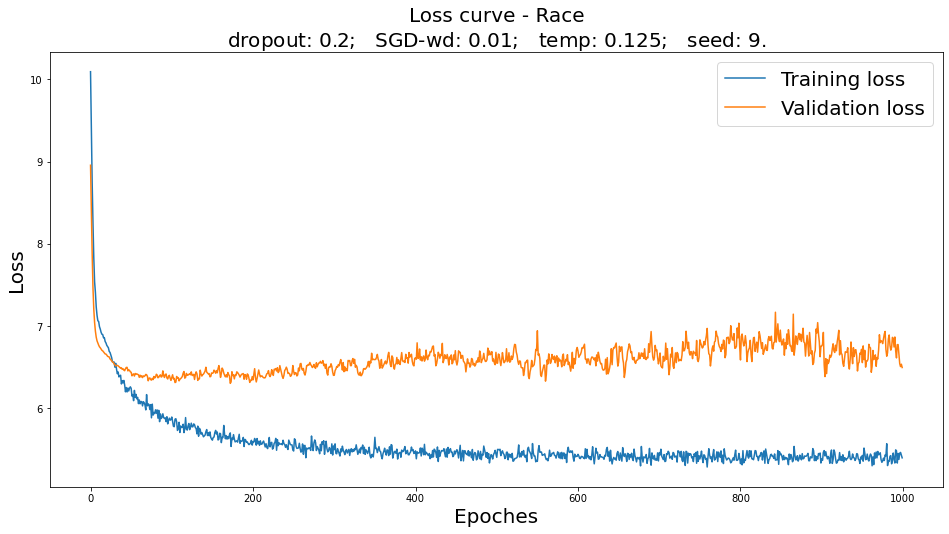

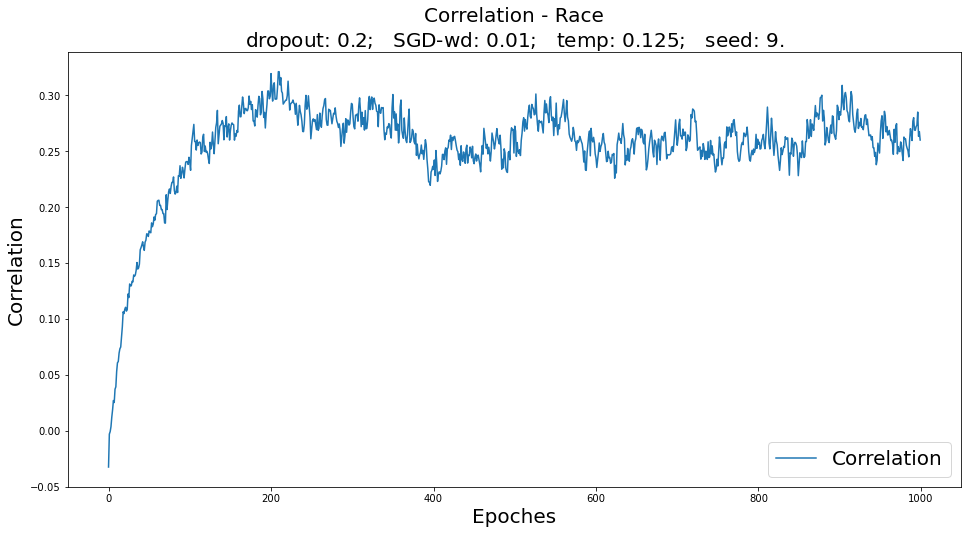

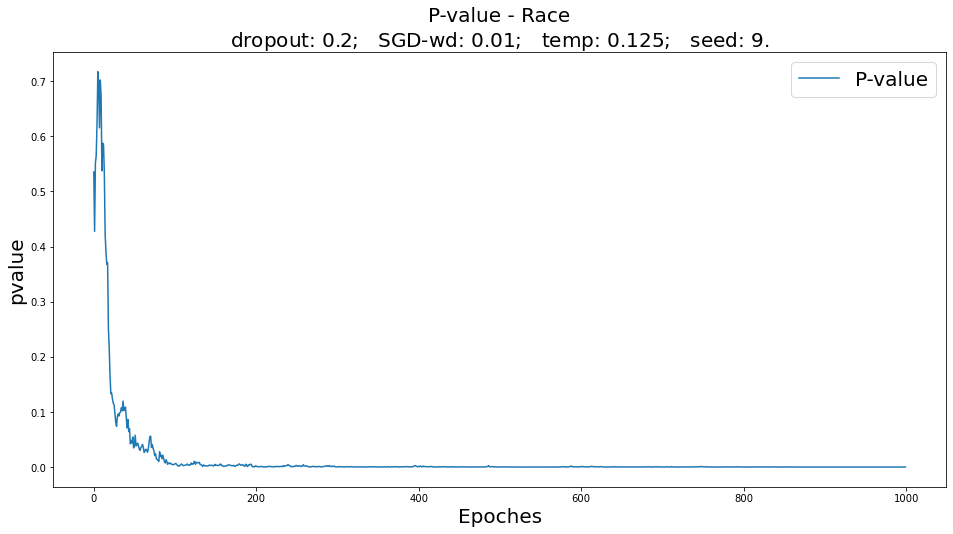

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.86%,86.61%
svm,84.76%,83.04%
rf,82.86%,85.71%


Prediction based on original microbiome data:


,Validation,Testing
logistic,73.33%,72.32%
svm,73.33%,72.32%
rf,80.95%,75.89%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,94.29%,95.54%
svm,96.19%,95.54%
rf,90.48%,87.50%


Prediction based on original metabolome data:


,Validation,Testing
logistic,93.33%,92.86%
svm,87.62%,91.07%
rf,81.90%,84.82%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


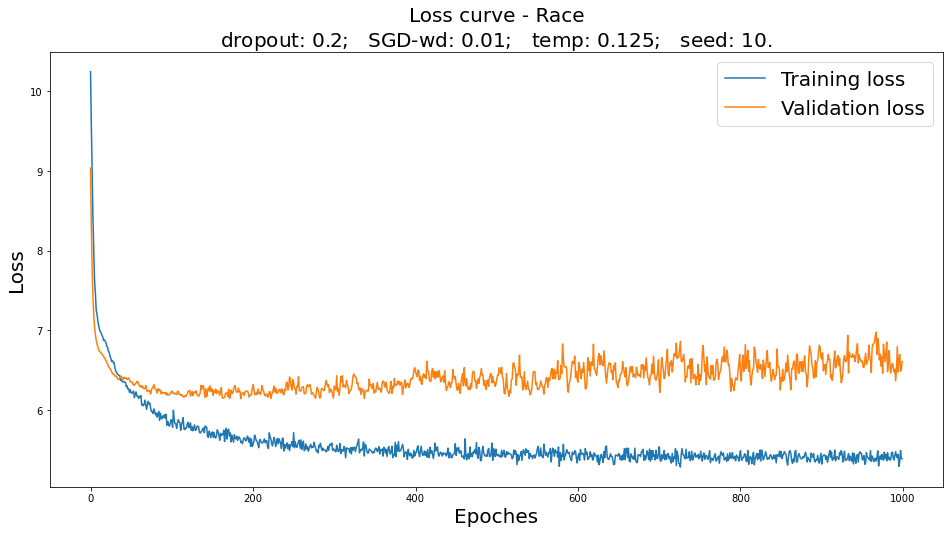

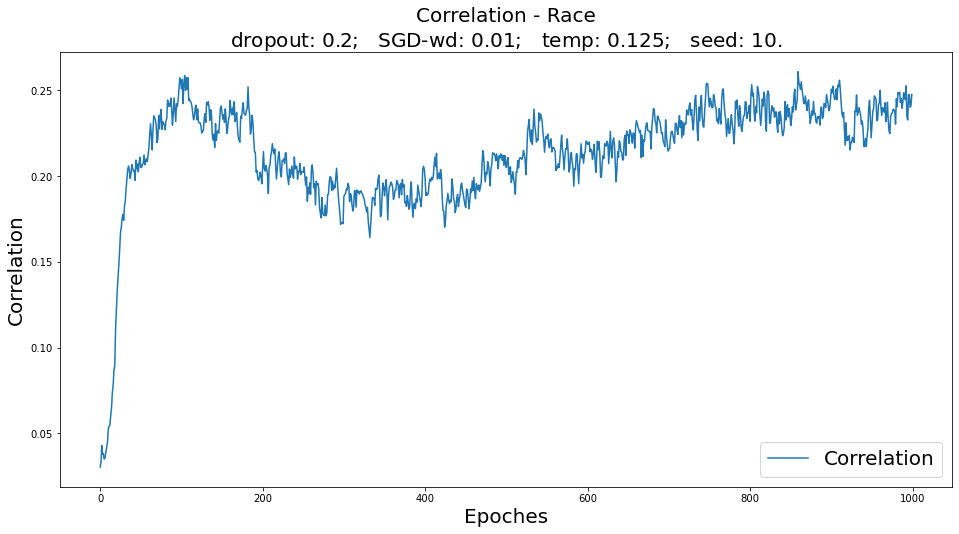

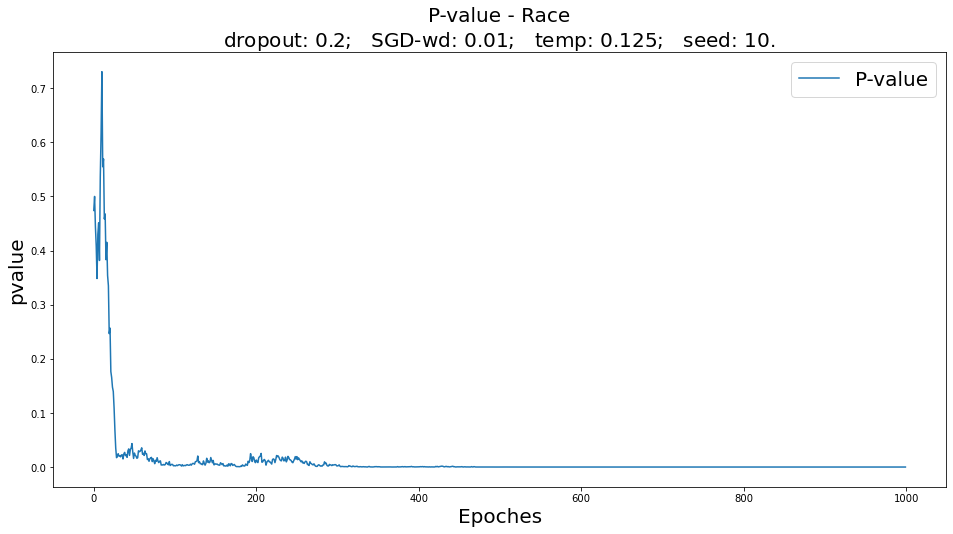

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,83.81%,83.93%
svm,83.81%,83.93%
rf,88.57%,81.25%


Prediction based on original microbiome data:


,Validation,Testing
logistic,72.38%,79.46%
svm,77.14%,70.54%
rf,80.95%,81.25%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,97.14%,96.43%
svm,97.14%,96.43%
rf,95.24%,93.75%


Prediction based on original metabolome data:


,Validation,Testing
logistic,97.14%,93.75%
svm,94.29%,89.29%
rf,85.71%,84.82%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


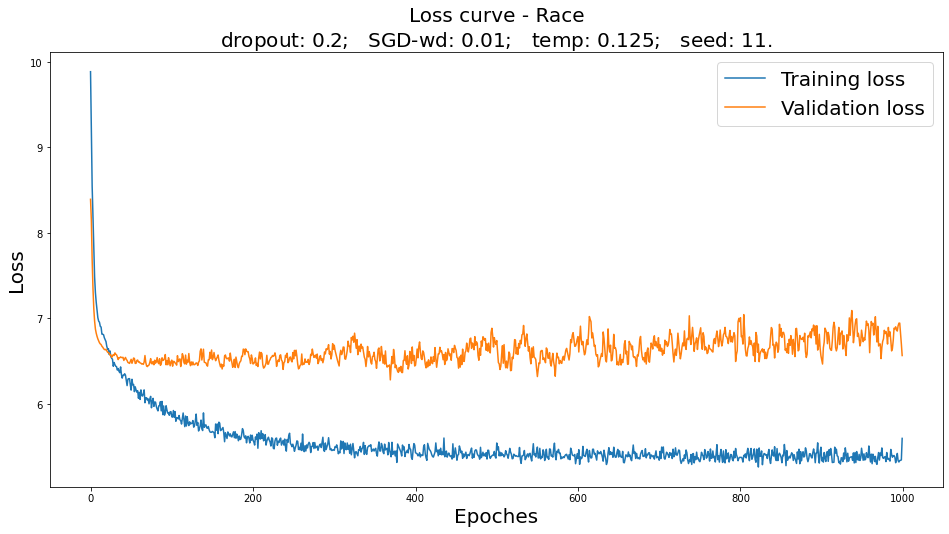

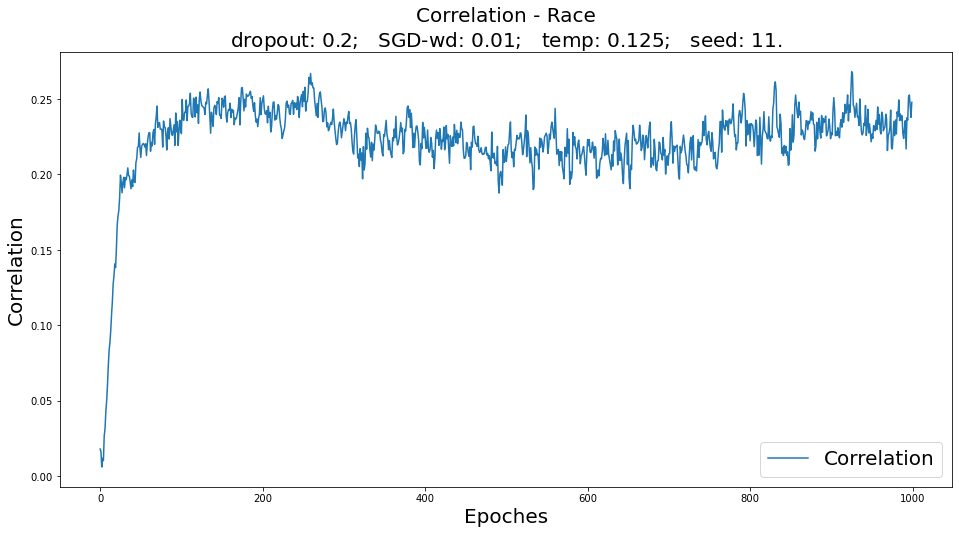

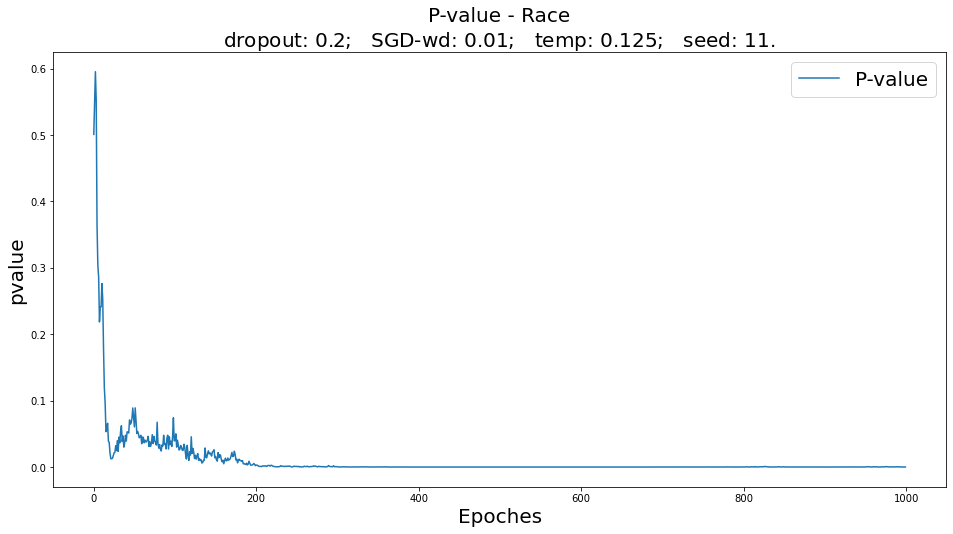

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.86%,82.14%
svm,82.86%,81.25%
rf,83.81%,83.04%


Prediction based on original microbiome data:


,Validation,Testing
logistic,68.57%,72.32%
svm,75.24%,74.11%
rf,82.86%,77.68%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,97.14%,97.32%
svm,97.14%,97.32%
rf,88.57%,91.96%


Prediction based on original metabolome data:


,Validation,Testing
logistic,91.43%,93.75%
svm,90.48%,87.50%
rf,87.62%,83.04%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


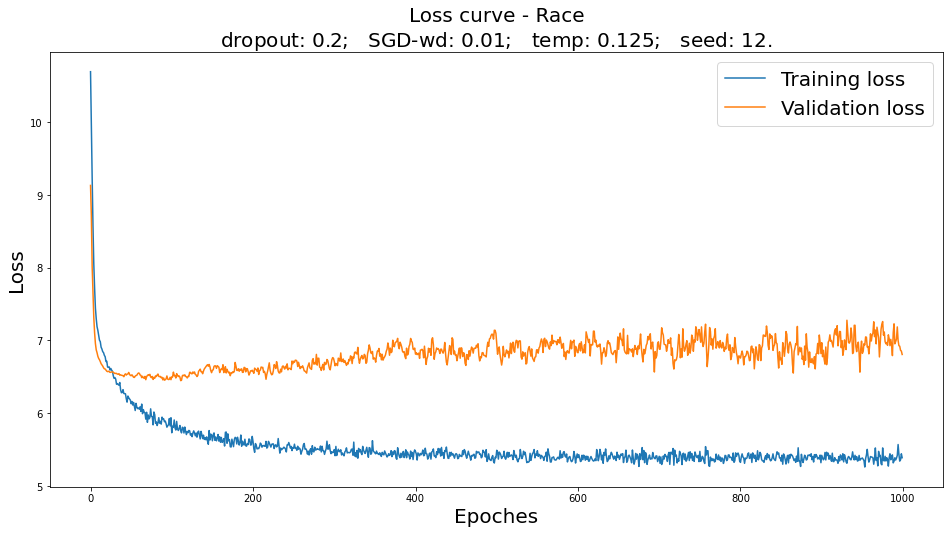

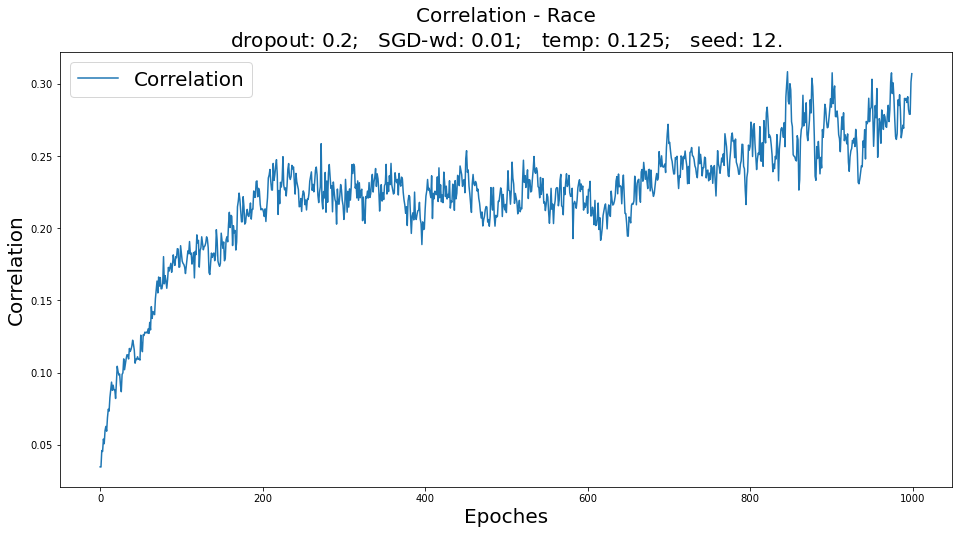

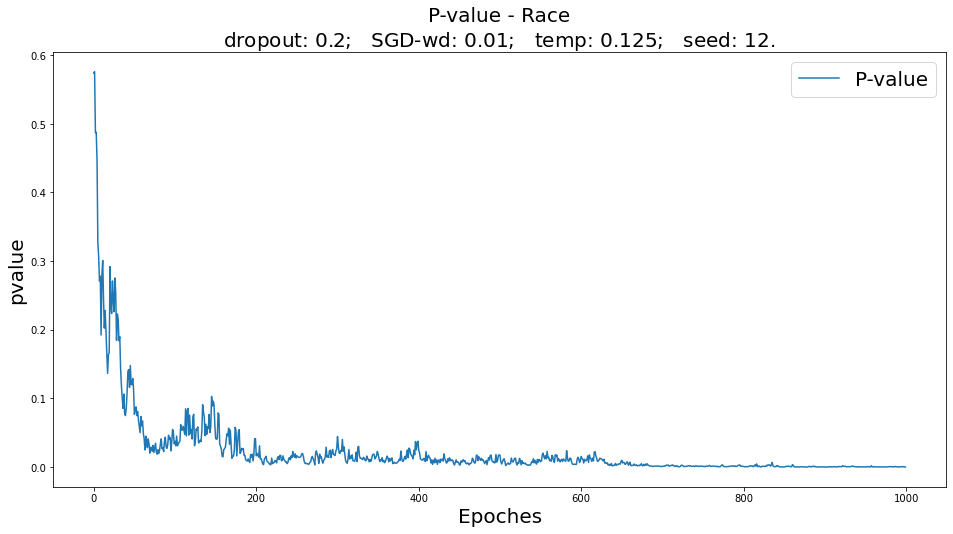

Prediction based on microbiome embeddings of MB-SupCon:


,Validation,Testing
logistic,82.86%,81.25%
svm,80.95%,82.14%
rf,80.00%,80.36%


Prediction based on original microbiome data:


,Validation,Testing
logistic,75.24%,75.89%
svm,73.33%,72.32%
rf,78.10%,75.00%


------------------------------------------------------------------
Prediction based on metabolome embeddings of MB-SupCon:


,Validation,Testing
logistic,93.33%,97.32%
svm,94.29%,97.32%
rf,86.67%,92.86%


Prediction based on original metabolome data:


,Validation,Testing
logistic,90.48%,92.86%
svm,90.48%,89.29%
rf,80.00%,82.14%


------------------------------------------------------------------
9282.679151773453
CPU times: user 2h 36min 53s, sys: 43.8 s, total: 2h 37min 37s
Wall time: 2h 34min 42s


In [8]:
%%time
start_time = time.time()

multi_omics_dict = {'gut_16s': gut_16s_df, 'metabolome': metabolome_df}
net_dict = {"gut_16s": [gut_16s_df.shape[1], 64, 16], 
            "metabolome": [metabolome_df.shape[1], 256, 64]}
predict_methods_list = ['logistic', 'svm', 'rf']

dropout_list = np.arange(0.2, 1, 0.2)
weight_decay_list = 0.01*2.**np.linspace(-2,5,8)
temp_list = 0.5*2.**np.linspace(-2,2,5)

microbiome_accuracy_embedding_dict, microbiome_accuracy_original_dict = dict(), dict()
import copy
for covariate in covariate_list:
    
    dropout = dropout_list[max_idx[covariate][0]]
    weight_decay = weight_decay_list[max_idx[covariate][1]]
    temperature = temp_list[max_idx[covariate][2]]
    
    g_valtest_accuracy_embedding = dict(list(zip(predict_methods_list,
             np.zeros(shape=(len(predict_methods_list), len(random_seed_list), 2)))))
    g_valtest_accuracy_original = dict(list(zip(predict_methods_list,
             np.zeros(shape=(len(predict_methods_list), len(random_seed_list), 2)))))
    for s, seed in enumerate(random_seed_list):
        MB_SupCon = MbSupConModel(covariate=covariate, indexes=indexes, multi_omics_dict=multi_omics_dict,
                                 df_with_covariates=gut_16s_df_subj, device=DEVICE,
                                 root_folder=SAVE_FOLDER, random_seed=seed)
        MB_SupCon.initialize(net_dict=net_dict, temperature=temperature,
                             dropout_rate=dropout, weight_decay=weight_decay)
        MB_SupCon.train_model(n_epoch=N_EPOCH, print_hist=False)
        MB_SupCon.plot_training(save=True)
        MB_SupCon.save_training()
        MB_SupCon.save_embedding()

        ### Predict based on embeddings by using different predictors
        predict_embedding_by_method_dict, predict_original_by_method_dict = dict(), dict()
        accuracy_embedding_dict, accuracy_original_dict = [dict.fromkeys(MB_SupCon.keys) for i in range(2)]
        for method in predict_methods_list:
            predict_embedding_by_method_dict[method] = MB_SupCon.predict_embedding(predict_method=method)
            g_valtest_accuracy_embedding[method][s] = \
                [predict_embedding_by_method_dict[method]['gut_16s']['val'][0],
                predict_embedding_by_method_dict[method]['gut_16s']['test'][0]]
            
            predict_original_by_method_dict[method] = MB_SupCon.predict_original(predict_method=method)
            g_valtest_accuracy_original[method][s] = \
                [predict_original_by_method_dict[method]['gut_16s']['val'][0], 
                predict_original_by_method_dict[method]['gut_16s']['test'][0]]

        for gm in MB_SupCon.keys:
            accuracy_embedding_dict[gm], accuracy_original_dict[gm] =\
                [pd.DataFrame(index=predict_methods_list, 
                              columns=['Validation', 'Testing']) for i in range(2)]
            for ii, method in enumerate(predict_methods_list):
                for jj, which_dataset in enumerate(['val', 'test']):
                    accuracy_embedding_dict[gm].iloc[ii, jj] = \
                        predict_embedding_by_method_dict[method][gm][which_dataset][0]
                    accuracy_original_dict[gm].iloc[ii, jj] = \
                        predict_original_by_method_dict[method][gm][which_dataset][0]

        print('Prediction based on microbiome embeddings of MB-SupCon:')
        display(accuracy_embedding_dict['gut_16s'].style.format(formatter="{:.2%}"))
        print('Prediction based on original microbiome data:')
        display(accuracy_original_dict['gut_16s'].style.format(formatter="{:.2%}"))
        print('------------------------------------------------------------------')
        print('Prediction based on metabolome embeddings of MB-SupCon:')
        display(accuracy_embedding_dict['metabolome'].style.format(formatter="{:.2%}"))
        print('Prediction based on original metabolome data:')
        display(accuracy_original_dict['metabolome'].style.format(formatter="{:.2%}"))
        print('------------------------------------------------------------------')
            
    microbiome_accuracy_embedding_dict[covariate] = g_valtest_accuracy_embedding
    microbiome_accuracy_original_dict[covariate] = g_valtest_accuracy_original

import pickle
with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_embedding_dict.pkl'), 'wb') as f:
    pickle.dump(microbiome_accuracy_embedding_dict, f)

with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_original_dict.pkl'), 'wb') as f:
    pickle.dump(microbiome_accuracy_original_dict, f)
    
end_time = time.time()
print(end_time - start_time)

## 3 Average prediction accuracy

### Original data

In [9]:
with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_original_dict.pkl'), 'rb') as f:
    microbiome_accuracy_original_dict = pickle.load(f)

In [10]:
microbiome_mean_accuracy_original_df_dict = dict()
for covariate in covariate_list:
    microbiome_mean_accuracy_original_df_dict[covariate] = pd.DataFrame(index=predict_methods_list,
                                                                       columns=['Validation', 'Testing'])
    for method in predict_methods_list:
        microbiome_mean_accuracy_original_df_dict[covariate].loc[method,:] = \
            np.mean(microbiome_accuracy_original_dict[covariate][method], axis=0)

In [11]:
for covariate in covariate_list:
    print('Covariate:', covariate)
    display(microbiome_mean_accuracy_original_df_dict[covariate].style.format(formatter="{:.2%}"))

Covariate: IR_IS_classification


,Validation,Testing
logistic,76.23%,76.69%
svm,79.63%,79.46%
rf,84.57%,83.93%


Covariate: Sex


,Validation,Testing
logistic,67.91%,65.61%
svm,69.94%,69.02%
rf,80.84%,80.38%


Covariate: Race


,Validation,Testing
logistic,72.30%,72.99%
svm,73.73%,72.17%
rf,80.56%,77.90%


### Embedding

In [24]:
with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_embedding_dict.pkl'), 'rb') as f:
    microbiome_accuracy_embedding_dict = pickle.load(f)

In [25]:
microbiome_mean_accuracy_embedding_df_dict = dict()
for covariate in covariate_list:
    microbiome_mean_accuracy_embedding_df_dict[covariate] = pd.DataFrame(index=predict_methods_list,
                                                                       columns=['Validation', 'Testing'])
    for method in predict_methods_list:
        microbiome_mean_accuracy_embedding_df_dict[covariate].loc[method,:] = \
            np.mean(microbiome_accuracy_embedding_dict[covariate][method], axis=0)

In [26]:
for covariate in covariate_list:
    print('Covariate:', covariate)
    display(microbiome_mean_accuracy_embedding_df_dict[covariate].style.format(formatter="{:.2%}"))

Covariate: IR_IS_classification


,Validation,Testing
logistic,83.23%,84.42%
svm,83.23%,85.12%
rf,83.54%,84.62%


Covariate: Sex


,Validation,Testing
logistic,82.01%,78.94%
svm,82.17%,79.02%
rf,81.54%,79.24%


Covariate: Race


,Validation,Testing
logistic,81.27%,80.73%
svm,81.59%,80.36%
rf,80.63%,79.91%


## 4 Scatterplots on lower-dimensional space for random seed 1

In [15]:
dim_reduction_list = ['pca']
random_seed_list = [1]


IR_IS_classification
n train: 382
n val: 81
n test: 84


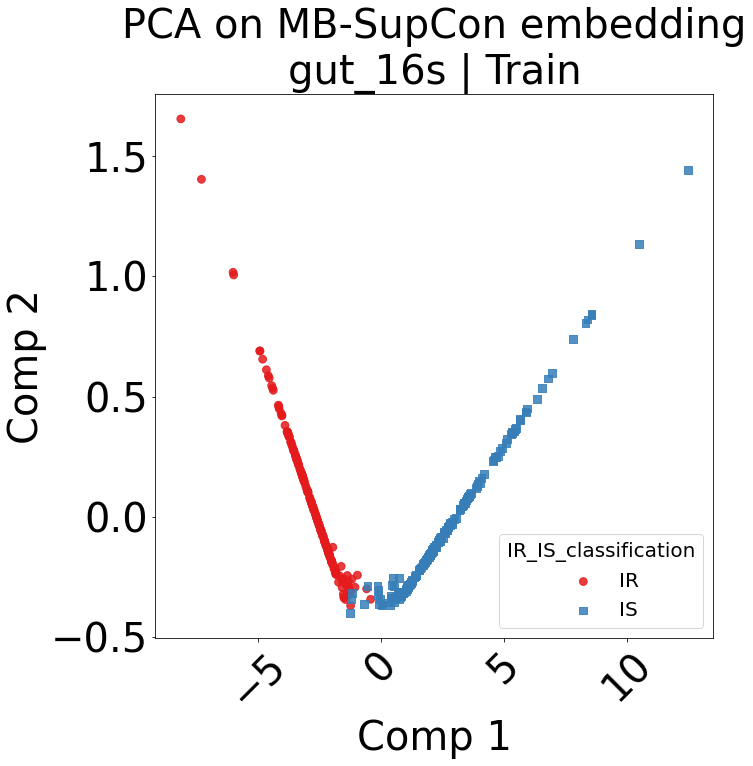

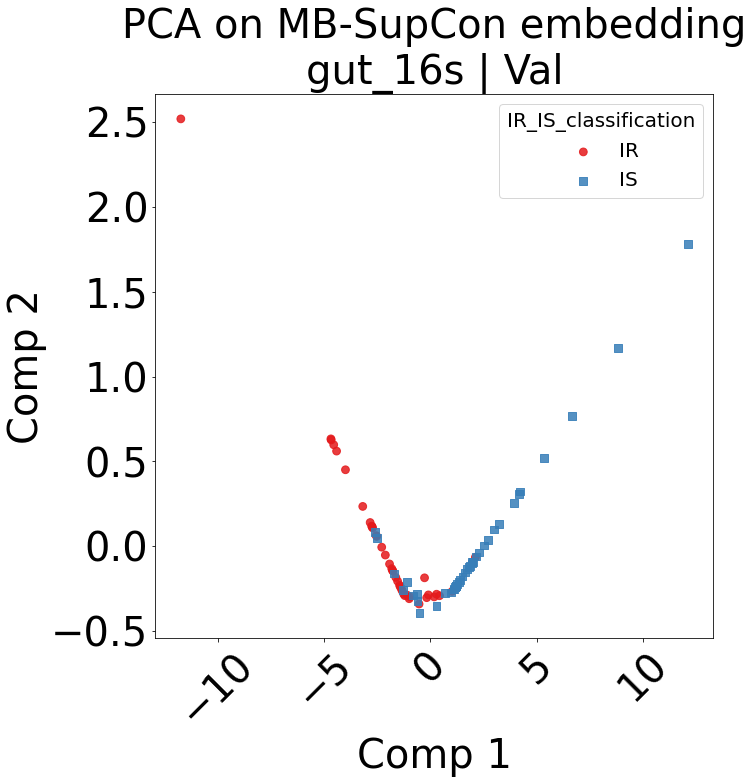

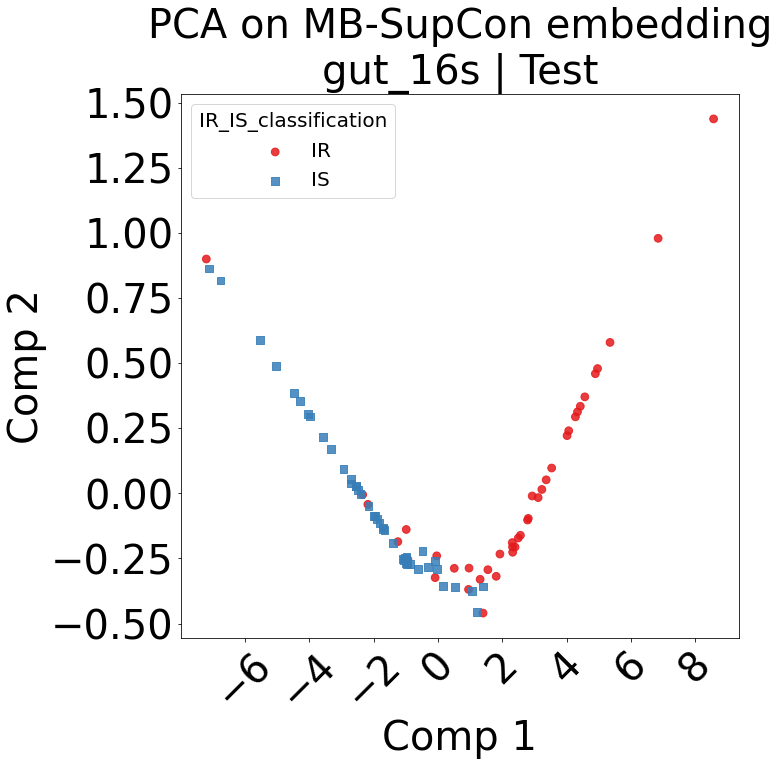

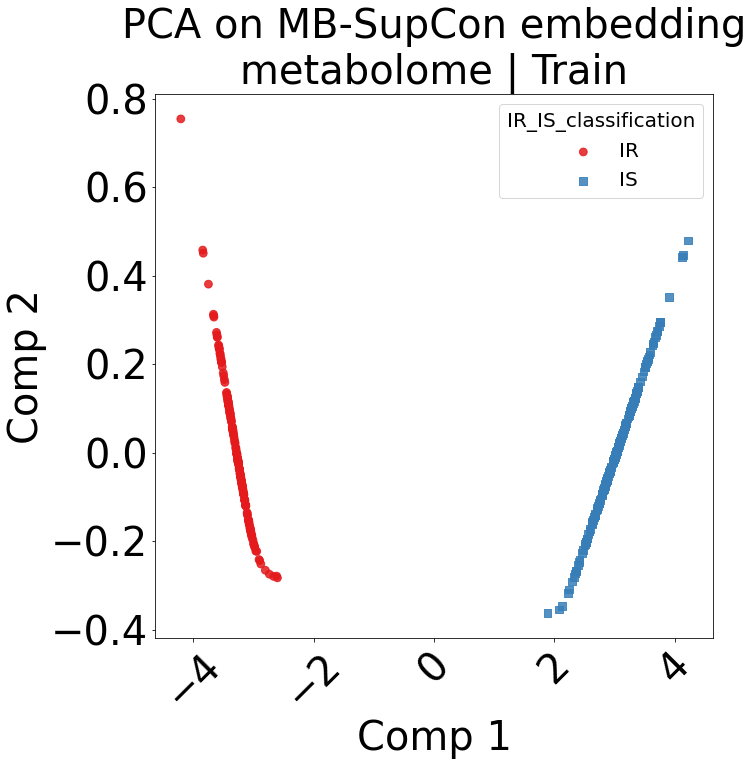

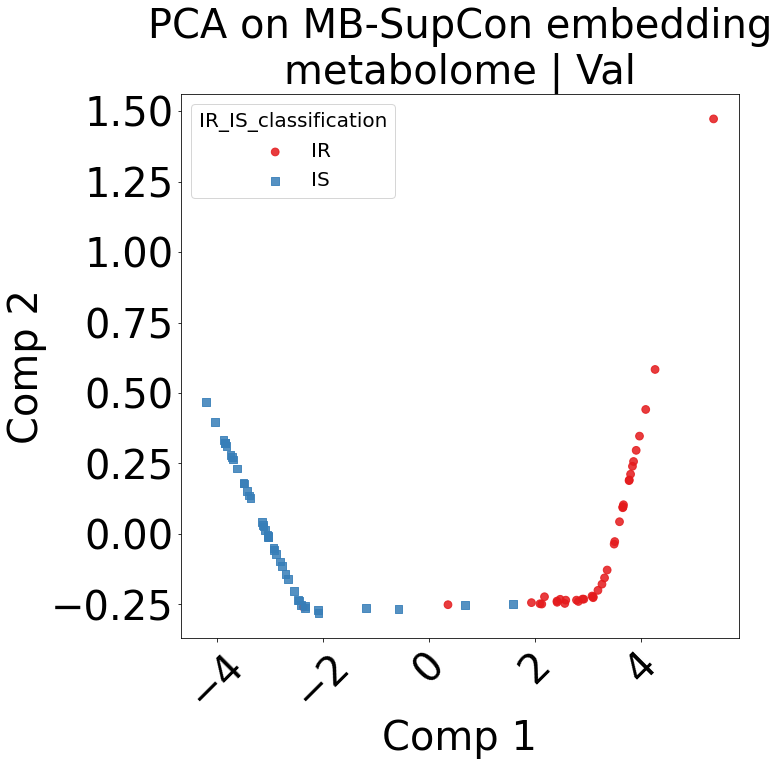

...

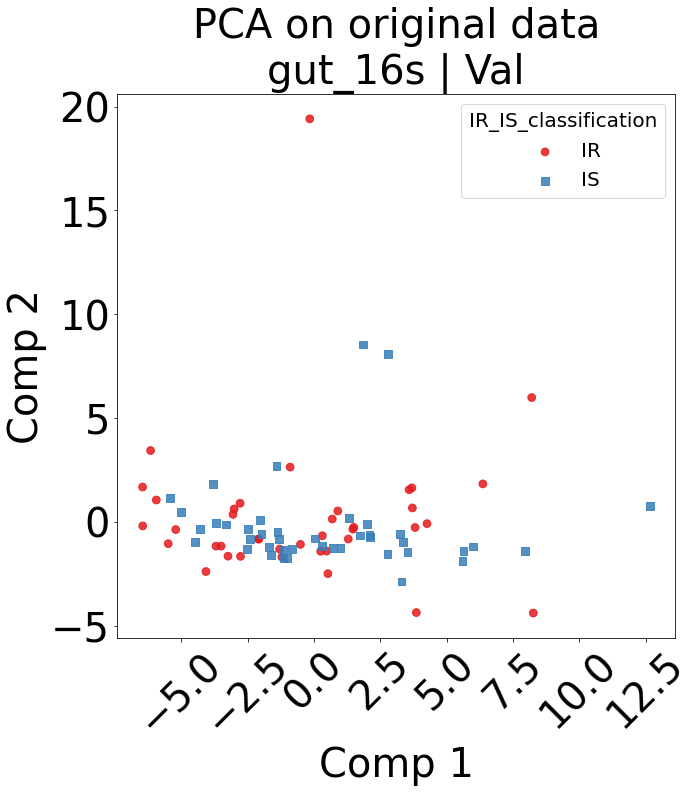

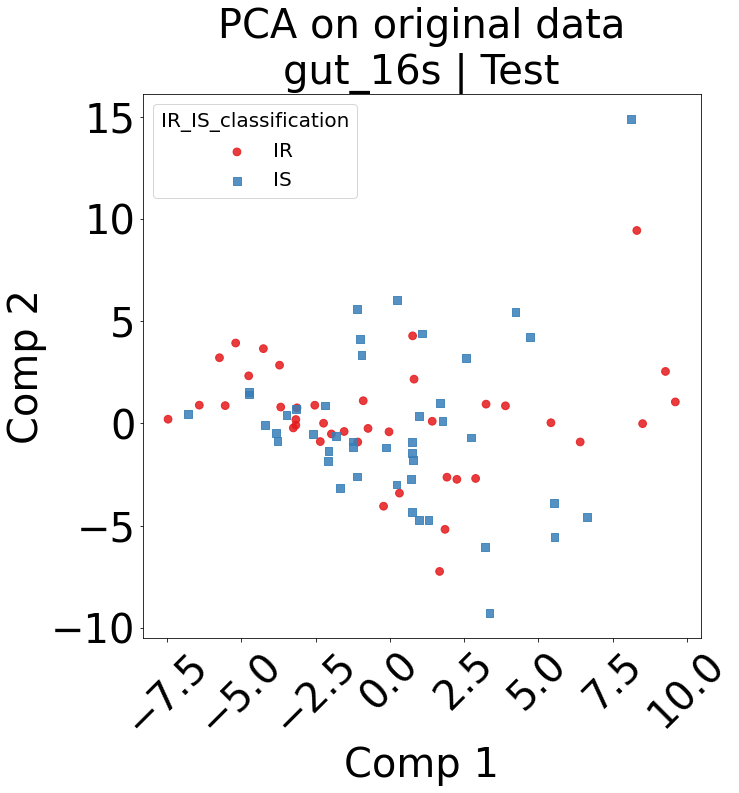

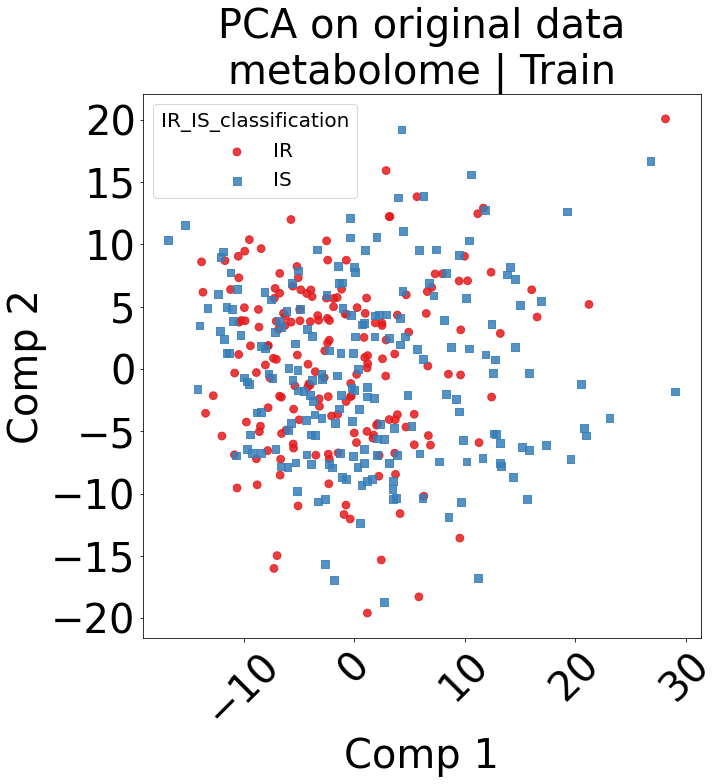

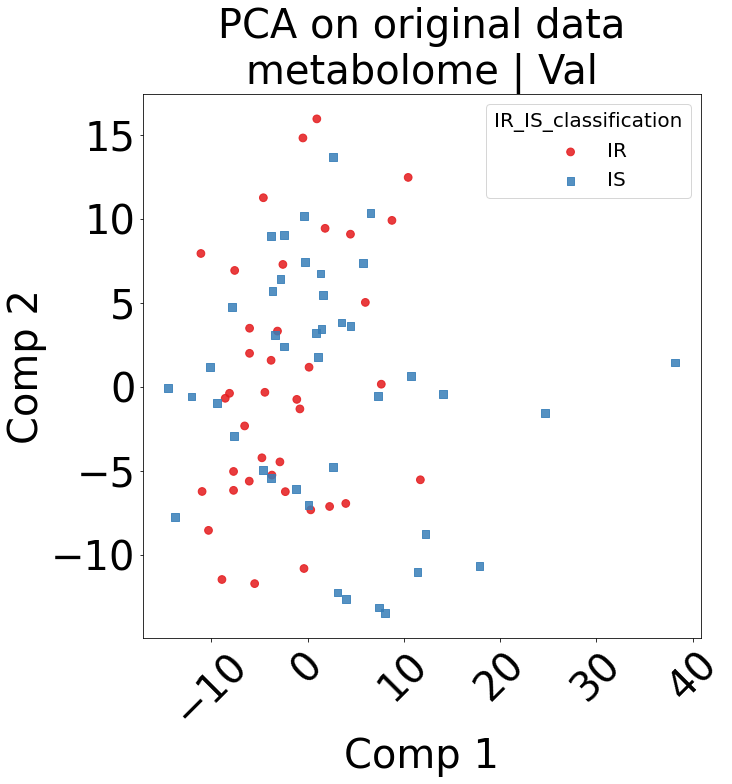

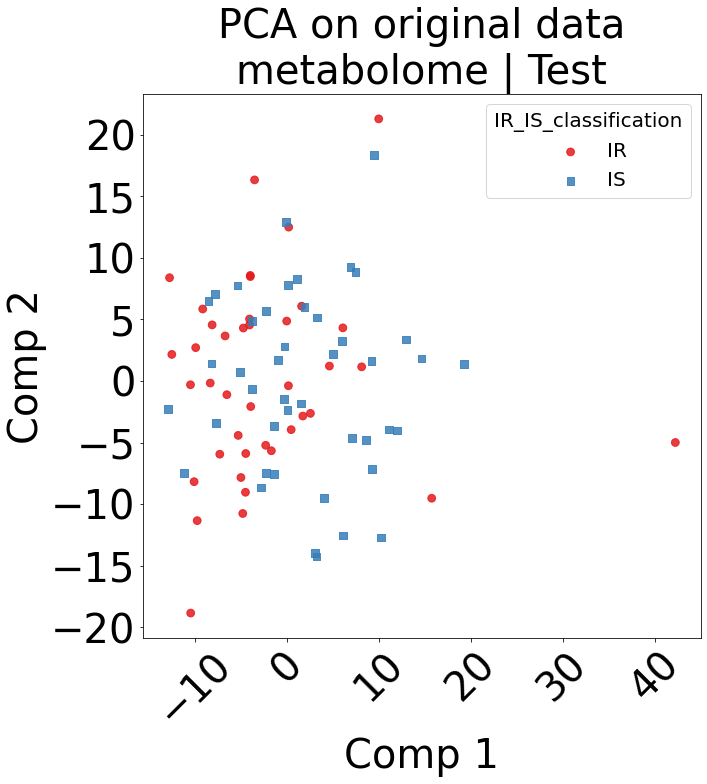


Sex
n train: 503
n val: 107
n test: 110


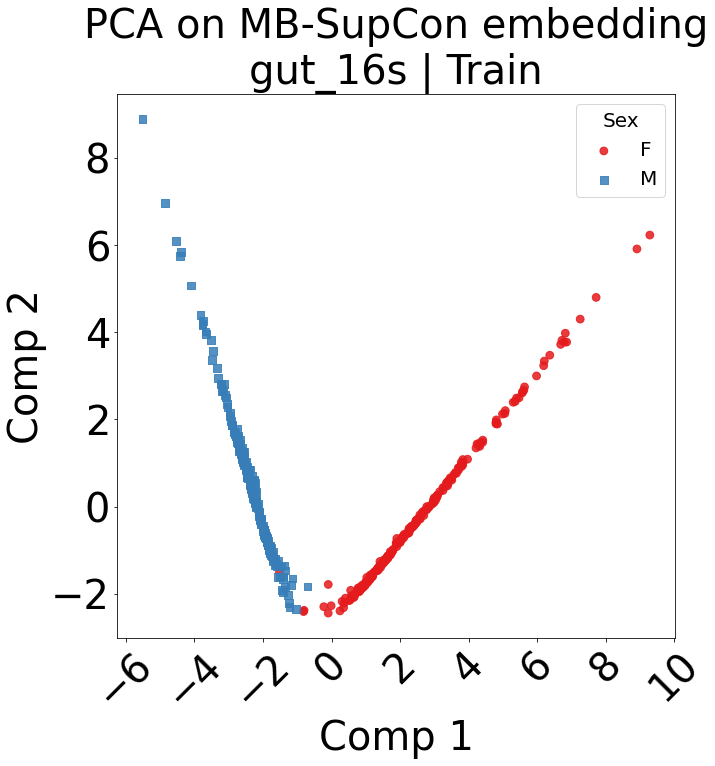

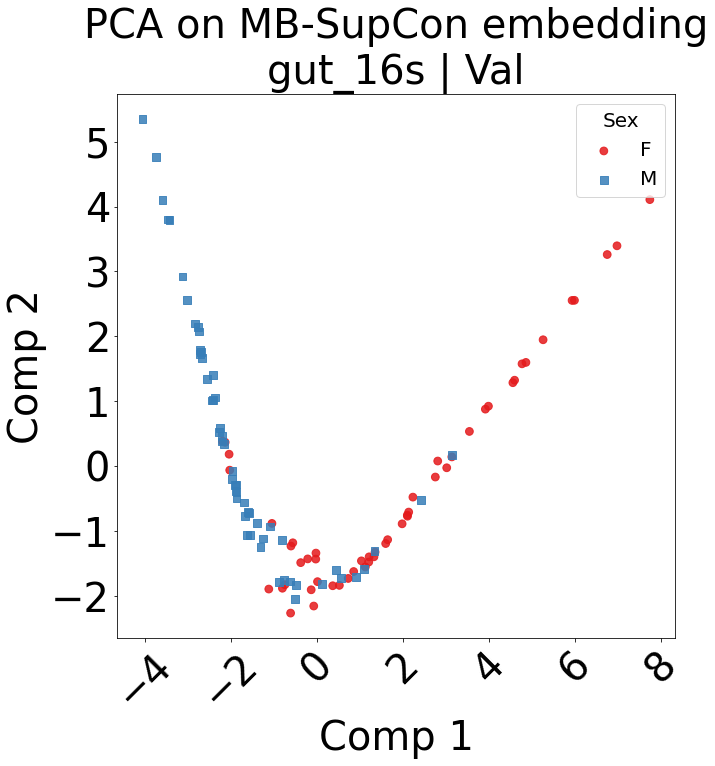

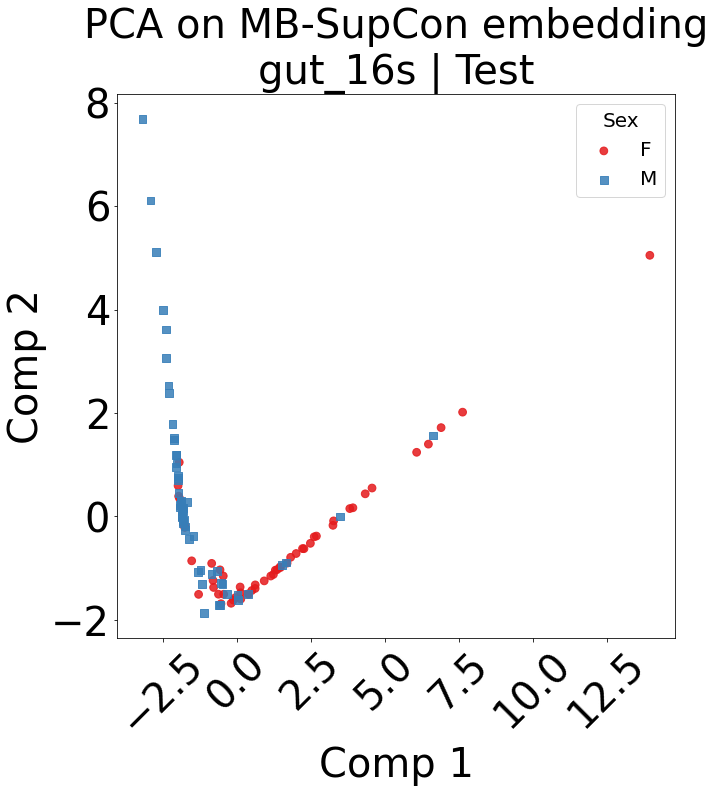

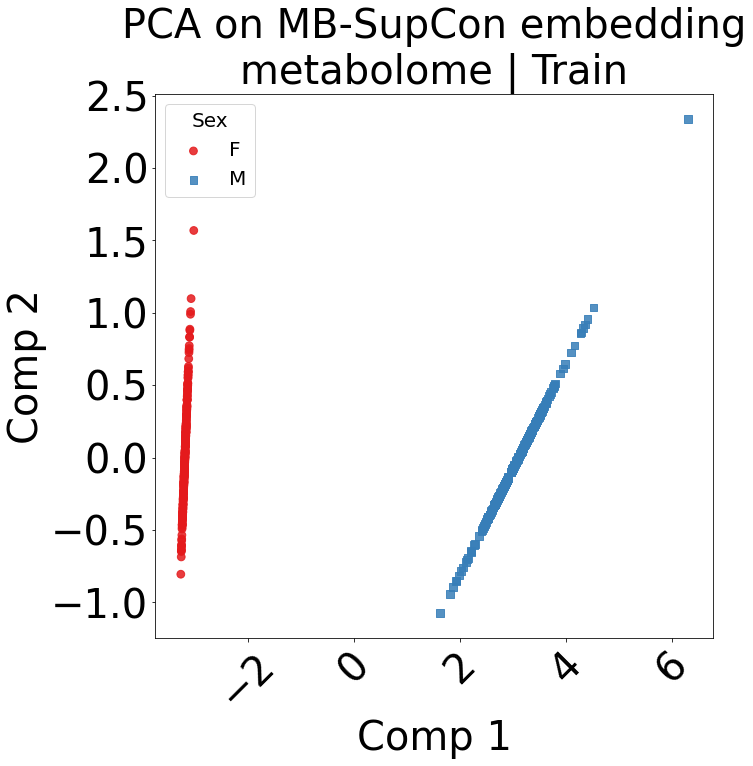

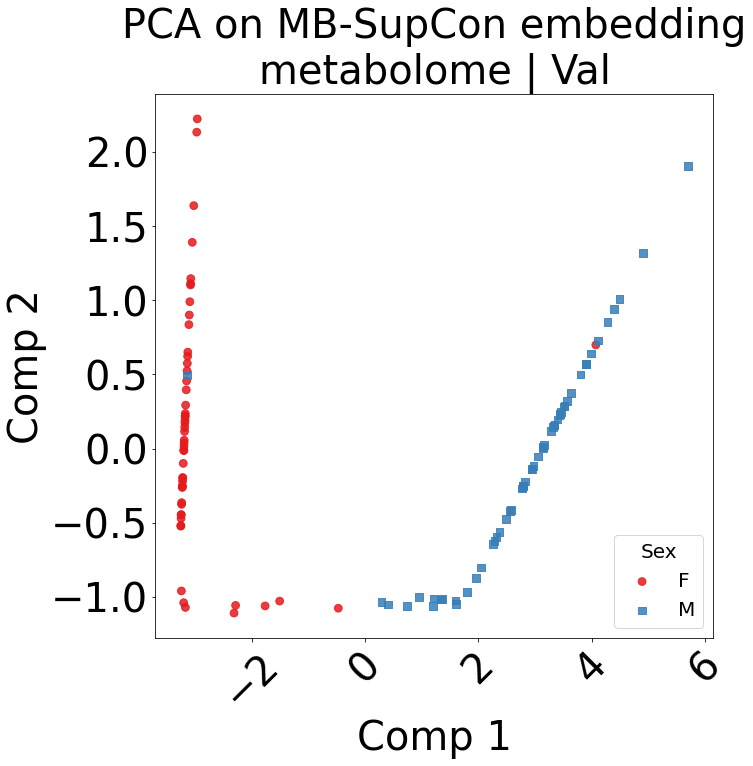

...

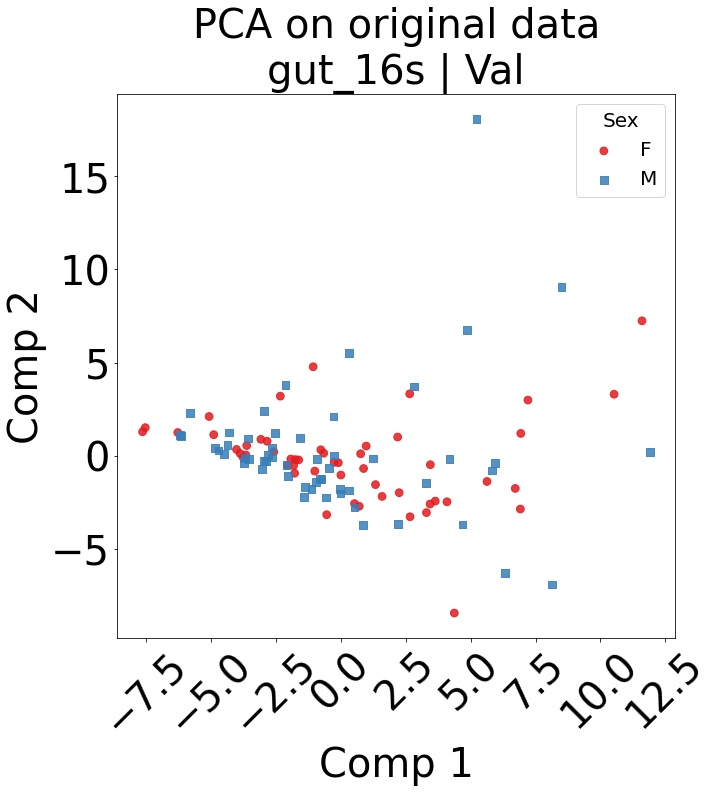

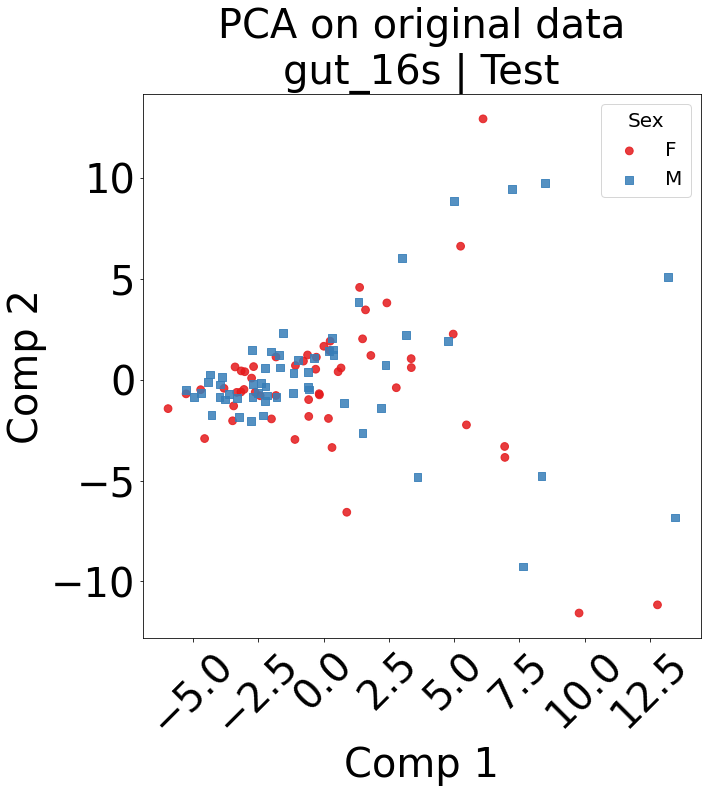

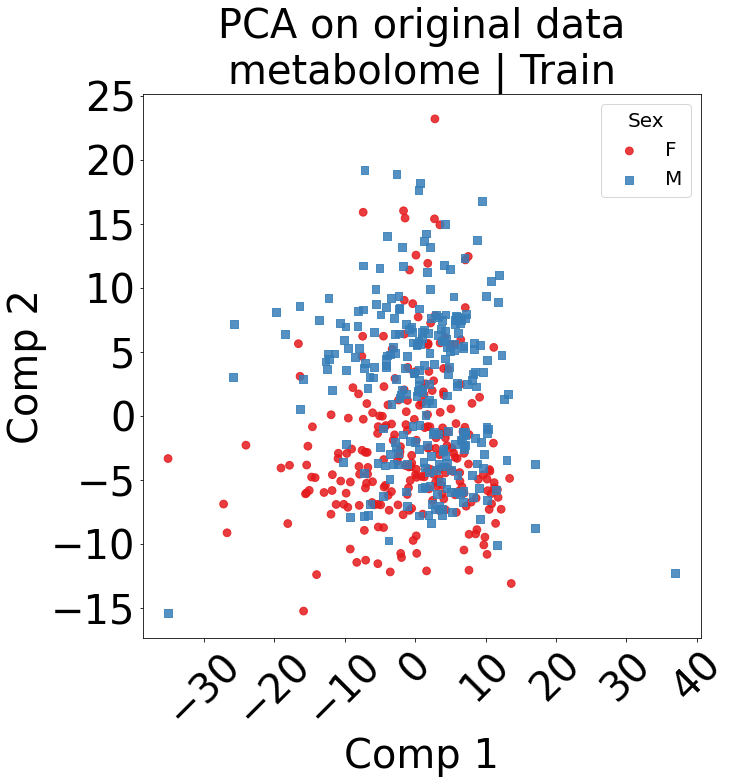

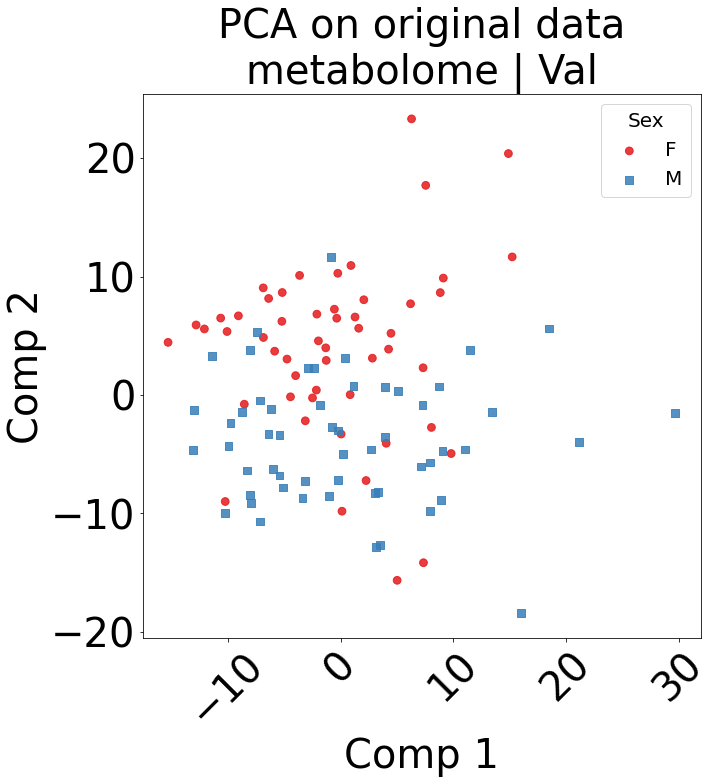

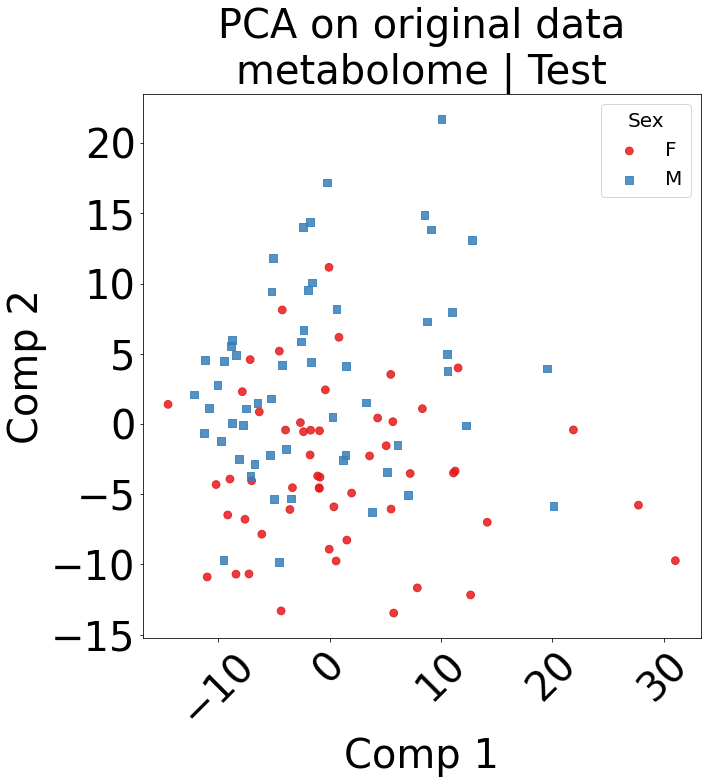


Race
n train: 501
n val: 105
n test: 112


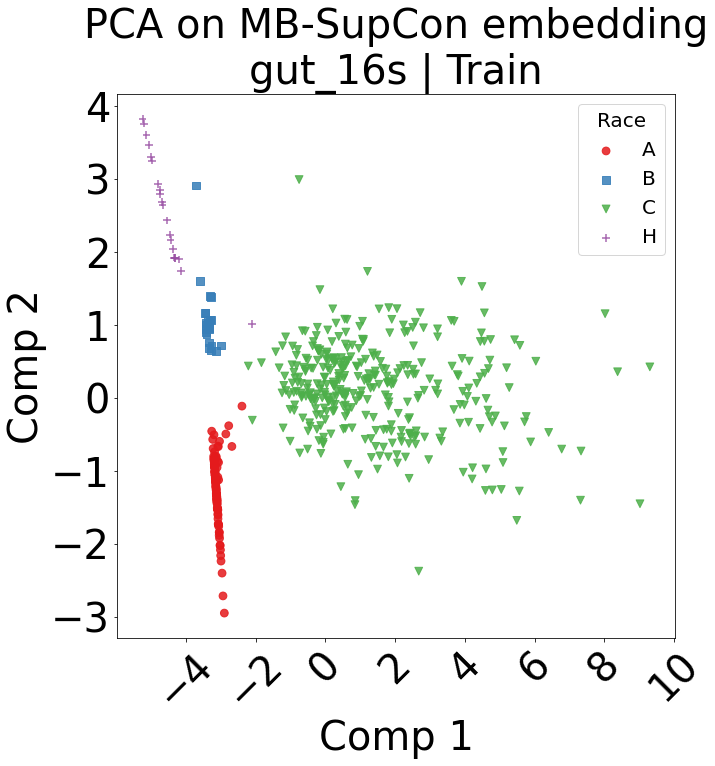

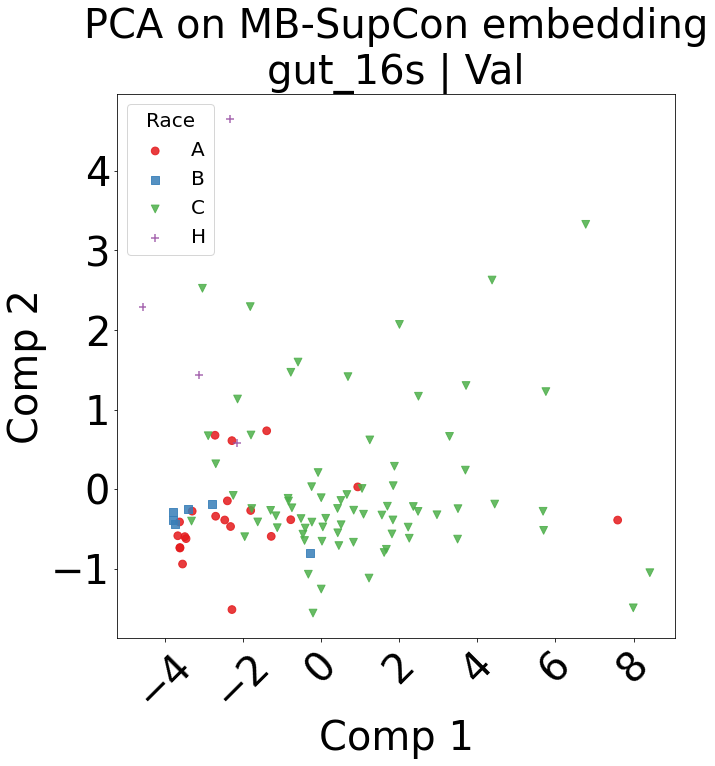

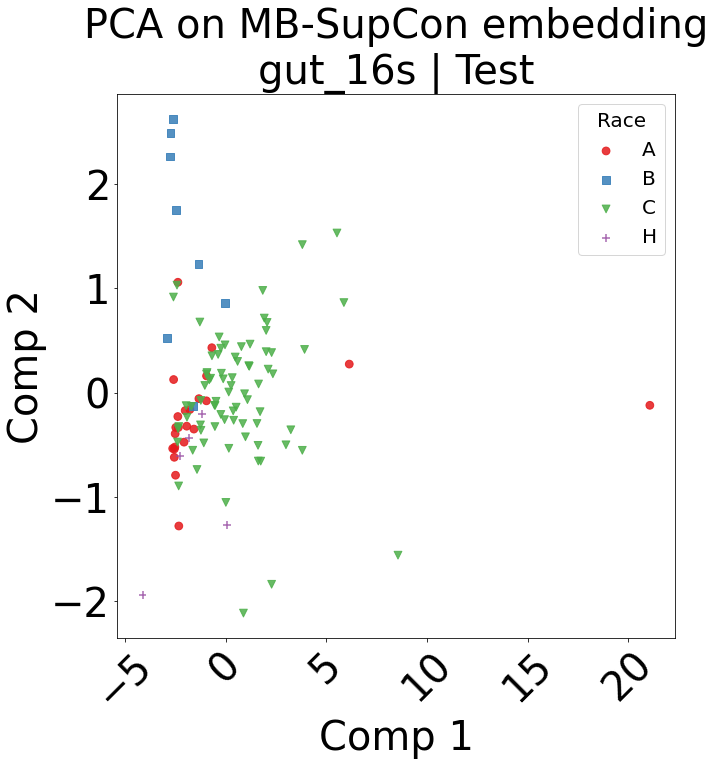

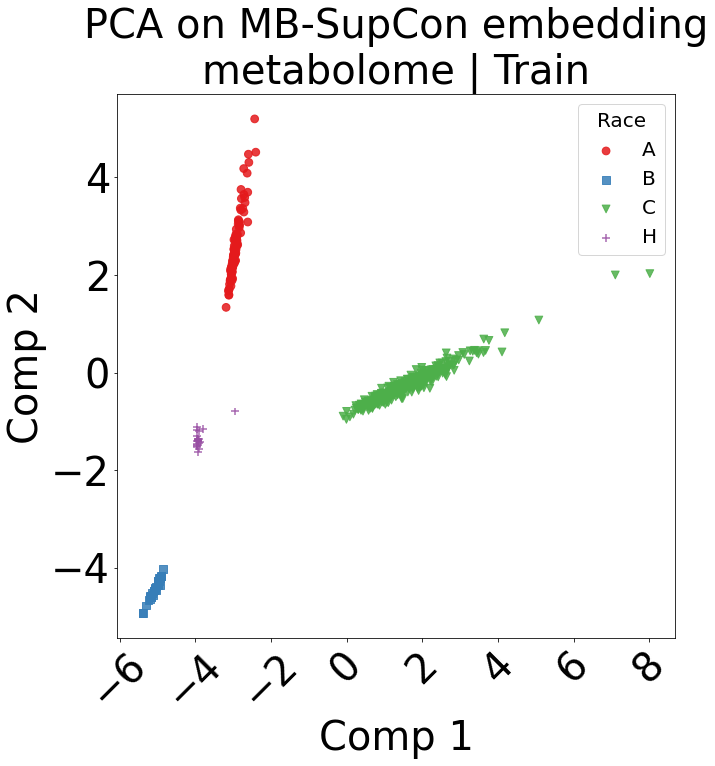

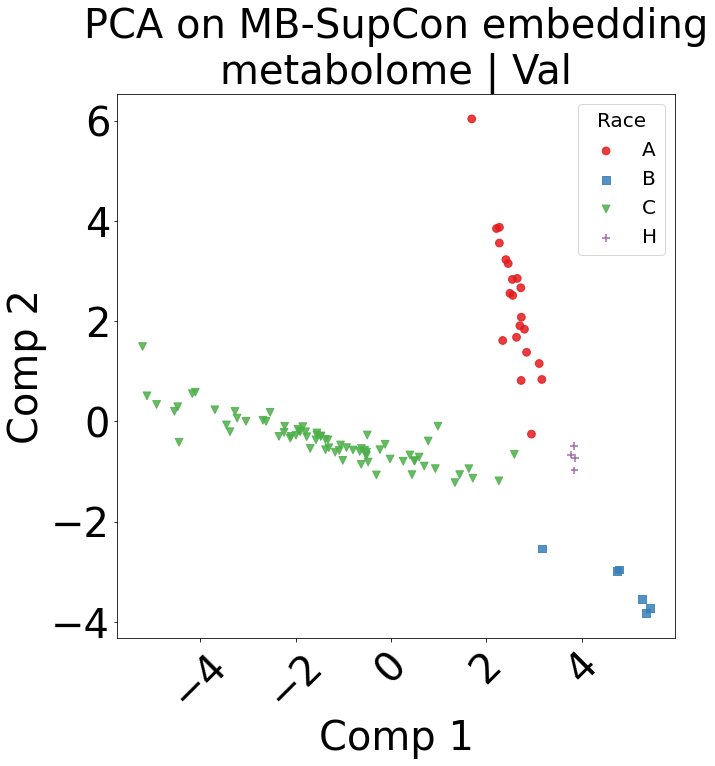

...

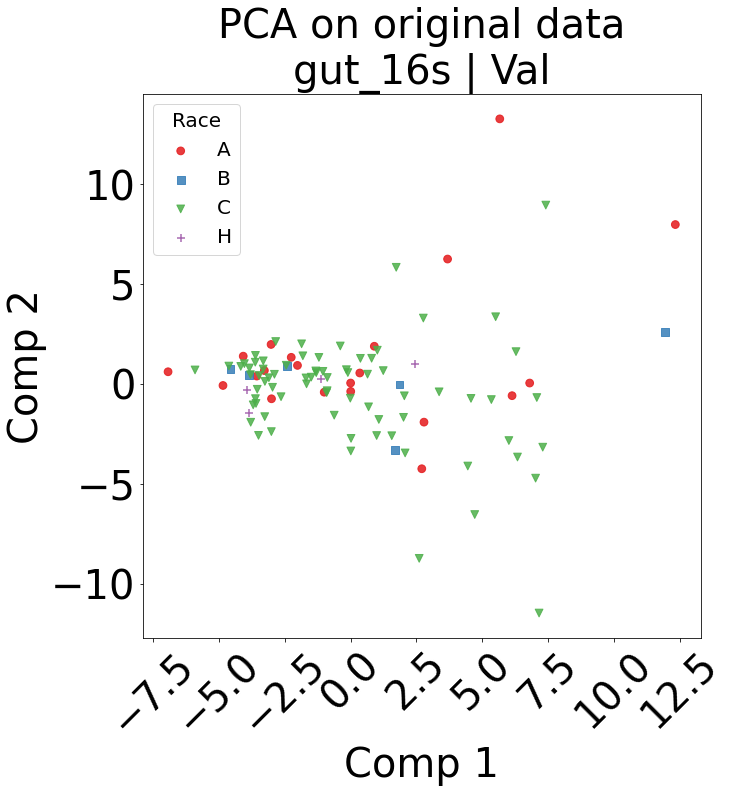

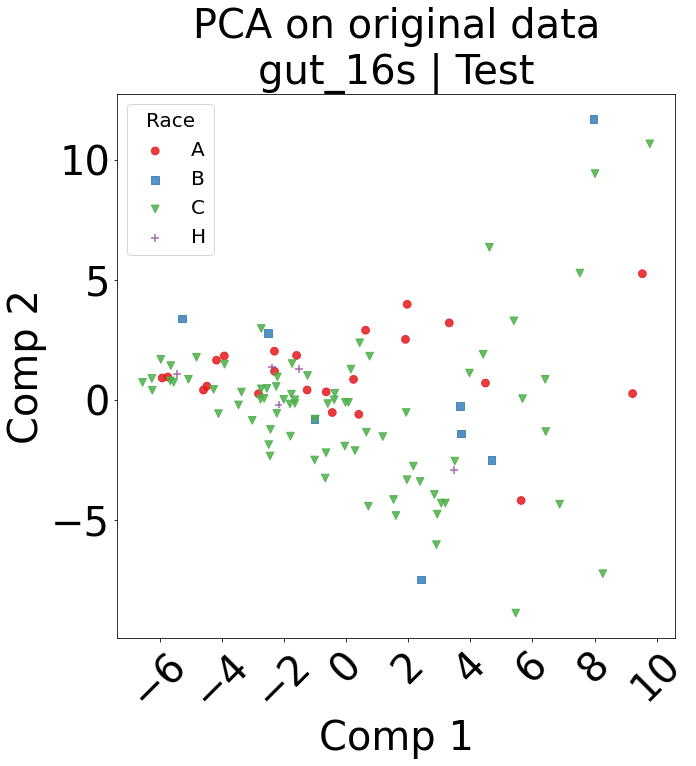

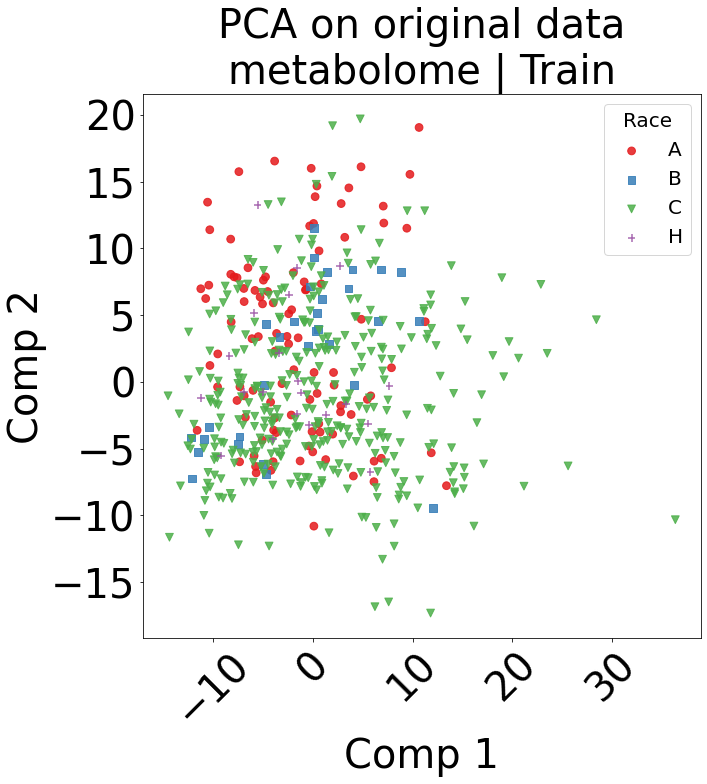

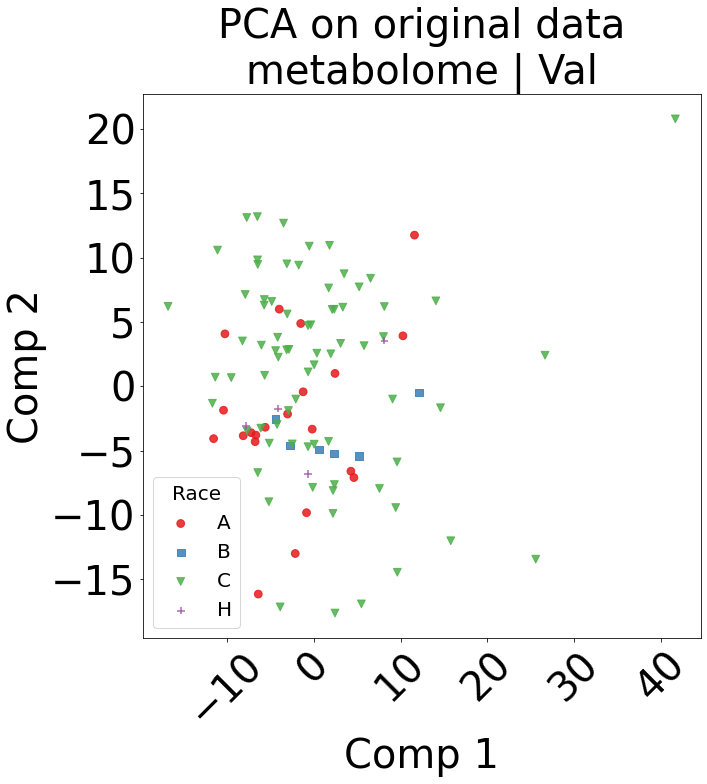

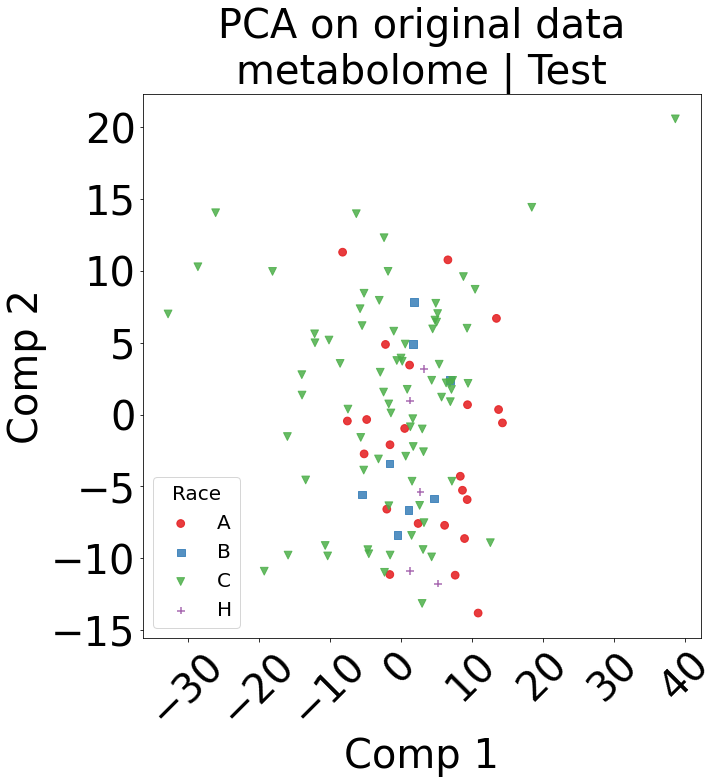

20.898189544677734
CPU times: user 2min 55s, sys: 11.9 s, total: 3min 7s
Wall time: 20.9 s


In [16]:
%%time
start_time = time.time()

for covariate in covariate_list:
    dropout = dropout_list[max_idx[covariate][0]]
    weight_decay = weight_decay_list[max_idx[covariate][1]]
    temperature = temp_list[max_idx[covariate][2]]

    for s, seed in enumerate(random_seed_list):
        ### load models, not necessary to train them again
        model_save_folder = os.path.join(SAVE_FOLDER, 'models/{}'.format(covariate))
        model_path = os.path.join(model_save_folder, 
                                  'MB-SupCon_{}_epoch-{}_temp-{}_dropout-{}_SGD-wd-{}_seed-{}.pth'.\
                         format(covariate, N_EPOCH, temperature, dropout, weight_decay, seed))
        
        embedding_save_folder = os.path.join(SAVE_FOLDER, 'embeddings/{}'.format(covariate))
        embedding_path = os.path.join(embedding_save_folder, 
                                      'embeddings_{}_epoch-{}_temp-{}_dropout-{}_SGD-wd-{}_seed-{}.pkl').\
              format(covariate, N_EPOCH, temperature, dropout, weight_decay, seed)
        
        
        MB_SupCon = MbSupConModel(covariate=covariate, indexes=indexes, multi_omics_dict=multi_omics_dict,
                                 df_with_covariates=gut_16s_df_subj, device=DEVICE,
                                 root_folder=SAVE_FOLDER, random_seed=seed)
        MB_SupCon.initialize(net_dict=net_dict, temperature=temperature, 
                             dropout_rate=dropout, weight_decay=weight_decay)
        MB_SupCon.load_model(model_path, embedding_path)
        
        for dim_reduction in dim_reduction_list:
            MB_SupCon.dim_reduction_embedding(dim_reduction_method = dim_reduction, fontsize=40)
            MB_SupCon.dim_reduction_original(dim_reduction_method = dim_reduction, fontsize=40)
        
        ## Save index split 
        indexes_train, indexes_val, indexes_test = MB_SupCon.indexes_split
            
        os.makedirs('./data/index/{}'.format(covariate), exist_ok=True)
        np.savetxt('./data/index/{}/indexes_noukn.txt'.format(covariate), MB_SupCon.indexes_no_ukn, fmt='%s')
        np.savetxt('./data/index/{}/indexes_train.txt'.format(covariate), indexes_train, fmt='%s')
        np.savetxt('./data/index/{}/indexes_val.txt'.format(covariate), indexes_val, fmt='%s')
        np.savetxt('./data/index/{}/indexes_test.txt'.format(covariate), indexes_test, fmt='%s')
    
end_time = time.time()
print(end_time - start_time)

### Environment

In [17]:
import platform
print(platform.system())
print(platform.release())

Linux
3.10.0-957.el7.x86_64


In [18]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.device(0))
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
0
4
Tesla V100-SXM2-32GB


In [19]:
from platform import python_version

print(python_version())

3.8.5


In [20]:
!conda list -p /work/PCDC/s198665/conda_envs/envir_MB-SupCon

# packages in environment at /work/PCDC/s198665/conda_envs/envir_MB-SupCon:
#
# Name                    Version                   Build  Channel
_libgcc_mutex             0.1                        main  
_openmp_mutex             4.5                       1_gnu  
attrs                     21.4.0             pyhd3eb1b0_0  
backcall                  0.2.0              pyhd3eb1b0_0  
birdears                  0.3.4                    pypi_0    pypi
blas                      1.0                         mkl  
ca-certificates           2021.10.8            ha878542_0    conda-forge
certifi                   2021.10.8        py38h578d9bd_1    conda-forge
colorama                  0.4.4              pyh9f0ad1d_0    conda-forge
cudatoolkit               11.0.221             h6bb024c_0  
cycler                    0.10.0                   py38_0  
dbus                      1.13.18              hb2f20db_0  
debugpy                   1.4.1            py38h295c915_0  
decorator                 5.1.